# Import

In [122]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import time
import tqdm

#from pytrends.request import TrendReq
import datetime
from iso3166 import countries
from prophet import Prophet
import warnings
warnings.filterwarnings("ignore")
import math
import statsmodels.api as sm # 21.12.13 OLS analysis

import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn import model_selection, svm, metrics
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.model_selection import GridSearchCV

from sklearn import model_selection, svm, metrics
from sklearn.svm import SVR, LinearSVC
from lightgbm import LGBMRegressor, plot_importance

from openpyxl import load_workbook
import openpyxl.utils.dataframe
from openpyxl.utils.dataframe import dataframe_to_rows
import xlwings as xw
import logging
from itertools import combinations
import shutil


%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='Malgun Gothic') # For Windows

In [139]:
###############################################
###        실행 전 조정 변수 및 Flag        ###
###############################################
m_rows_init = 104       ### Gfk 실적 기준   = 25.8
m_rows_2_init = 120     ### 예측기간 기준   = 26.12
first_fcst = "N"        ### 머신러닝예측치 저장파일 신규 생성 여부 (매월 처음실행만 "Y", 이후는 "N" 으로 조정하여 Append함)
exclude_covid = "Y"     ### COVID로 인한 Pent-up 수요기간 제외 여부 (기본 N)
use_google_trends = "Y" ### 구글트렌드 인자 사용여부 (기본 Y)
###############################################

pred_iloc = m_rows_init%3 # 당분기 가져올 실적갯수
covid = 0
m_rows_init_org = m_rows_init
m_rows_2_init_org = m_rows_2_init

print("첫번째 실행 여부: ",first_fcst)
print("COVID 구간 제외 여부: ",exclude_covid)
print("구글트렌드 사용 여부: ",use_google_trends)

첫번째 실행 여부:  N
COVID 구간 제외 여부:  Y
구글트렌드 사용 여부:  Y


In [140]:
#############################
ML_dir = "D:/05. SCM DX개선"
PG_dir = "10. TV시장수요예측"
prod_type = "TV sales"
gt_key = ["Google Trends TV"]
#############################

file_dir_sub = r"{}\{}\0.ALL\subsidiary_name.csv".format(ML_dir, PG_dir)

df_subsidiary = pd.DataFrame()
df_subsidiary = pd.read_csv(file_dir_sub)
subs_no = len(df_subsidiary[df_subsidiary['ml_fcst']=="Y"])+1
print("예측국가수:",subs_no-1)
subs_no = len(df_subsidiary)+1
print("국가수:",subs_no-1)

예측국가수: 20
국가수: 33


# 국가별 시장예측 인자선정 단계

# 상관계수 확인

  0%|          | 0/1 [00:00<?, ?it/s]

-------
(33, 15)
구글트렌드 적용: N
법인명: 22.FI
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월
(92, 124)
['TV sales', 'Switch Index', 'Sales Tax Rate', 'Construction Output', 'Full Year GDP Growth', 'Current Account', 'Residential Property Prices']
['TV sales', 'Foreign Direct Investment', 'Households Debt to GDP', 'Temperature', 'Households Debt to Income', 'Home Ownership Rate', 'Job Vacancy Rate']


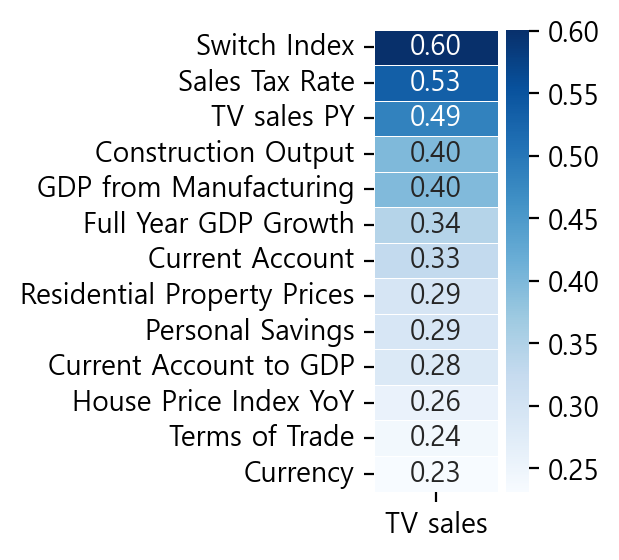

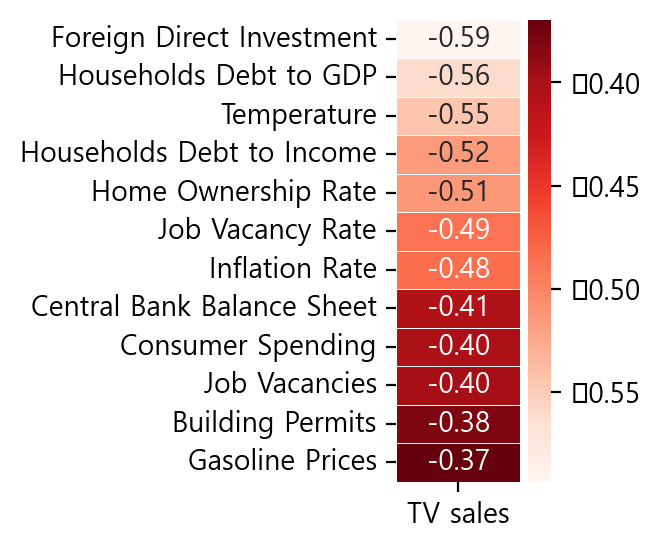

In [147]:
##############################################################################################################
### sub_i = SW 19 DK 20 NO 21 FI 22 HK 33 ###
##############################################################################################################

sub_i = 22

for sub_i in tqdm.tqdm_notebook(range(sub_i,sub_i+1,1)):

    m_rows_init = m_rows_init_org
    m_rows_2_init = m_rows_2_init_org

    file_dir_sub = "{}/{}/0.ALL/subsidiary_name.csv".format(ML_dir, PG_dir)
    # 법인정보 가져오기 #
    df_subsidiary = pd.DataFrame()
    df_subsidiary = pd.read_csv(file_dir_sub)
        
    ##### flag 추가 24.09.12 #####
    if df_subsidiary["ml_fcst"][sub_i-1] == "Y":
    
        print("-------")
        print(df_subsidiary.shape)
        df_subsidiary_name = list(df_subsidiary["subsidiary_name"])
        subsidiary_name = df_subsidiary_name[sub_i-1]

        google_trends_yn = df_subsidiary.loc[sub_i-1,"google_trends"]
        if use_google_trends == "Y":
            print("구글트렌드 적용: "+google_trends_yn)

        print("법인명: "+subsidiary_name)

        file_dir = "{}/{}/{}/Raw/historical_indicator_Q.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir2 = "{}/{}/{}/corr_data.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir3 = "{}/{}/{}/regression_data.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir4 = "{}/{}/{}/regression_pred_data.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir5 = "{}/{}/{}/regression_data_m.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir6 = "{}/{}/{}/regression_pred_data_m.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir7 = "{}/{}/{}/regression_data_m_f.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir8 = "{}/{}/{}/regression_pred_data_m_c.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir9 = "{}/{}/{}/regression_pred_data_fn.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir10 = "{}/{}/{}/Raw/feature_names.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir11 = "{}/{}/{}/regression_data_m_c.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir12 = "{}/{}/{}/regression_pred_data_m_c_lgbm.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir13 = "{}/{}/{}/regression_pred_data_m_c_svm.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir14 = "{}/{}/{}/regression_pred_data_m_lgbm.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir15 = "{}/{}/{}/regression_data_m_c_svm.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir16 = "{}/{}/{}/test_composite.xlsx".format(ML_dir, PG_dir, subsidiary_name)
        file_dir17 = "{}/{}/{}/regression_data_m_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir18 = "{}/{}/{}/regression_pred_data_m_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir19 = "{}/{}/{}/corr_data_wo_covid.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir20 = "{}/{}/{}/test.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir21 = "{}/{}/{}/test_composite_Q.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir22 = "{}/{}/{}/regression_data_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir23 = "{}/{}/{}/regression_pred_data_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir24 = "{}/{}/{}/regression_data_m_f_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir25 = "{}/{}/{}/regression_data_m_lgbm.csv".format(ML_dir, PG_dir, subsidiary_name)
        file_dir26 = "{}/{}/{}/te_forecast.csv".format(ML_dir, PG_dir, subsidiary_name)


        df = pd.read_csv(file_dir)

        covid_start = 0
        covid_end = 0
        covid_range = 0


        if exclude_covid == "Y":
            covid_start = df[df["COVID_YN"]==1].index[0:].min()   # COVID 시작
            covid_end = df[df["COVID_YN"]==1].index[0:].max()+1   # COVID 끝

        # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질 2016년 부터
        #     covid_start = covid_start + 12 
        #     covid_end = covid_end + 12

        covid_range = covid_end - covid_start
        exclude_covid_org = exclude_covid

        if np.isnan(covid_range):
            exclude_covid = "N" # Pent-up 수요기간 없을 경우


        # 23.04.12 제외 
        # if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
        #     df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
        #     df = df.reset_index(drop=True)

#         print(df.shape)
        print("COVID 구간 제외 여부: ",exclude_covid)
        print("COVID 구간 : ",covid_range)
        df_org = df.copy()


        # 23.4.12 추가
        if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
            m_rows_init = m_rows_init + 12         # 2020.01
            m_rows_2_init = m_rows_2_init + 12     # 2020.12

        m_rows = m_rows_init    
        m_rows_2 = m_rows_2_init  


        ### m_rows 추가 조정 ###
        if exclude_covid == "Y" :
            m_rows = m_rows-covid_range
            m_rows_2 = m_rows_2-covid_range

        # 23.4.12 제외
        # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
        #     m_rows = m_rows + 12         # 2020.01
        #     m_rows_2 = m_rows_2 + 12     # 2020.12
        ### m_rows 추가 조정 ###


        t_size = m_rows_2-m_rows     # 예측기간
        q_loc = 0      # Q+1 시작점


        org_feature_no = df.shape[1]-2 # Features
        max_feature_adj = 0 # max_feature 조정시 1 / 아닐경우 0
        max_feature_no = 0 

        # if subsidiary_name == "07.PL" or subsidiary_name == "09.MS": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 7

        # if subsidiary_name == "01.CI" or subsidiary_name == "14.IL" or subsidiary_name == "06.IS": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 8

        # if subsidiary_name == "02.US": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 8

        # if subsidiary_name == "08.UK": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 12

        max_feature_adj = df_subsidiary["dependency"][sub_i-1]
        max_feature_no = df_subsidiary["max_no"][sub_i-1]
        mov_no = df_subsidiary["mov"][sub_i-1]

        print("max_feature 조정값:(No=0/Yes=1)", max_feature_adj)
        print("max_feature 갯수:", max_feature_no)
        print("feature 범위: 0 ~ -", mov_no,"개월")


        # M0 ~ M+6 TV sales와 인자별 상관계수 분석
        # 상관분석 M+1

        # for mov in range (1,7,1):    # 6개월 선행관계 확인
        for mov in range (0,7,1):    # 6개월 선행관계 확인

            df_TV_sales = pd.DataFrame()
            df_features = pd.DataFrame()
            df_features_mov = pd.DataFrame()

            df_TV_sales = df_org.iloc[covid:m_rows_init,:3]

            df_TV_sales = df_TV_sales.reset_index(drop=True)

            # 24.01.29 변경 mov=0 추가
            if mov == 0:
                ######
                df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+1]
                df = pd.concat([df_TV_sales, df_features], axis=1)
                ######
            else:

                # 23.4.12 변경
                df_features = df_org.iloc[covid:covid+1,3:org_feature_no+1]
                for item in range (1, mov, 1):
                    # df_features = df_features.append(df_org.iloc[covid:covid+1,3:org_feature_no+1], ignore_index=True)
                    df_features = pd.concat([df_features,df_org.iloc[covid:covid+1,3:org_feature_no+1]], ignore_index=True)
                # 변경 완료
                # df_features = df_features.append(df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2], ignore_index=True)
                df_features = pd.concat([df_features,df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2]], ignore_index=True)

                df = pd.concat([df_TV_sales, df_features], axis=1)

            # 23.4.12 추가
            if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
                df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
                df = df.reset_index(drop=True)

        #     if mov == 1:
#             if mov == 0:
#                 print(df.shape)
           
            # Jessica Revision
            num_df = df.select_dtypes(include=[np.number])
            df_cor = num_df.corr()
            # df_cor = df.corr()
            num = df_cor._get_numeric_data()
            num[num < 0] = num*-1

            corr_data_pros = pd.DataFrame()
            corr_data_cons = pd.DataFrame()
            corr_data_pros = num_df.corr().iloc[:,[0]]
            corr_data_cons = num_df.corr().iloc[:,[0]]
            corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
            corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

            corr_data_pros["mov"] = mov
            corr_data_pros.index.name = 'feature'

            if exclude_covid == "Y" :
                if not os.path.exists(file_dir19):
                    corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
                else:
        #             if mov==1:
                    if mov==0:
                        corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        corr_data_pros.to_csv(file_dir19, index=True, mode='a', encoding='utf-8-sig', header=False)
            else:            
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir2):
                    corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
                else:
        #             if mov==1:
                    if mov==0:
                        corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        corr_data_pros.to_csv(file_dir2, index=True, mode='a', encoding='utf-8-sig', header=False)


        # TV sales vs 지표별 상관계수

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_init-1, 3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)  


        # Jessica Revision
        num_df = df.select_dtypes(include=[np.number])
        df_cor = num_df.corr()
        # df_cor = df.corr()
        num = df_cor._get_numeric_data()
        num[num < 0] = num*-1

        corr_data = pd.DataFrame()
        corr_data_pros = pd.DataFrame()
        corr_data_cons = pd.DataFrame()
        corr_data = num_df.corr().iloc[:,[0]]
        corr_data_pros = num_df.corr().iloc[:,[0]]
        corr_data_cons = num_df.corr().iloc[:,[0]]
        corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
        corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

        plt.figure(figsize=(1,3))
        sns.heatmap(data = corr_data_pros.iloc[1:14,[0]], annot=True, 
        fmt = '.2f', linewidths=.3, cmap='Blues')
        plt.figure(figsize=(1,3))
        sns.heatmap(data = corr_data_cons.iloc[:12,[0]], annot=True, 
        fmt = '.2f', linewidths=.3, cmap='Reds')

        corr_data_pros_index1 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[1:3].tolist() + corr_data_pros.index[4:5].tolist() + corr_data_pros.index[6:9].tolist()
        corr_data_pros_index2 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[8:14].tolist()
#         corr_data_pros_index3 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[14:20].tolist()
        corr_data_cons_index1 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[0:6].tolist()
        corr_data_cons_index2 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[6:12].tolist()
        print(corr_data_pros_index1)
        print(corr_data_cons_index1)

        ### 그래프 최대값 ###
        max_sales = (max(df[prod_type]) // 10**(len(str(int(max(df[prod_type])))) - 1) + 1) * 10**(len(str(int(max(df[prod_type])))) - 1)

#########################################################
######## ----- 여기까지 필수로 실행할 것 ----- ##########
#########################################################

# Prophet(시계열기반) 수요예측

10:12:53 - cmdstanpy - INFO - Chain [1] start processing
10:12:53 - cmdstanpy - INFO - Chain [1] done processing


(113, 1)
Prophet model forecast


Text(0.5, 1.0, 'TV sales Forecast: by Prophet')

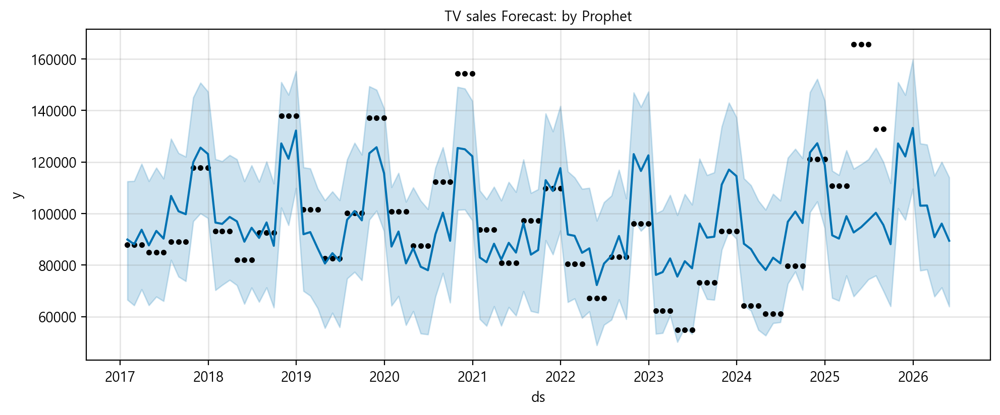

In [79]:
df_tv = df[["ds", prod_type]]
df_tv['ds']= pd.to_datetime(df_tv['ds'])
df_tv.columns = ['ds', 'y']
df_tv.shape

m_tv = Prophet(weekly_seasonality=True)
m_tv.fit(df_tv)

# 미래 9개월 예측
future_tv = m_tv.make_future_dataframe(freq='M', periods=9)
print(future_tv.shape)
forecast_tv = m_tv.predict(future_tv)
# forecast_tv[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

plot_tv = m_tv.plot(forecast_tv, figsize=(10,4))

print("Prophet model forecast")
ax_tv = plot_tv.gca()
ax_tv.set_title(prod_type+" Forecast: by Prophet", size=10)

# 상관관계 탐색적 분석 (COVID구간 Y/N 비교)

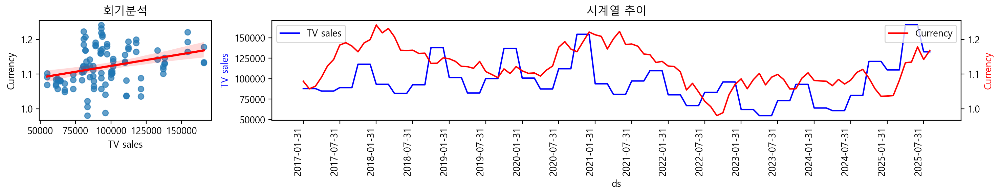

상관계수 :  0.31


In [88]:
# #분석용#
category_x = 'Currency'
category = [prod_type, category_x]

# 첫 번째 그래프: 회귀 플롯
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(15, 3), 
                               gridspec_kw={'width_ratios': [2, 8]})

# 회귀 플롯
sns.regplot(data=df, x=prod_type, y=category_x, ax=ax0, scatter_kws={'alpha':0.7}, line_kws={'color':'red'})
ax0.set_title(f'Regression Plot: {prod_type} vs {category_x}')

# 두 번째 그래프: 기본 축과 보조 축을 사용한 라인 플롯
y_indicator = gt_key[0]

# 기본 축에 대한 lineplot
sns.lineplot(data=df, x=df.ds, y=prod_type, ax=ax1, color='b', label=prod_type)

# 보조 축 생성
ax2 = ax1.twinx()

# 보조 축에 대한 lineplot
sns.lineplot(data=df, x=df.ds, y=category_x, ax=ax2, color='r', label=category_x)

# 레이블 및 제목 설정
ax1.set_xlabel('ds')
ax1.set_ylabel(prod_type, color='b')
ax2.set_ylabel(category_x, color='r')

# x축 레이블 위치 조정 및 6개마다 하나의 레이블만 표시
ax1.set_xticks(df['ds'][::6])  # 6개마다 하나의 레이블 설정
ax1.set_xticklabels(df['ds'][::6], rotation=90, ha='right')  # 레이블 회전 및 정렬

# 범례 추가
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# 그래프 제목 설정
ax0.set_title('회기분석')
ax1.set_title('시계열 추이')

# 그래프 보여주기
plt.tight_layout()  # 서브플롯 간 여백 조정
plt.show()
print("상관계수 : ", round(float(corr_data.at[category_x, prod_type]),2))

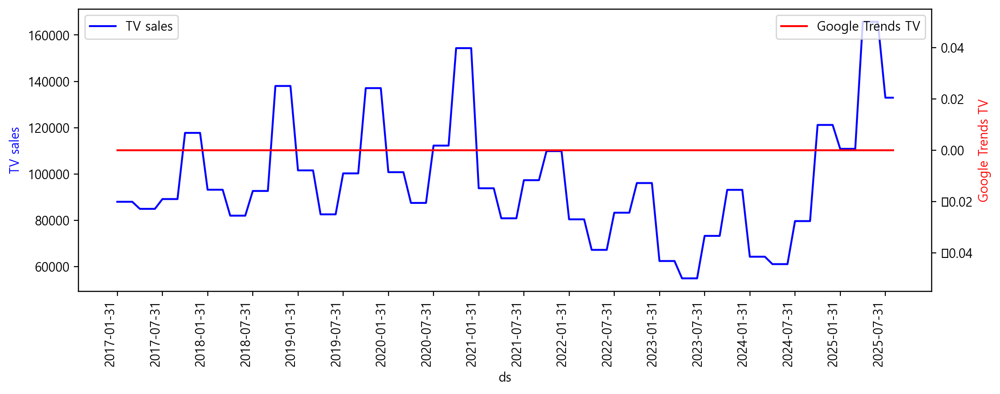

In [82]:
# 기본 축과 보조 축을 설정하여 lineplot 그리기
# 그래프 크기를 15x5로 설정
fig, ax1 = plt.subplots(figsize=(12, 4))

y_indicator = gt_key[0]

# 기본 축에 대한 lineplot
sns.lineplot(data=df, x=df.ds, y=prod_type, ax=ax1, color='b', label=prod_type)

# 보조 축 생성
ax2 = ax1.twinx()

# 보조 축에 대한 lineplot
sns.lineplot(data=df, x=df.ds, y=y_indicator, ax=ax2, color='r', label=y_indicator)

# 레이블 및 제목 설정
ax1.set_xlabel('ds')
ax1.set_ylabel(prod_type, color='b')
ax2.set_ylabel(y_indicator, color='r')

# x축 레이블 위치 조정 및 6개마다 하나의 레이블만 표시
ax1.set_xticks(df['ds'][::6])  # 6개마다 하나의 레이블 설정
ax1.set_xticklabels(df['ds'][::6], rotation=90, ha='right')  # 레이블 회전 및 정렬
# plt.title('Lineplot')

# 범례 추가
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# 그래프 보여주기
plt.show()

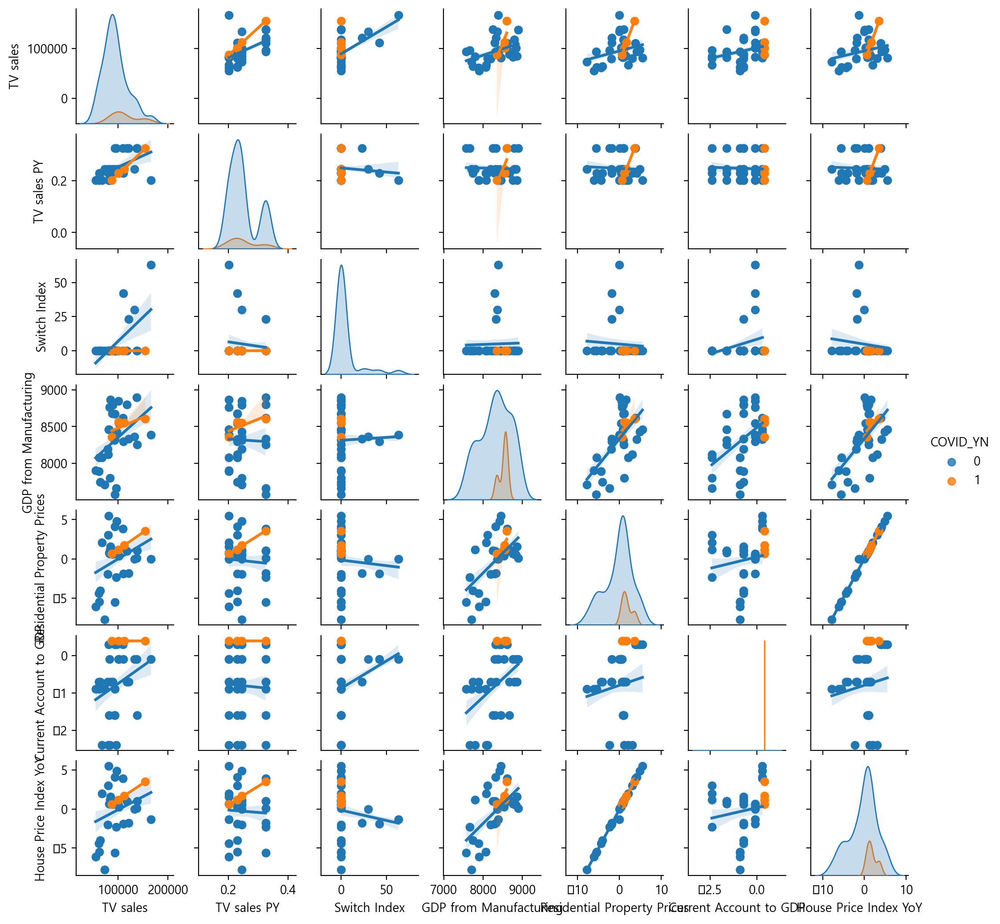

In [83]:
### 양의 상관관계
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_pros_index1)

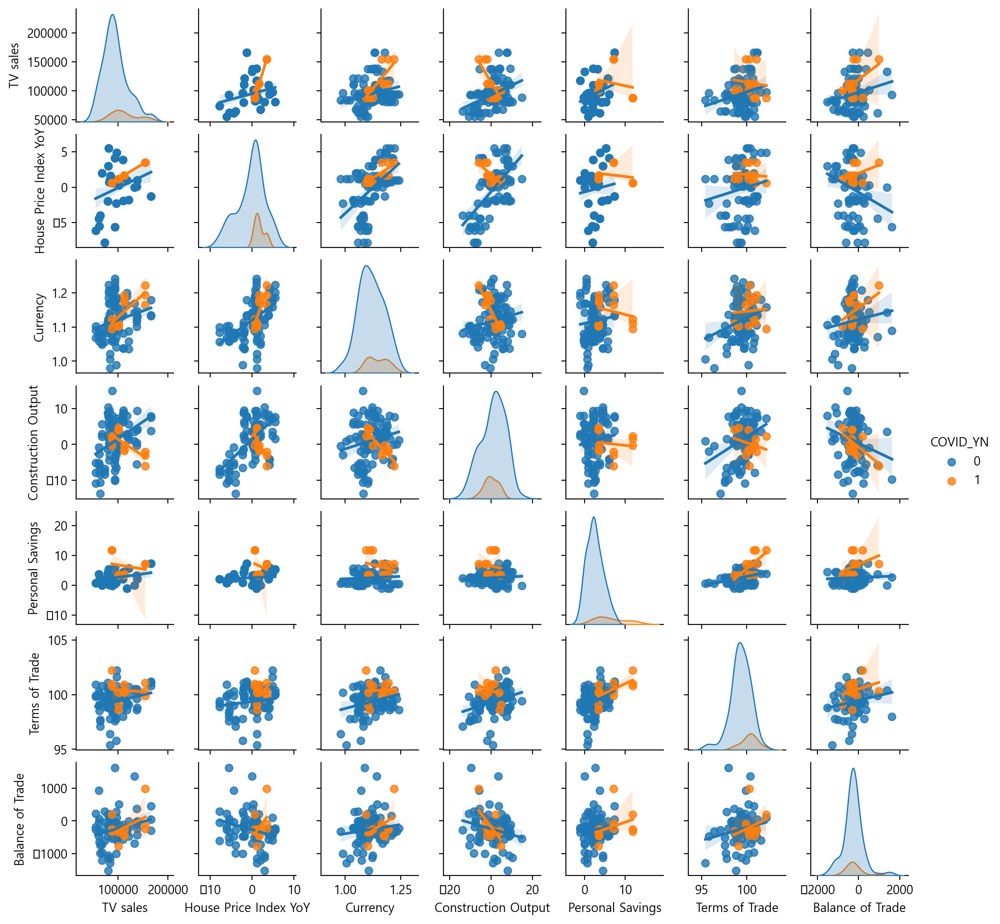

In [84]:
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_pros_index2)

In [85]:
# sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
#              vars=corr_data_pros_index3)

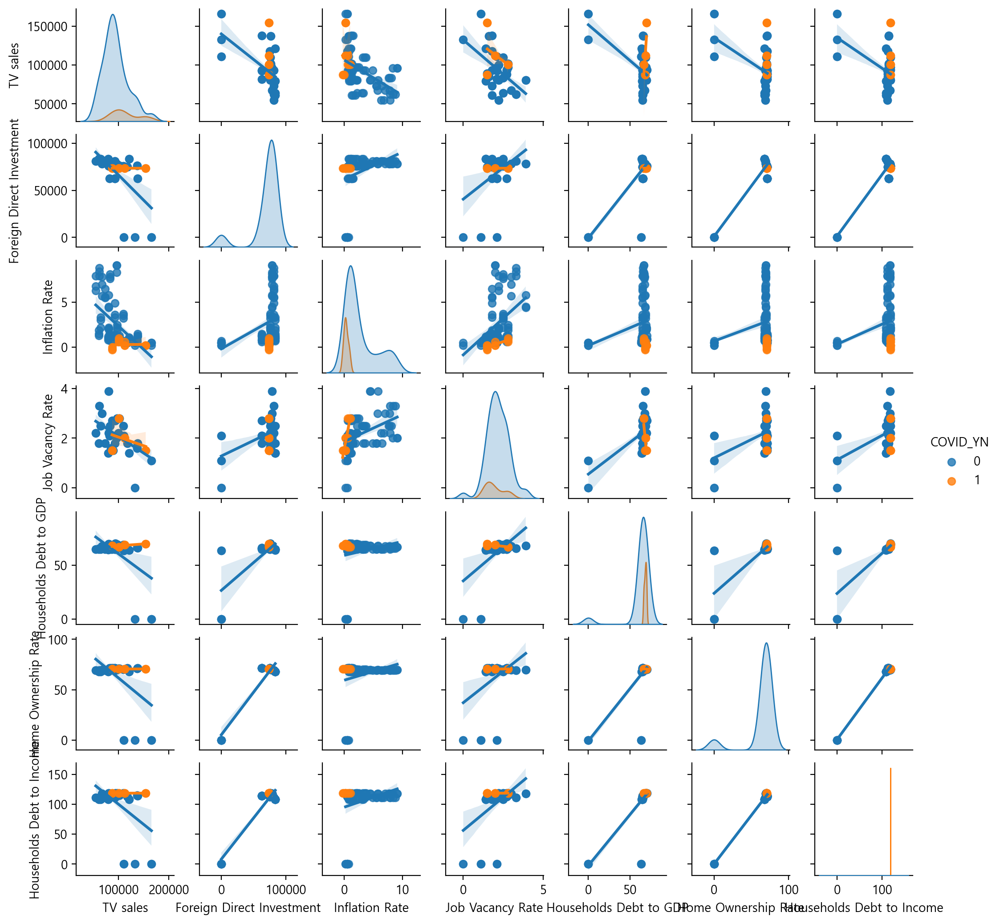

In [86]:
### 음의 상관관계
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_cons_index1)

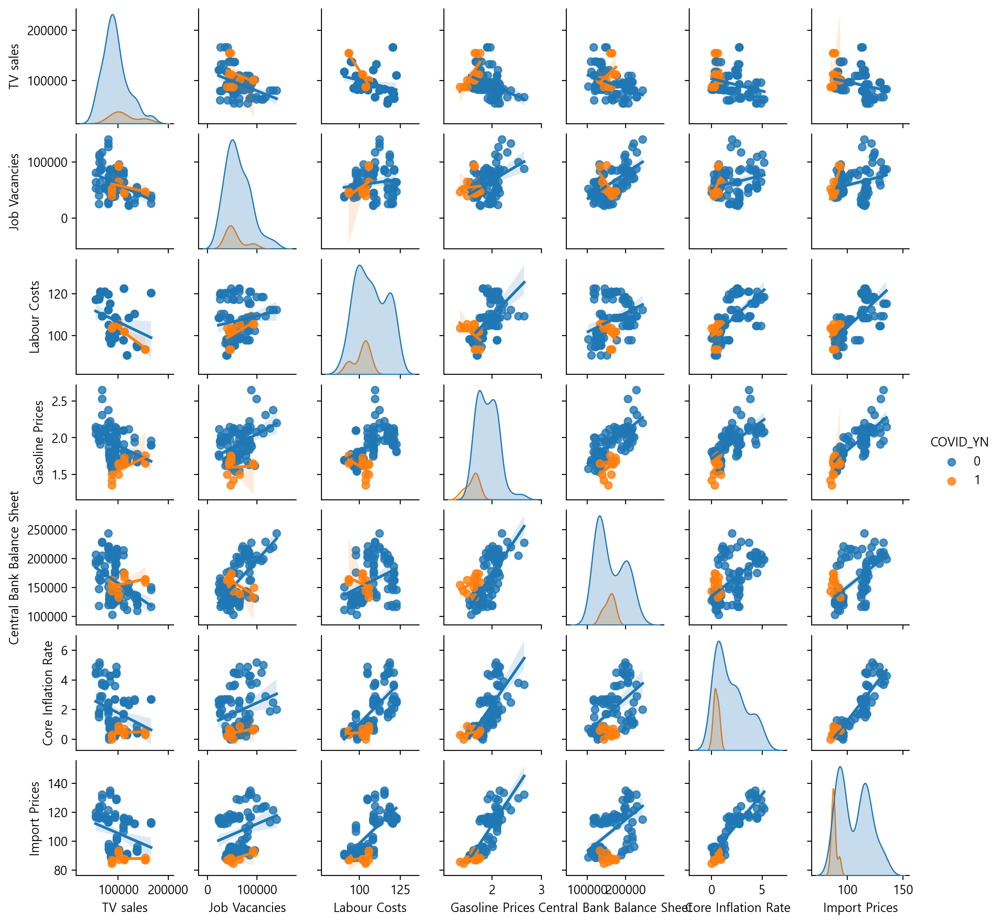

In [87]:
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_cons_index2)

# 랜덤포레스트를 통한 중요도 분석

  0%|          | 0/1 [00:00<?, ?it/s]

(104, 124)
랜덤 포레스트 회귀
Train 결정계수: 0.984
Test 결정계수: 0.88


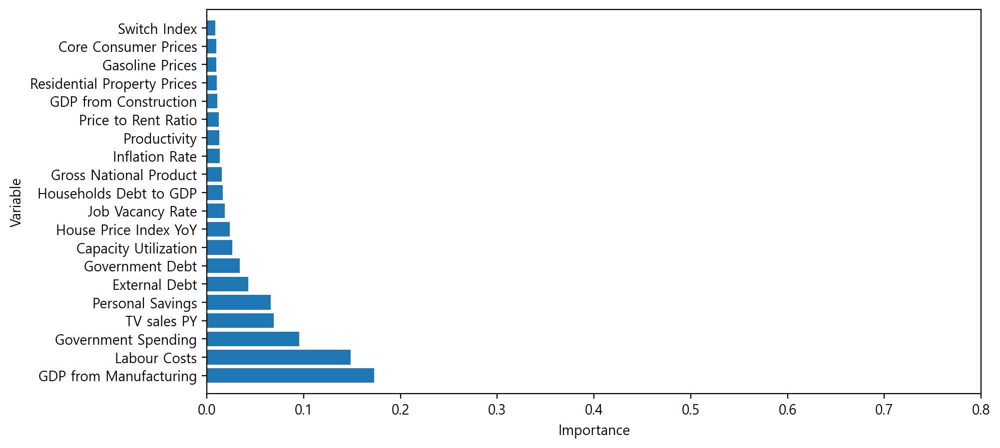

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


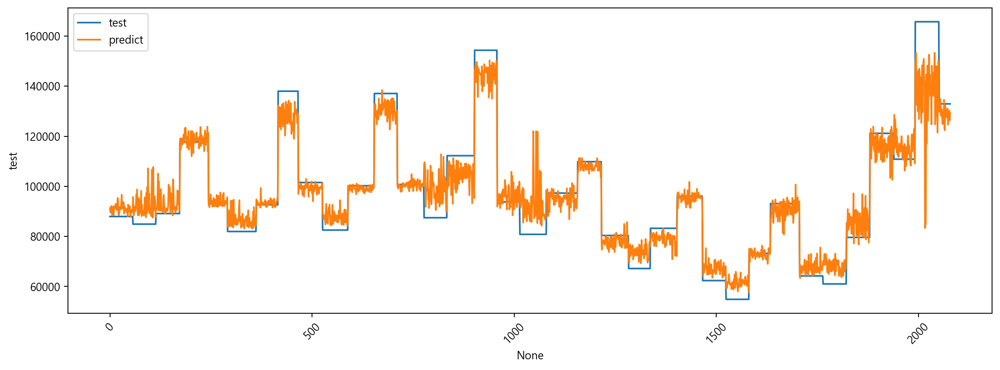

In [89]:
for sub_i in tqdm.tqdm_notebook(range(sub_i,sub_i+1,1)):
# 랜덤포레스트를 통한 중요도 분석
    ##### flag 추가 24.09.12 #####
    if df_subsidiary["ml_fcst"][sub_i-1] == "Y":

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)


        # 23.7.5 feature 수 다시 계산함
        feature_no = df.shape[1]-2 # Features
        df_feature_names = df.columns[2:feature_no+2] 
        df_feature_names = list(df_feature_names)

        df_data = np.array(df.iloc[:,2:feature_no+2]) 
        df_target = np.array(df[prod_type])



        rfc_train_score = 0
        rfc_test_score = 0

        ### 100회 실시 ###
        for num in range (1,100,1):

            X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

            # 랜덤 포레스트를 사용한 경우의 중요 특성
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
            rfc.fit(X_train, y_train)        

            y_pred = rfc.predict(X_test)
            df2 = pd.DataFrame()
            df2["test"]= pd.Series(y_test)
            df2["predict"] = pd.Series(y_pred)

            # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
            df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

            #df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_ })
            df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                          'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
            df_importance = df_importance.sort_values('importance', ascending=False)

            df_importance.index.name = "index_s"
            df_importance["train accuracy"] = round(rfc.score(X_train, y_train),3)
            df_importance["test accuracy"] = round(rfc.score(X_test, y_test),3)
            df_importance["num"] = num

            rfc_train_score = rfc_train_score + round(rfc.score(X_train, y_train),3)
            rfc_test_score = rfc_test_score + round(rfc.score(X_test, y_test),3)


            if exclude_covid == "N": # COVID 제외 로직 추가           
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir3):
                    df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df_importance.to_csv(file_dir3, index=True, mode='a', encoding='utf-8-sig', header=False)

                if not os.path.exists(file_dir4):
                    df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df2.to_csv(file_dir4, index=True, mode='a', encoding='utf-8-sig', header=False)

            else:                    
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir22):
                    df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df_importance.to_csv(file_dir22, index=True, mode='a', encoding='utf-8-sig', header=False)

                if not os.path.exists(file_dir23):
                    df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df2.to_csv(file_dir23, index=True, mode='a', encoding='utf-8-sig', header=False)


        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x)-1)

        print("랜덤 포레스트 회귀")
        print("Train 결정계수:", round(rfc_train_score/num,3))
        print("Test 결정계수:", round(rfc_test_score/num,3))
        plt.figure(figsize=(10,5))
        plt.barh(x.iloc[:20], y.iloc[:20])
        plt.yticks(ypos[:20], x.iloc[:20])
        plt.xlabel('Importance')
        plt.ylabel('Variable')
        plt.xlim(0, 0.8)
        plt.ylim(-1, 20)
        plt.show()



        print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")

        df_pred = pd.DataFrame()

        if exclude_covid == "N": # COVID 제외 로직 추가           
            df_pred = pd.read_csv(file_dir4, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()

        else:                    
            df_pred = pd.read_csv(file_dir23, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()

# 상관계수-중요도 기준 인자 선정

 * 1) 상관계수가 양-음 상위 20개 인자를 선정
 * 2) 랜덤 포레스트 머신러닝 중요도 산출
 * 3) 1) + 2) 조합을 통해 가장 결정계수(실적기준 테스트적확도)가 가장 높은 10개의 인자를 선정
 * 4) 추가+제외 인자 조정 : 경험기반 의사결정

In [101]:
##### 선택할 인자 수 #####
feature_selection = 11# 기본 11개 = 경제지표,구글트렌드 10개 + Seasonality
##########################

# 1단계: 상관계수 파일에서 데이터 추출
df_te_fcst = pd.read_csv(file_dir26)
feature_in_te_fcst = df_te_fcst['Category'].unique()    
feature_in_te_fcst = np.append(feature_in_te_fcst, gt_key)
feature_in_te_fcst = np.append(feature_in_te_fcst, prod_type +' PY')

if exclude_covid == "Y" :
    df_corr_data = pd.read_csv(file_dir19)
else: 
    df_corr_data = pd.read_csv(file_dir2)
df_mov_0 = df_corr_data[df_corr_data['mov'] == 0]
df_mov_0 = df_mov_0[df_mov_0['feature'].isin(feature_in_te_fcst)]
top_corr = df_mov_0.nlargest(feature_selection, prod_type)
bottom_corr = df_mov_0.nsmallest(feature_selection, prod_type)
df_corr = pd.concat([top_corr, bottom_corr])


# 2단계: 중요도 파일에서 피벗테이블 생성
df_imp_data = pd.read_csv(file_dir3)
df_imp = df_imp_data.pivot_table(index=['index_s', 'feature'], 
                                  values=['importance', 'corr'], 
                                  aggfunc='mean')
df_imp = df_imp.sort_values(by=('importance'), ascending=False)

# 3단계: 상관계수 상위 feature만 추출
features_in_corr = df_corr['feature'].unique()
if sub_i == 1:
    features_in_corr =  np.append(features_in_corr, ['Disposable Personal Income'])
#     features_in_corr =  np.append(features_in_corr, ['Google Trends games'])
elif sub_i == 2:
    features_in_corr = features_in_corr
#     features_in_corr =  np.append(features_in_corr, ['Google Trends games'])

df_imp_filtered = df_imp[df_imp.index.get_level_values('feature').isin(features_in_corr)]
df_imp_filtered = df_imp_filtered.reset_index()

# 결과 출력
print(df_corr)
print(df_imp)
print(df_imp_filtered)

                        feature  TV sales  mov
1                   TV sales PY  0.534215    0
4        GDP from Manufacturing  0.419747    0
7        Current Account to GDP  0.339685    0
9                      Currency  0.308978    0
13             Balance of Trade  0.248048    0
16          Consumer Confidence  0.133640    0
20              GDP Growth Rate  0.083080    0
21           GDP from Transport  0.082817    0
22   Government Spending to GDP  0.080831    0
23         GDP from Agriculture  0.079184    0
25       Gross National Product  0.059251    0
117              Inflation Rate -0.491868    0
111                Labour Costs -0.375966    0
110             Gasoline Prices -0.360186    0
108         Core Inflation Rate -0.325945    0
102              Food Inflation -0.298464    0
100             Producer Prices -0.287069    0
98           CPI Transportation -0.279363    0
96                Interest Rate -0.277539    0
95                  Wage Growth -0.274842    0
94           

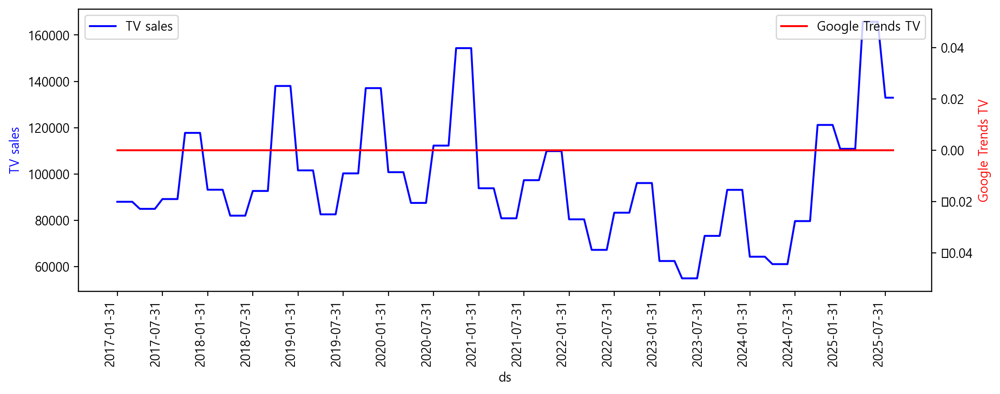

In [102]:
# 기본 축과 보조 축을 설정하여 lineplot 그리기
# 그래프 크기를 15x5로 설정
fig, ax1 = plt.subplots(figsize=(12, 4))

y_indicator = gt_key[0]

# 기본 축에 대한 lineplot
sns.lineplot(data=df, x=df.ds, y=prod_type, ax=ax1, color='b', label=prod_type)

# 보조 축 생성
ax2 = ax1.twinx()

# 보조 축에 대한 lineplot
sns.lineplot(data=df, x=df.ds, y=y_indicator, ax=ax2, color='r', label=y_indicator)

# 레이블 및 제목 설정
ax1.set_xlabel('ds')
ax1.set_ylabel(prod_type, color='b')
ax2.set_ylabel(y_indicator, color='r')

# x축 레이블 위치 조정 및 6개마다 하나의 레이블만 표시
ax1.set_xticks(df['ds'][::6])  # 6개마다 하나의 레이블 설정
ax1.set_xticklabels(df['ds'][::6], rotation=90, ha='right')  # 레이블 회전 및 정렬
# plt.title('Lineplot')

# 범례 추가
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# 그래프 보여주기
plt.show()

# Combination 조합 결정계수

In [103]:
# Top 3 조합을 저장할 리스트
test_num = 20     # 테스트 횟수 
top_combinations = []
print("테스트 횟수 : ", test_num)

##### 경험기반 추가 + 삭제 인자 조정 #####
file_dir_inc = "{}/{}/{}/Raw/feature_inclusion.csv".format(ML_dir, PG_dir, subsidiary_name)
file_dir_exc = "{}/{}/{}/Raw/feature_exclusion.csv".format(ML_dir, PG_dir, subsidiary_name)
df_feature_inclusion = pd.read_csv(file_dir_inc)
df_feature_exclusion = pd.read_csv(file_dir_exc)
feature_inclusion = df_feature_inclusion['feature_names'].tolist()
feature_exclusion = df_feature_exclusion['feature_names'].tolist()
##### 경험기반 추가 + 삭제 인자 조정 #####

df_imp_filtered = df_imp_filtered[~df_imp_filtered['feature'].isin(feature_exclusion)]
#####

# 포함할 feature 수
num_included_features = len(feature_inclusion)
total_features = df_imp_filtered['feature'].tolist()

# 포함할 feature를 제외한 나머지 feature
remaining_features = [f for f in total_features if f not in feature_inclusion]

total_combinations = len(list(combinations(remaining_features, feature_selection - num_included_features)))

# 조합 생성
i = 0

for combo in combinations(remaining_features, feature_selection - num_included_features):
    i = i+1 

print("인자 선택 Combinations : ", i)

테스트 횟수 :  20
인자 선택 Combinations :  924


In [104]:
i = 0

for combo in tqdm.tqdm_notebook(combinations(remaining_features, feature_selection - num_included_features), total=total_combinations):
# for combo in combinations(remaining_features, feature_selection - num_included_features):

    combinations_list = []
    # 선택된 feature 조합에 포함할 feature 추가
    selected_features = list(combo) + feature_inclusion

    # 각 feature와 해당하는 index_s를 가져와서 저장
    for feature in selected_features:
        index_s = int(df_imp_filtered.loc[df_imp_filtered['feature'] == feature, 'index_s'].values[0])
        combinations_list.append({'index_s': index_s+2, 'feature': feature})
        
    df_combinations = pd.DataFrame()
    df_combinations = pd.DataFrame(combinations_list)
    df_combinations = df_combinations.sort_values(by='index_s')
    
#     print(combinations_list)
#     print(df_combinations)
    
    ########################    
    ########################    
    ########################
    
    # [학습] 선행지표 기준 머신러닝 학습
    # 파일 열기
    df = pd.read_csv(file_dir)

    df_TV_sales = pd.DataFrame()
    df_features = pd.DataFrame()
    df_features_mov = pd.DataFrame()

    df_TV_sales = df.iloc[covid:m_rows_init,:3]

    df_TV_sales = df_TV_sales.reset_index(drop=True)


    # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
    df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
    df = pd.concat([df_TV_sales, df_features], axis=1)


    # 23.4.12 변경
    # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

    # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
    # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
    # df = pd.concat([df_TV_sales, df_features], axis=1)

    # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
    # for item in range (2, mov_no+1, 1):

    # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

    # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
    # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
    # df = pd.concat([df_TV_sales, df_features], axis=1)

    for item in range (1, mov_no+1, 1):
        if item == 1:
            df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
            df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

        else:
            df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
            df_features_mov = df_features_mov.fillna(method='bfill')

        new_cols = []
        for col in df_features_mov.columns:
            new_col = str(col + "_" + str(item))
            new_cols.append(new_col)

        df_features_mov.columns = new_cols

        df = pd.concat([df, df_features_mov], axis=1)
    #변경 완료



    # 23.4.12 추가
    if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
        df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
        df = df.reset_index(drop=True)


    ###################################################
    ### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
    ###################################################
#     df_features = pd.read_csv(file_dir10)
    df_features = df_combinations

    if use_google_trends == "N":
        df_features = df_features[~df_features["feature"].isin(gt_key)]

#     print(df_features.shape)
    df_feature_index = list(df_features["index_s"])
    df_feature_names = list(df_features["feature"])

    df_feature_names

    m_feature = len(df_feature_names)
#     print(m_feature)
#     print(df_feature_index)

    # # feature 수 조정 테스트 #
#     print("max_feature 조정:", max_feature_adj)
#     print("max_feature 갯수:", max_feature_no)


    ############################################
    ### df_data 파일 입력으로 변경 21.11.30  ###
    ############################################
    df_data = np.array(df.iloc[:,2:3])

    for n in range(1,m_feature,1):

        df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

#     print(df_data.shape)
    df_target = np.array(df[prod_type])

    rfc_train_score = 0
    rfc_test_score = 0
    rfc_test_adj_score = 0
    svm_train_score = 0
    svm_test_score = 0
    r_score_sum = 0
    r_score_avg = 0


    ### test 실시 ###
    for num in range (1,test_num+1,1):

        #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
        X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

        # 랜덤 포레스트를 사용한 경우의 중요 특성
        if max_feature_adj == 0 :
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
        elif max_feature_adj == 1 :
            ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)

        rfc.fit(X_train, y_train)
        y_pred = rfc.predict(X_test)
        r_score = round(rfc.score(X_test, y_test),3)
        r_score_sum = r_score_sum + r_score
        
        
    i = i + 1             
    r_score_avg = round(r_score_sum/test_num,3)
    print(i, " Combinations :", r_score_avg)
        
    # 조합과 결정계수를 저장
    top_combinations.append((r_score_avg, df_feature_index, df_feature_names))
    
    ########################    
    ########################

# 결정계수가 가장 높은 Top 3 조합 찾기
top_combinations.sort(reverse=True, key=lambda x: x[0])
top_3_combinations = top_combinations[:3]
# print("조합수 : ", i)
print("결정계수, 인덱스, 인자")
top_3_combinations

  0%|          | 0/924 [00:00<?, ?it/s]

1  Combinations : 0.926
2  Combinations : 0.87
3  Combinations : 0.859
4  Combinations : 0.858
5  Combinations : 0.919
6  Combinations : 0.899
7  Combinations : 0.873
8  Combinations : 0.877
9  Combinations : 0.895
10  Combinations : 0.891
11  Combinations : 0.903
12  Combinations : 0.908
13  Combinations : 0.916
14  Combinations : 0.855
15  Combinations : 0.833
16  Combinations : 0.851
17  Combinations : 0.877
18  Combinations : 0.868
19  Combinations : 0.778
20  Combinations : 0.857
21  Combinations : 0.89
22  Combinations : 0.875
23  Combinations : 0.887
24  Combinations : 0.848
25  Combinations : 0.891
26  Combinations : 0.905
27  Combinations : 0.849
28  Combinations : 0.911
29  Combinations : 0.88
30  Combinations : 0.899
31  Combinations : 0.932
32  Combinations : 0.93
33  Combinations : 0.879
34  Combinations : 0.935
35  Combinations : 0.89
36  Combinations : 0.891
37  Combinations : 0.885
38  Combinations : 0.844
39  Combinations : 0.893
40  Combinations : 0.873
41  Combinatio

[(0.941,
  [2, 19, 23, 39, 50, 53, 55, 64, 78, 80, 84],
  ['TV sales PY',
   'Core Inflation Rate',
   'Currency',
   'Food Inflation',
   'GDP from Manufacturing',
   'GDP from Transport',
   'GDP Growth Rate',
   'Government Spending to GDP',
   'Inflation Rate',
   'Interest Rate',
   'Labour Costs']),
 (0.936,
  [2, 14, 19, 23, 39, 50, 53, 55, 78, 80, 84],
  ['TV sales PY',
   'Consumer Confidence',
   'Core Inflation Rate',
   'Currency',
   'Food Inflation',
   'GDP from Manufacturing',
   'GDP from Transport',
   'GDP Growth Rate',
   'Inflation Rate',
   'Interest Rate',
   'Labour Costs']),
 (0.935,
  [2, 19, 23, 25, 44, 50, 53, 55, 78, 80, 84],
  ['TV sales PY',
   'Core Inflation Rate',
   'Currency',
   'Current Account to GDP',
   'Gasoline Prices',
   'GDP from Manufacturing',
   'GDP from Transport',
   'GDP Growth Rate',
   'Inflation Rate',
   'Interest Rate',
   'Labour Costs'])]

In [105]:
file_dir_selection = "{}/{}/{}/Raw/feature_names_selection.csv".format(ML_dir, PG_dir, subsidiary_name)

index_s = top_3_combinations[0][1]
feature_names = top_3_combinations[0][2]

# 데이터프레임 생성
df_feature_selection = pd.DataFrame({
    'index_s': index_s,
    'feature_names': feature_names
})
df_feature_selection.to_csv(file_dir_selection, index=False)

# 모형적정성 점검

  0%|          | 0/6 [00:00<?, ?it/s]

-------
(33, 15)
구글트렌드 적용: N
법인명: 22.FI
(120, 124)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월
(69, 123)
(69, 124)
랜덤 포레스트 회귀
Train 결정계수: 0.989
Test 결정계수: 0.891


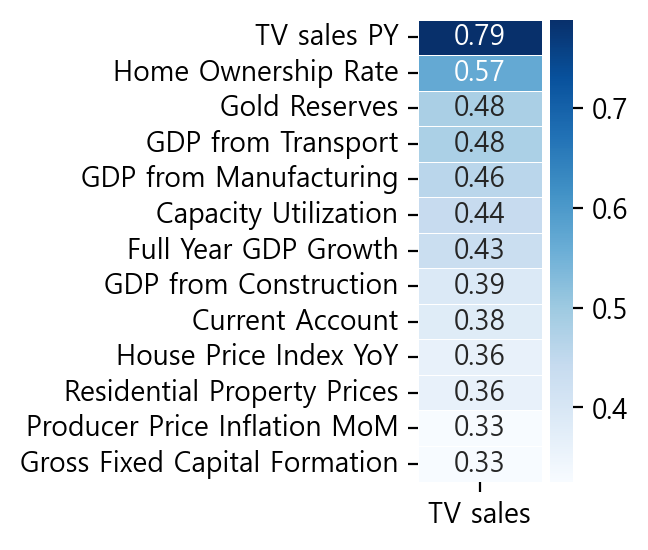

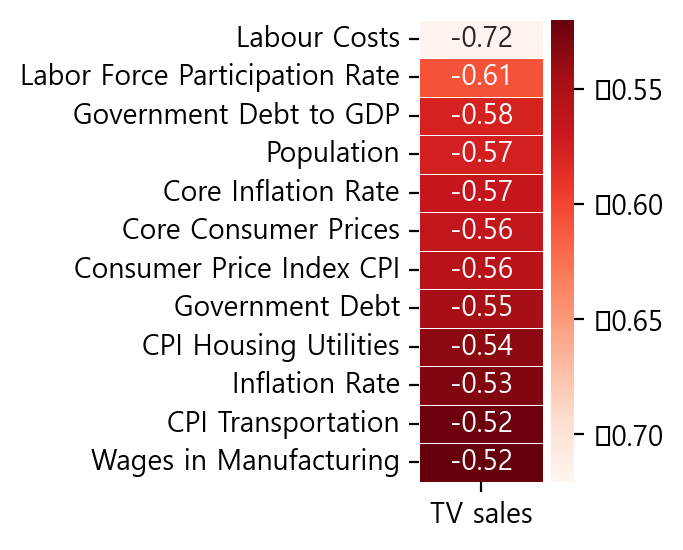

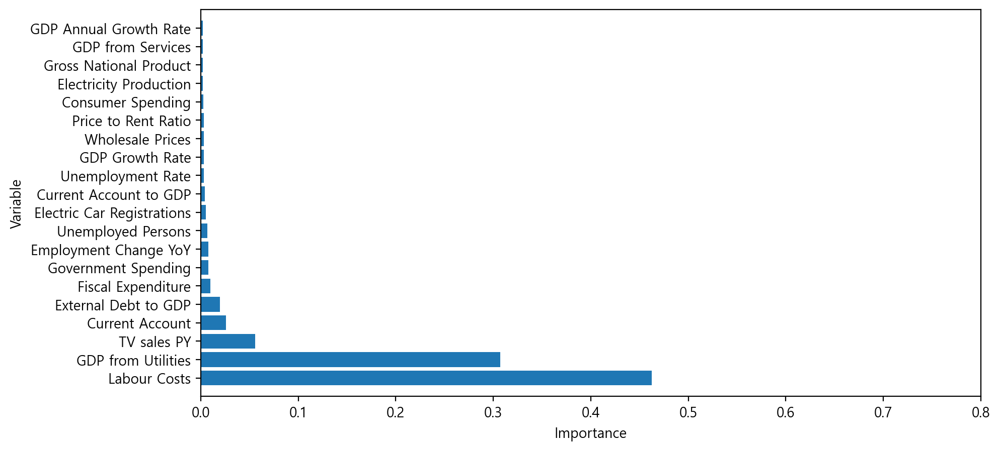

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


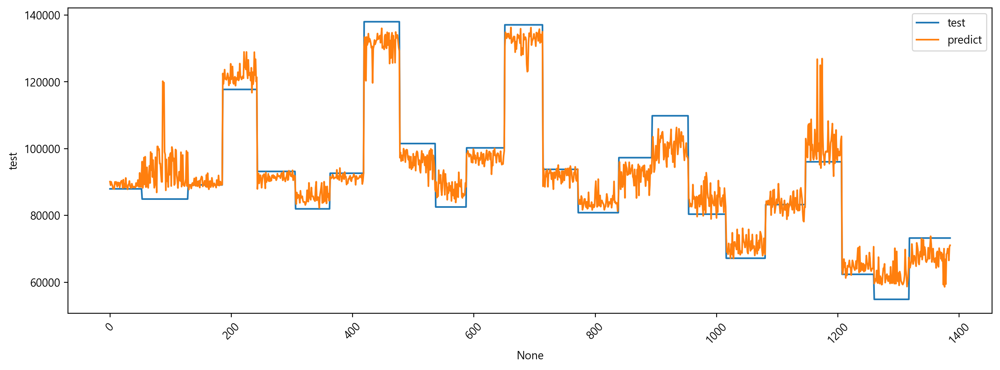

(69, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
max_feature 조정: 0
max_feature 갯수: 0
(69, 11)
랜덤 포레스트 회귀
Train 결정계수: 0.992
Test 결정계수: 0.931


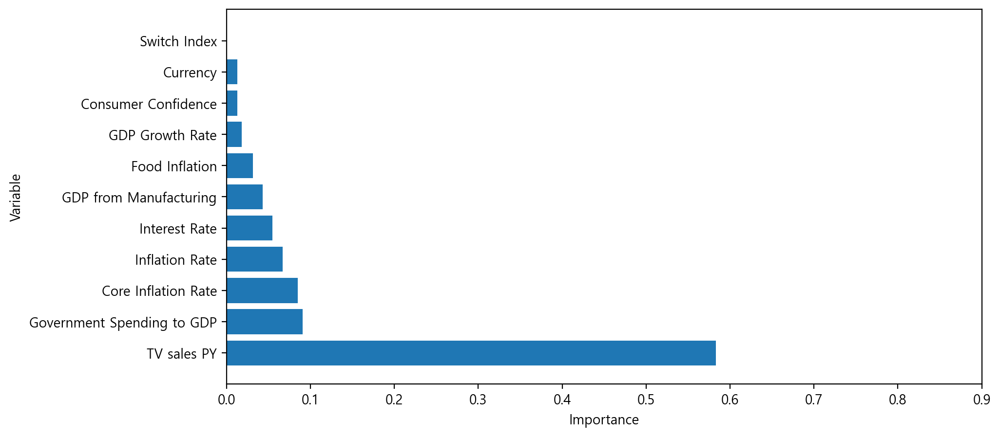

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


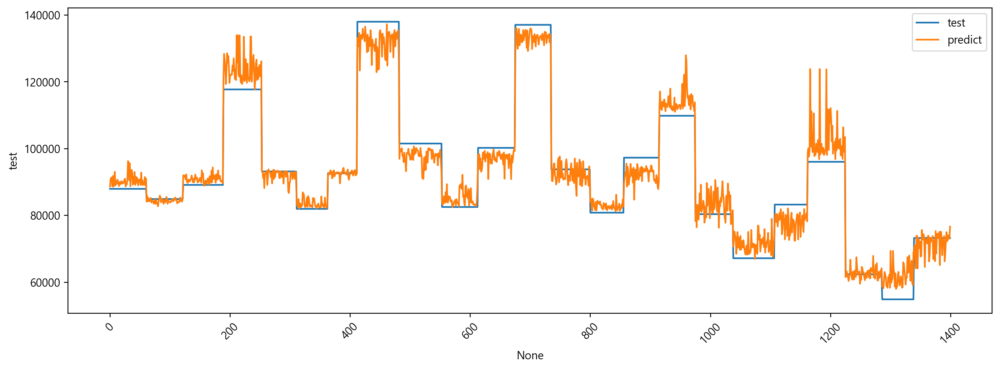

(90, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
(90, 11)
랜덤 포레스트 회귀


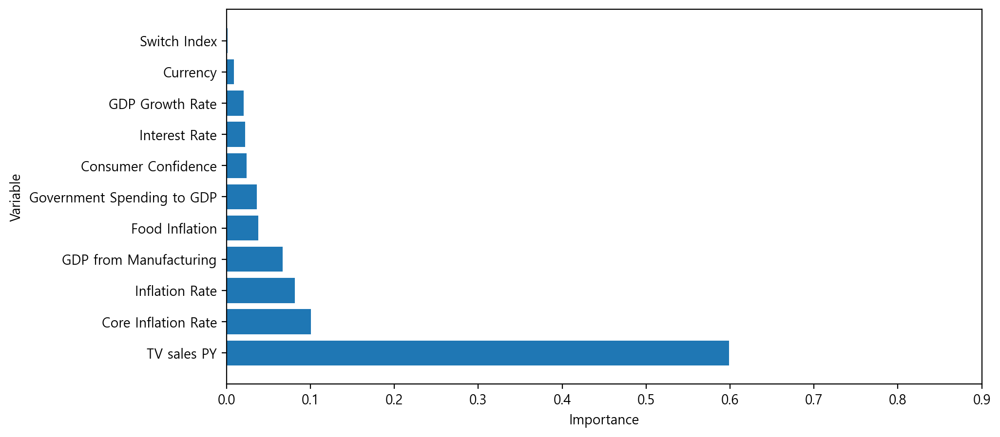

corr: [0.79] / importance: 60.0 %


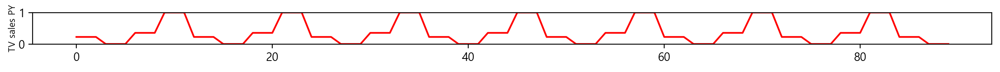

corr: [0.3] / importance: 2.0 %


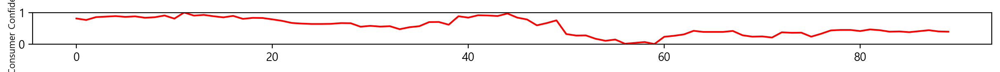

corr: [-0.57] / importance: 10.0 %


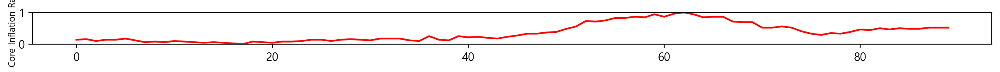

corr: [0.26] / importance: 1.0 %


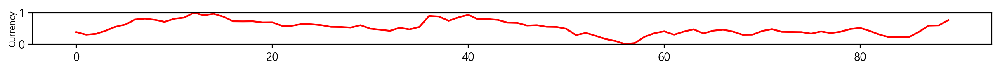

corr: [-0.46] / importance: 4.0 %


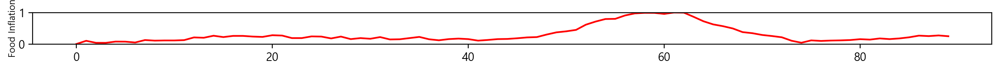

corr: [0.46] / importance: 7.000000000000001 %


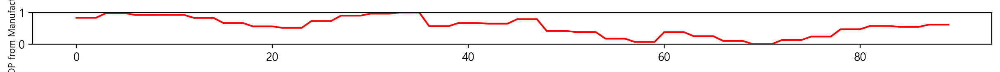

corr: [0.05] / importance: 2.0 %


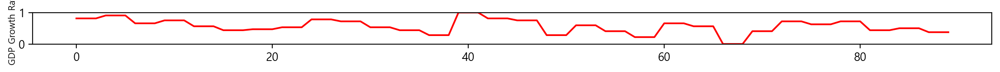

corr: [-0.38] / importance: 4.0 %


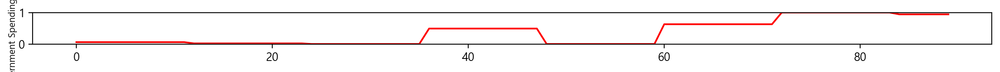

corr: [-0.53] / importance: 8.0 %


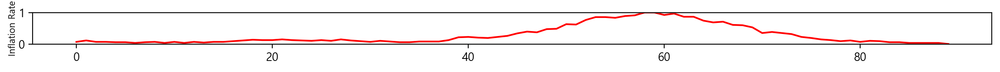

corr: [-0.5] / importance: 2.0 %


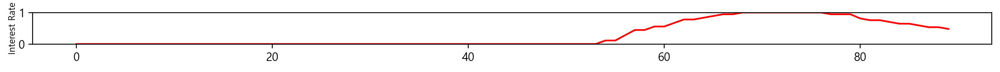

corr: [-0.19] / importance: 0.0 %


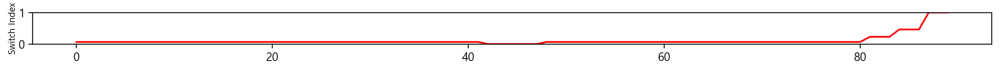

랜덤 포레스트 회귀: 예측 결과


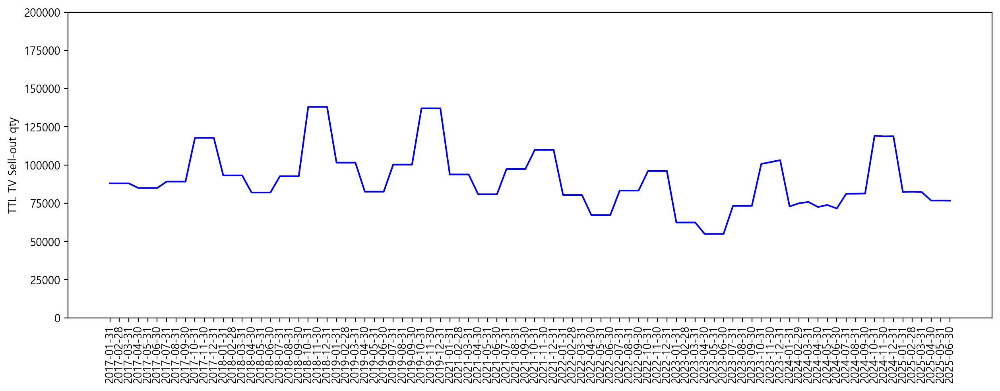

101896.0 74529.0 72615.0 81222.0 118867.0 82333.0
-------
(33, 15)
구글트렌드 적용: N
법인명: 22.FI
(120, 124)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월
(72, 123)
(72, 124)
랜덤 포레스트 회귀
Train 결정계수: 0.989
Test 결정계수: 0.91


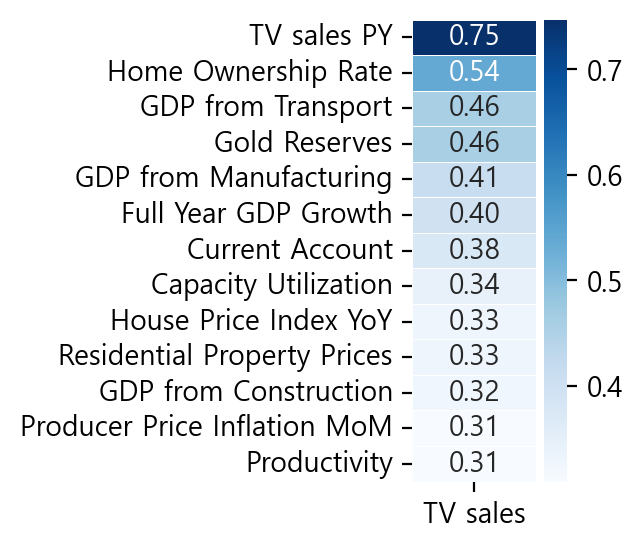

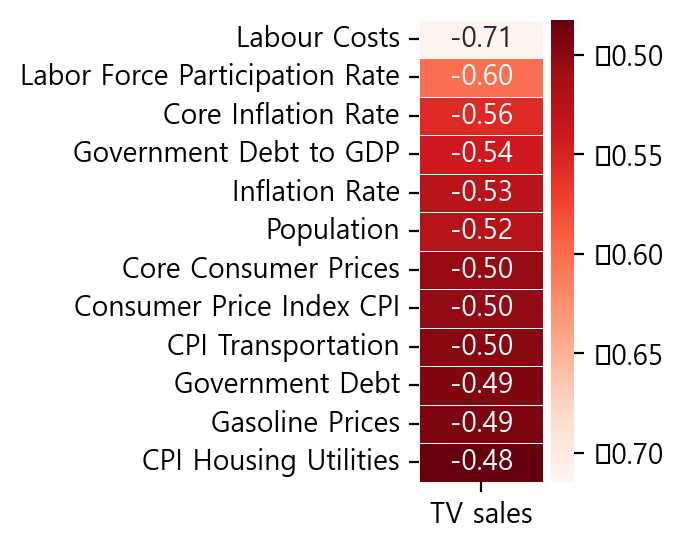

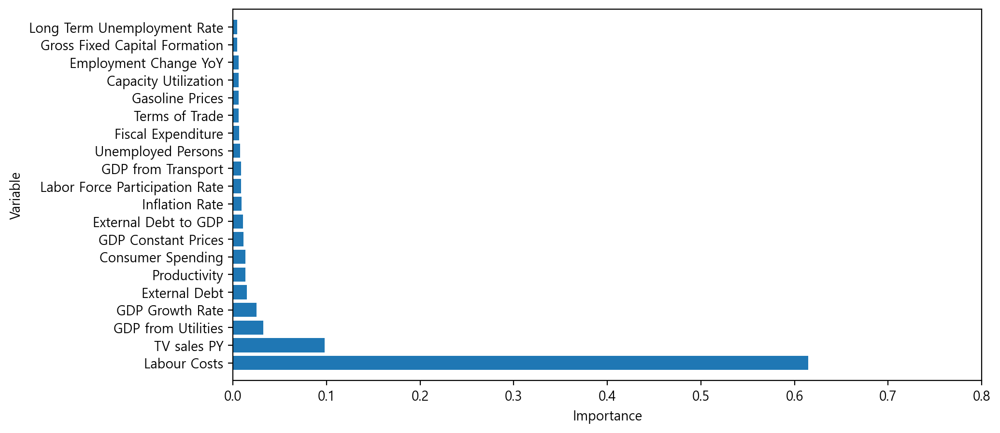

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


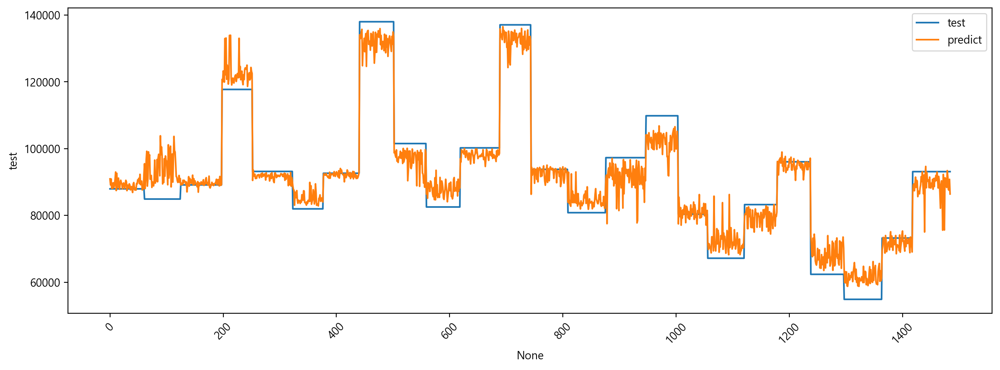

(72, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
max_feature 조정: 0
max_feature 갯수: 0
(72, 11)
랜덤 포레스트 회귀
Train 결정계수: 0.992
Test 결정계수: 0.926


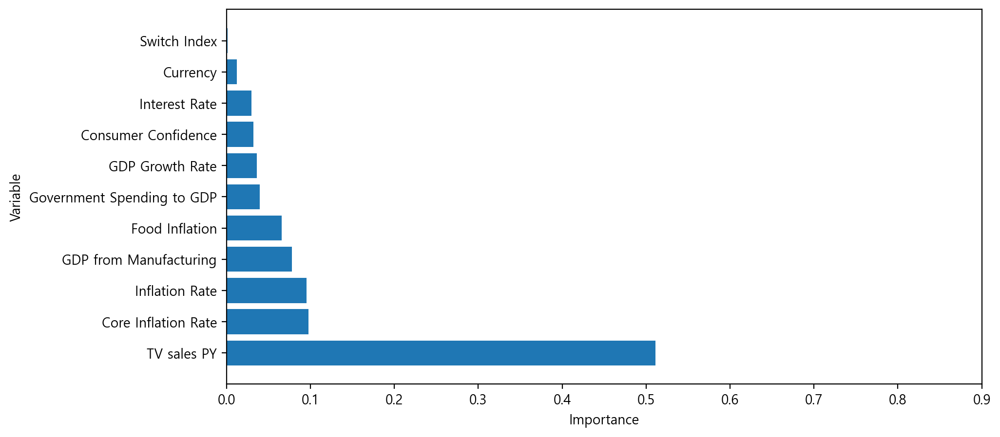

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


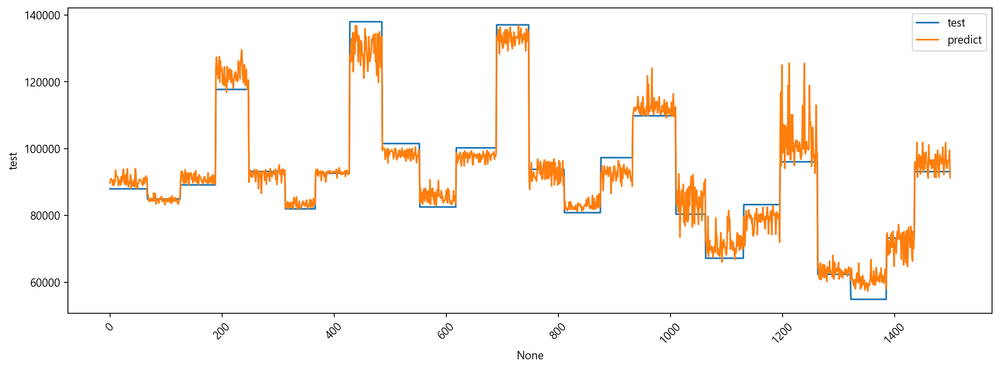

(93, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
(93, 11)
랜덤 포레스트 회귀


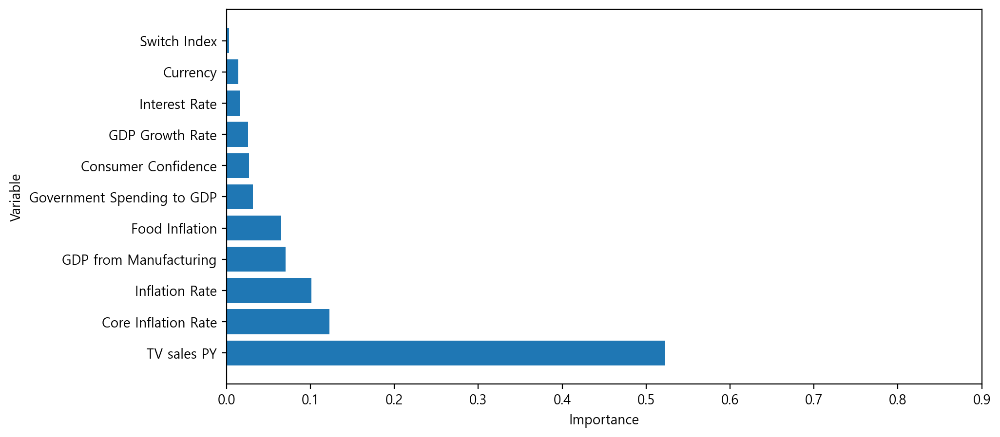

corr: [0.75] / importance: 52.0 %


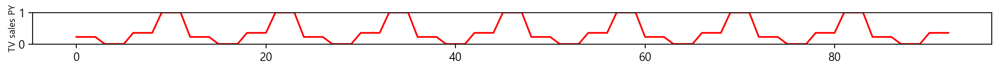

corr: [0.28] / importance: 3.0 %


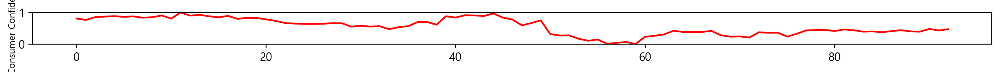

corr: [-0.56] / importance: 12.0 %


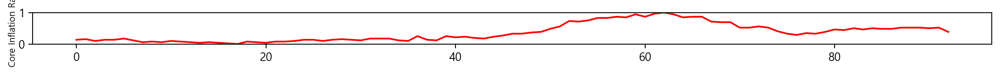

corr: [0.25] / importance: 1.0 %


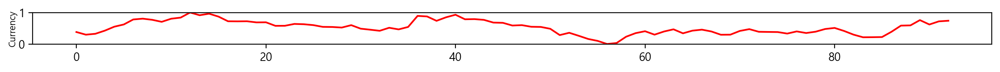

corr: [-0.46] / importance: 7.000000000000001 %


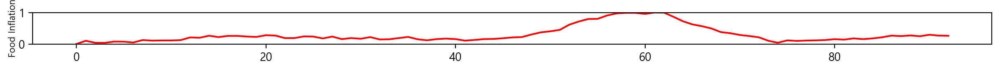

corr: [0.41] / importance: 7.000000000000001 %


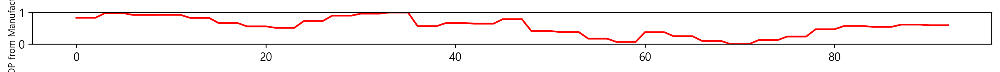

corr: [0.05] / importance: 3.0 %


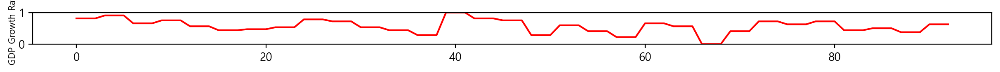

corr: [-0.36] / importance: 3.0 %


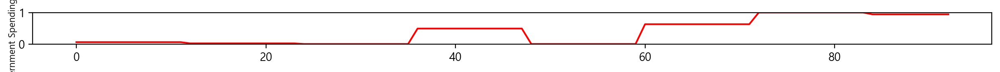

corr: [-0.53] / importance: 10.0 %


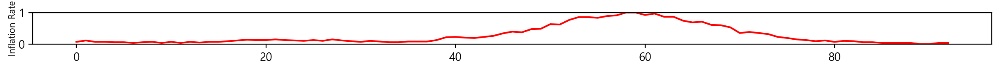

corr: [-0.42] / importance: 2.0 %


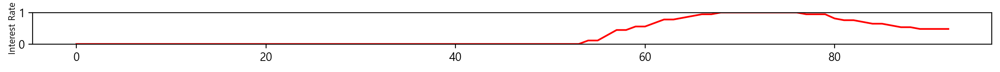

corr: [-0.18] / importance: 0.0 %


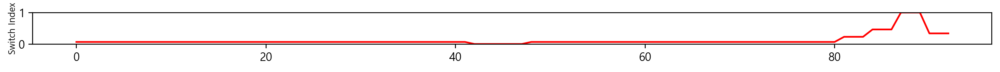

랜덤 포레스트 회귀: 예측 결과


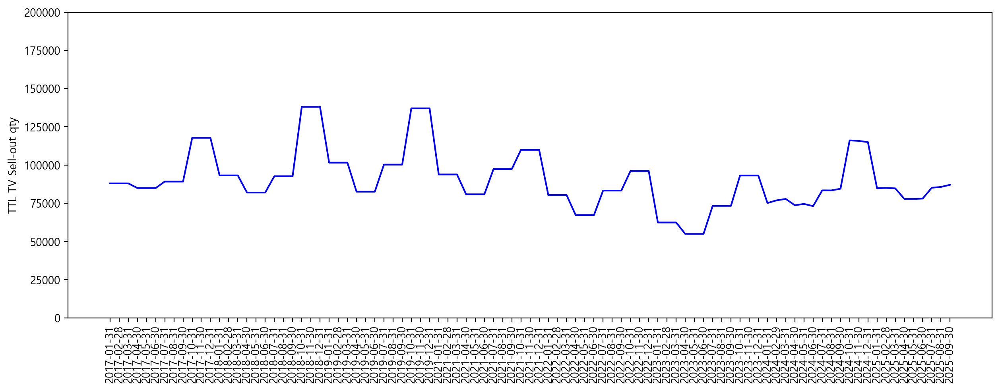

76566.0 73732.0 83729.0 115586.0 84818.0 77845.0
-------
(33, 15)
구글트렌드 적용: N
법인명: 22.FI
(120, 124)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월
(75, 123)
(75, 124)
랜덤 포레스트 회귀
Train 결정계수: 0.991
Test 결정계수: 0.934


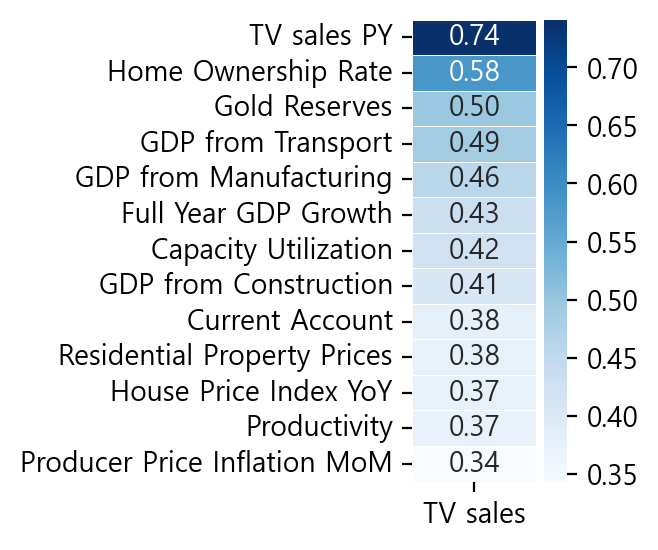

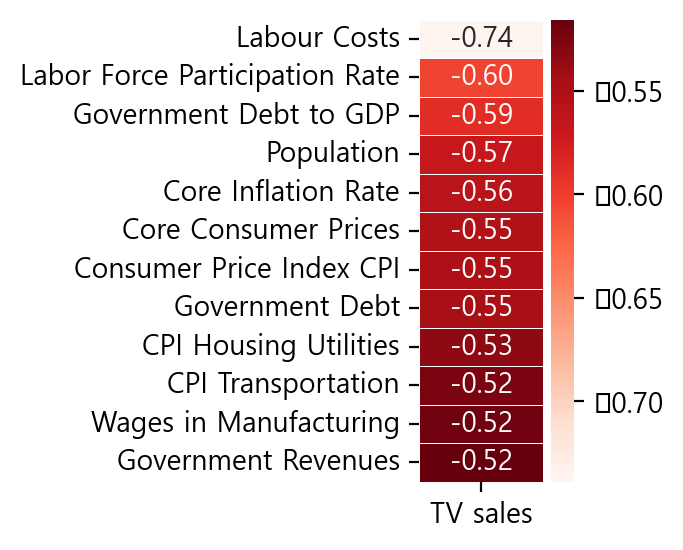

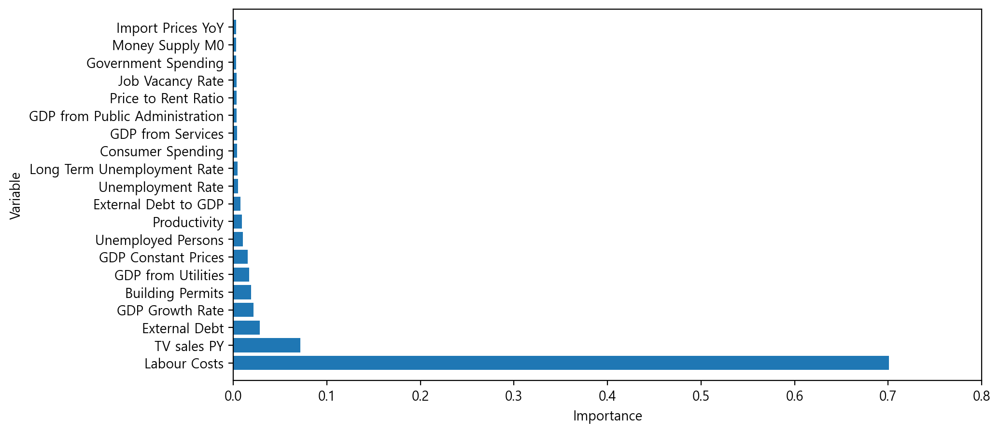

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


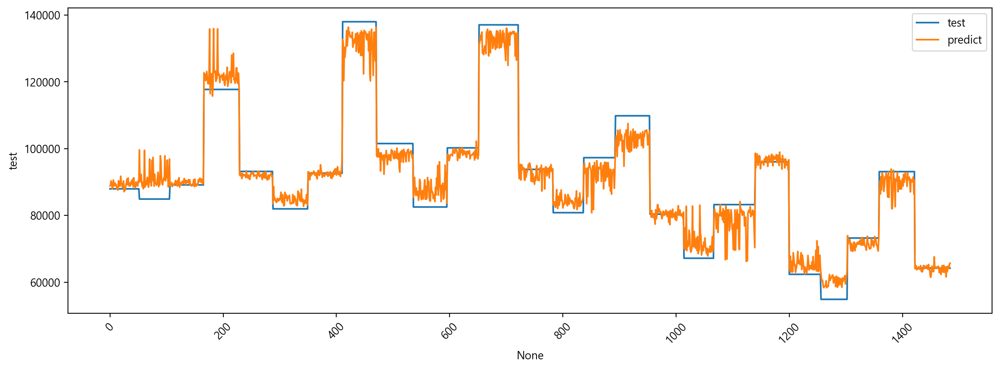

(75, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
max_feature 조정: 0
max_feature 갯수: 0
(75, 11)
랜덤 포레스트 회귀
Train 결정계수: 0.993
Test 결정계수: 0.942


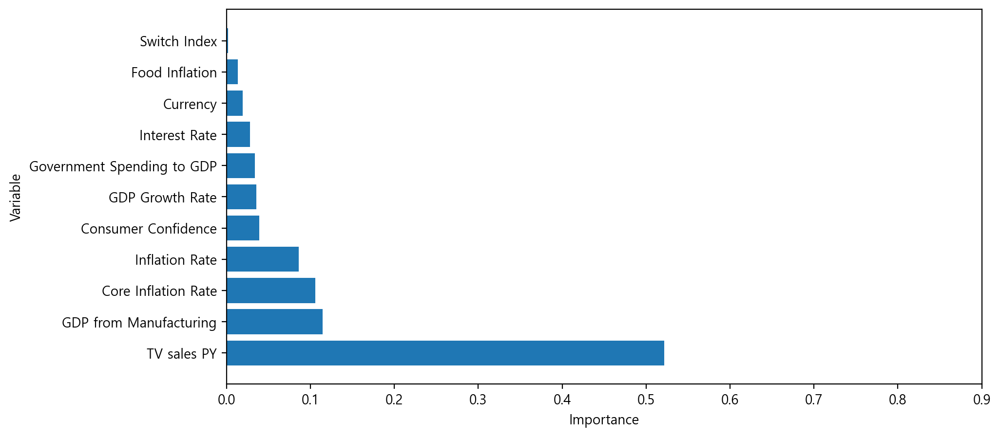

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


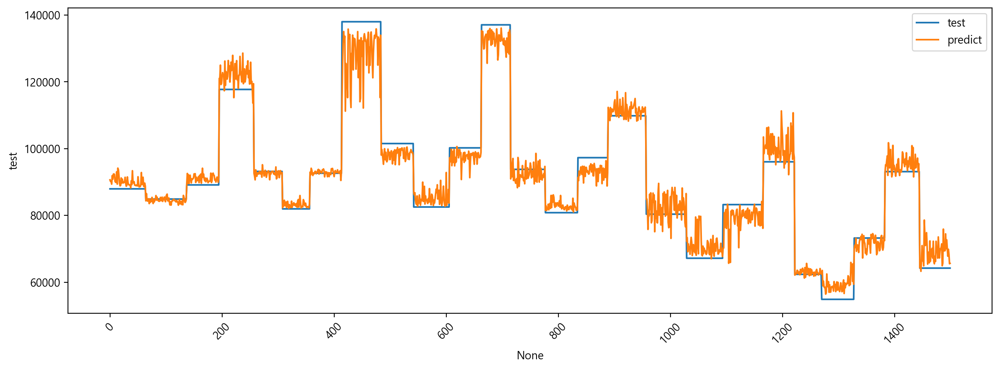

(96, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
(96, 11)
랜덤 포레스트 회귀


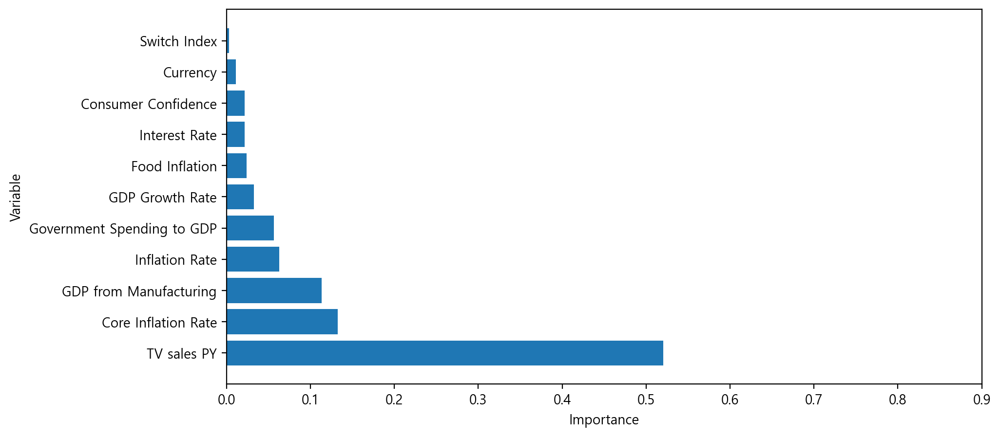

corr: [0.74] / importance: 52.0 %


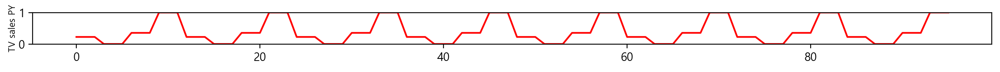

corr: [0.32] / importance: 2.0 %


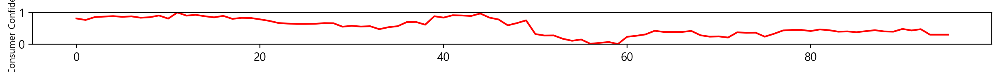

corr: [-0.56] / importance: 13.0 %


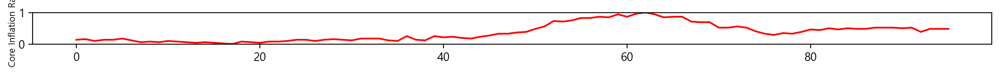

corr: [0.28] / importance: 1.0 %


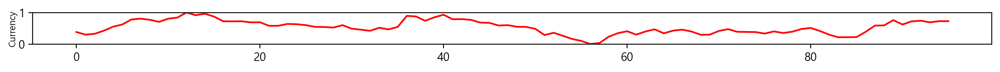

corr: [-0.4] / importance: 2.0 %


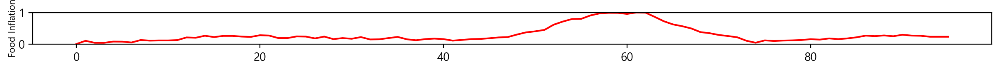

corr: [0.46] / importance: 11.0 %


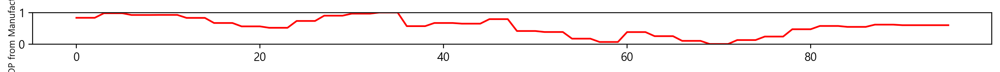

corr: [0.01] / importance: 3.0 %


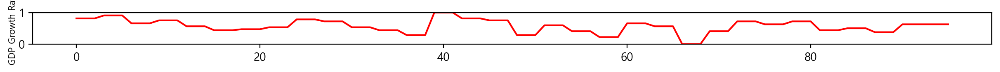

corr: [-0.43] / importance: 6.0 %


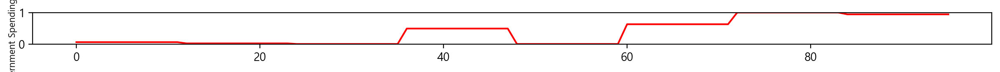

corr: [-0.5] / importance: 6.0 %


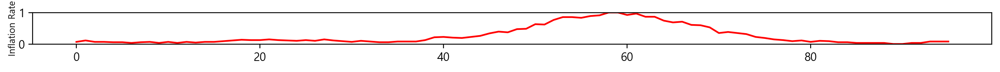

corr: [-0.48] / importance: 2.0 %


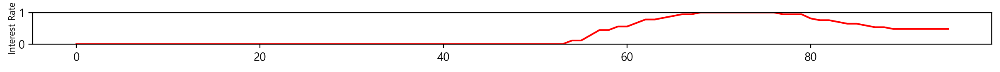

corr: [-0.19] / importance: 0.0 %


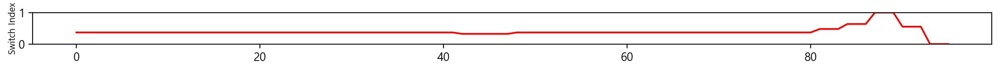

랜덤 포레스트 회귀: 예측 결과


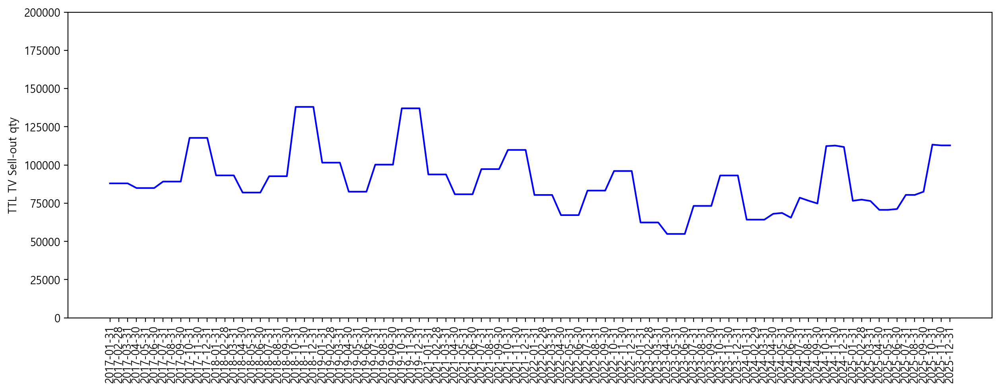

67383.0 76658.0 112265.0 76766.0 70807.0 81103.0
-------
(33, 15)
구글트렌드 적용: N
법인명: 22.FI
(120, 124)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월
(78, 123)
(78, 124)
랜덤 포레스트 회귀
Train 결정계수: 0.992
Test 결정계수: 0.932


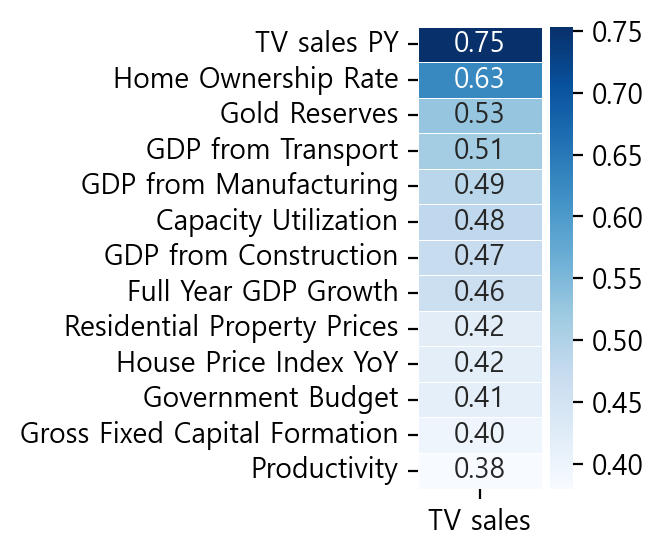

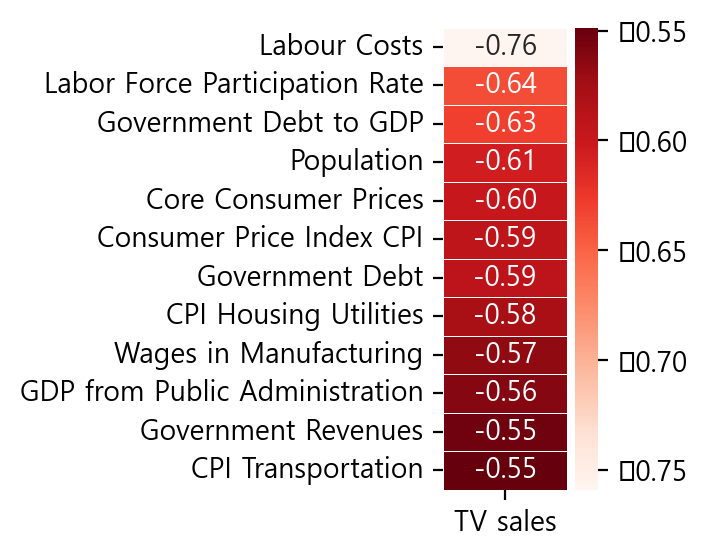

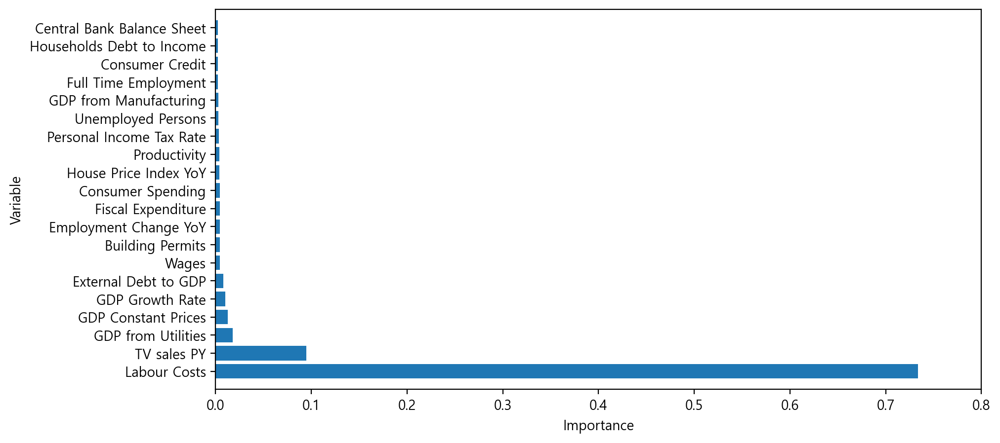

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


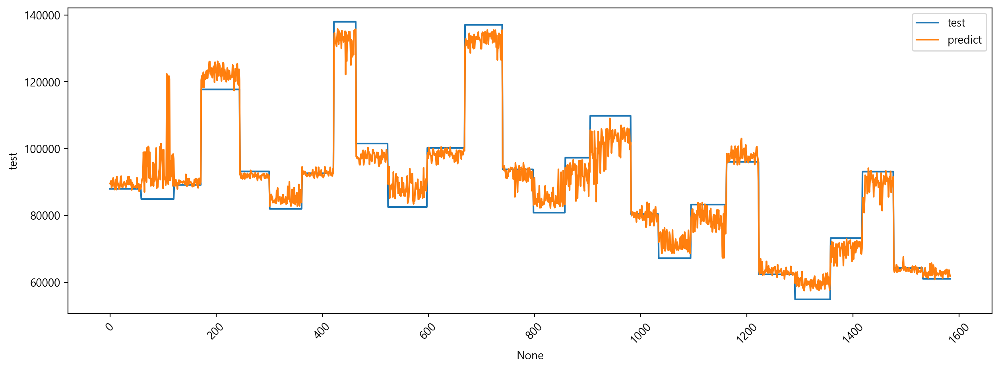

(78, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
max_feature 조정: 0
max_feature 갯수: 0
(78, 11)
랜덤 포레스트 회귀
Train 결정계수: 0.994
Test 결정계수: 0.964


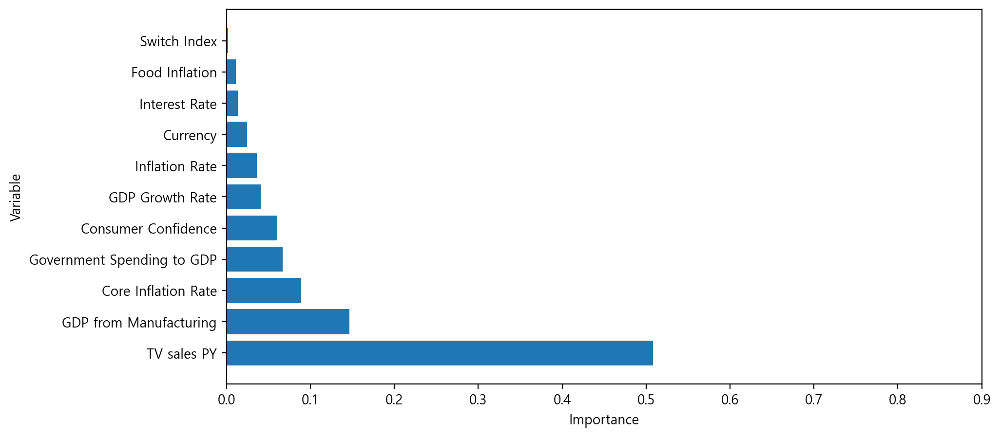

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


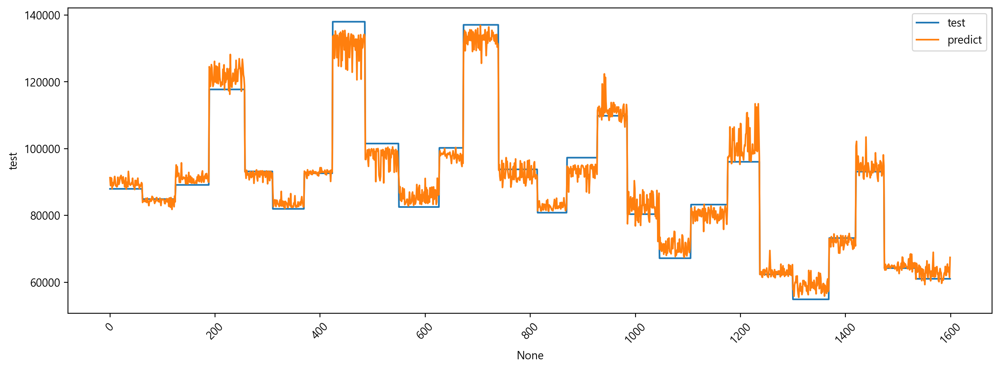

(99, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
(99, 11)
랜덤 포레스트 회귀


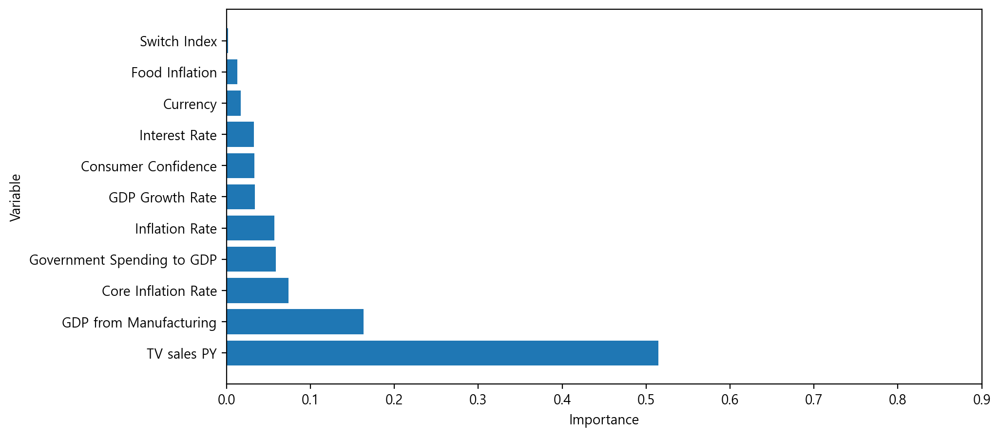

corr: [0.75] / importance: 51.0 %


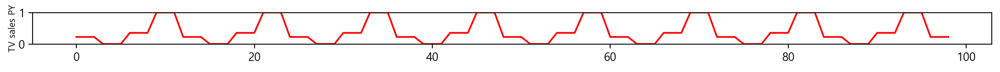

corr: [0.35] / importance: 3.0 %


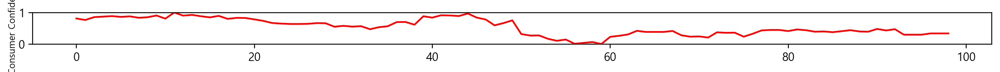

corr: [-0.53] / importance: 7.000000000000001 %


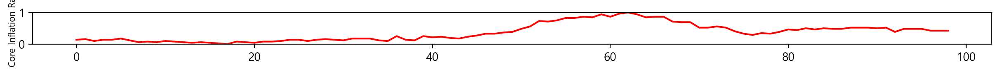

corr: [0.31] / importance: 2.0 %


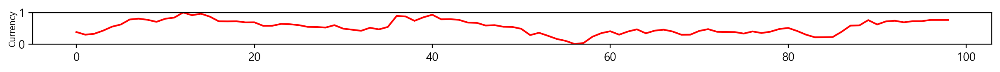

corr: [-0.34] / importance: 1.0 %


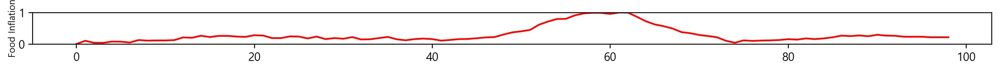

corr: [0.49] / importance: 16.0 %


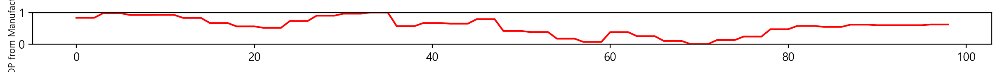

corr: [-0.01] / importance: 3.0 %


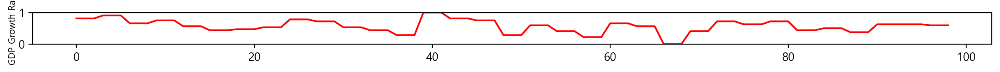

corr: [-0.5] / importance: 6.0 %


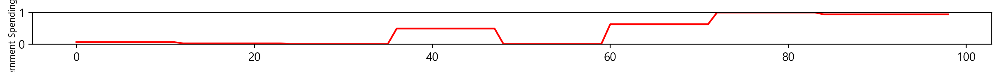

corr: [-0.45] / importance: 6.0 %


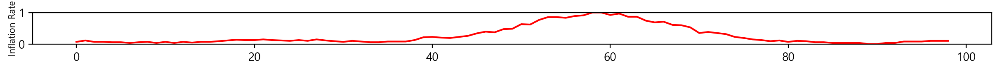

corr: [-0.54] / importance: 3.0 %


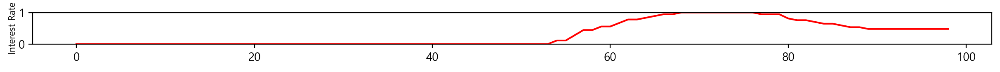

corr: [-0.2] / importance: 0.0 %


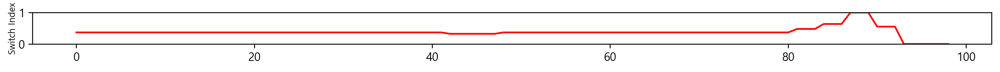

랜덤 포레스트 회귀: 예측 결과


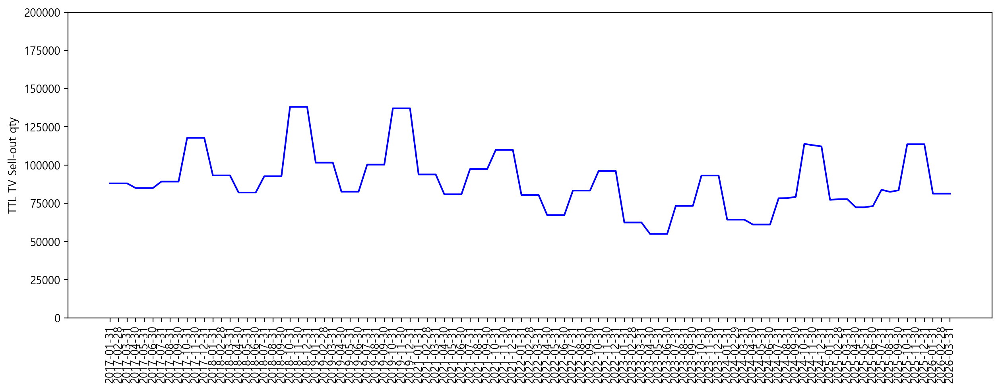

78549.0 112951.0 77488.0 72564.0 83200.0 113568.0
-------
(33, 15)
구글트렌드 적용: N
법인명: 22.FI
(120, 124)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월
(81, 123)
(81, 124)
랜덤 포레스트 회귀
Train 결정계수: 0.99
Test 결정계수: 0.932


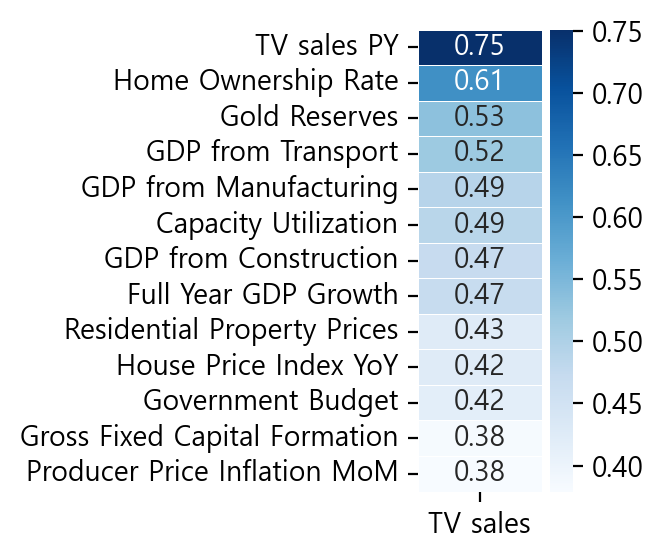

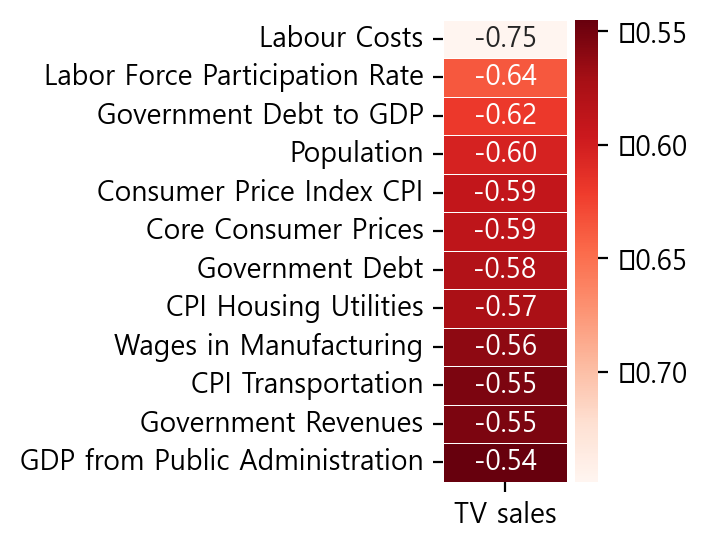

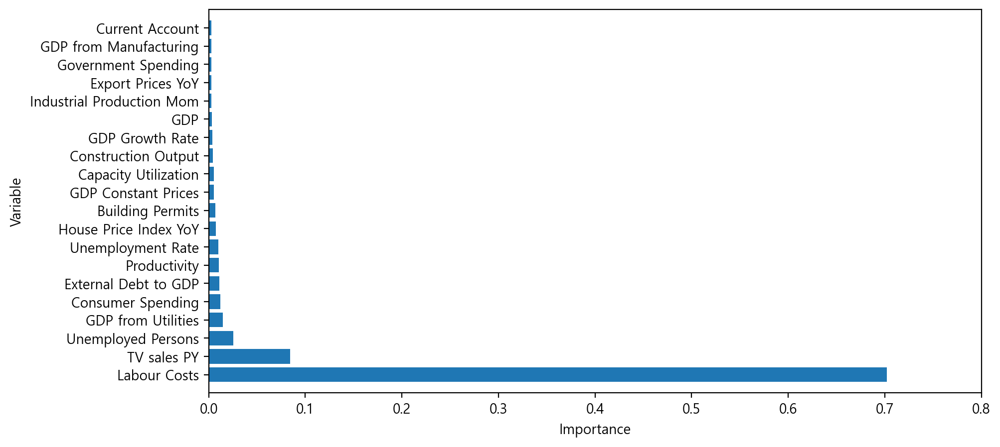

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


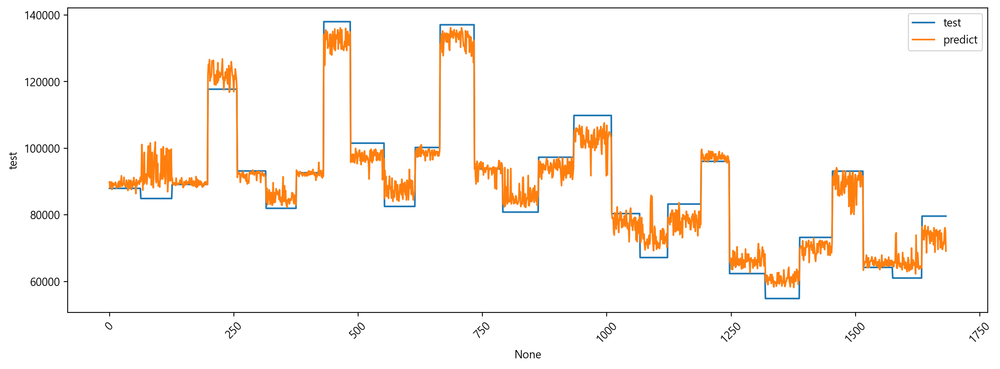

(81, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
max_feature 조정: 0
max_feature 갯수: 0
(81, 11)
랜덤 포레스트 회귀
Train 결정계수: 0.994
Test 결정계수: 0.961


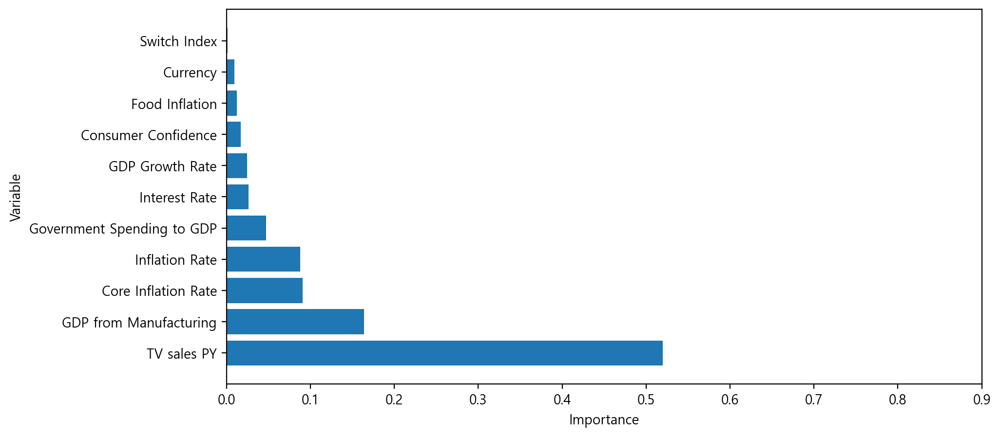

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


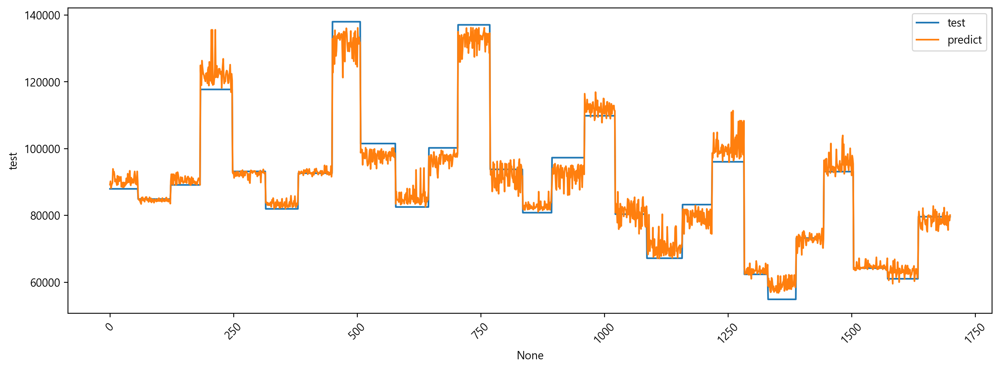

(102, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
(102, 11)
랜덤 포레스트 회귀


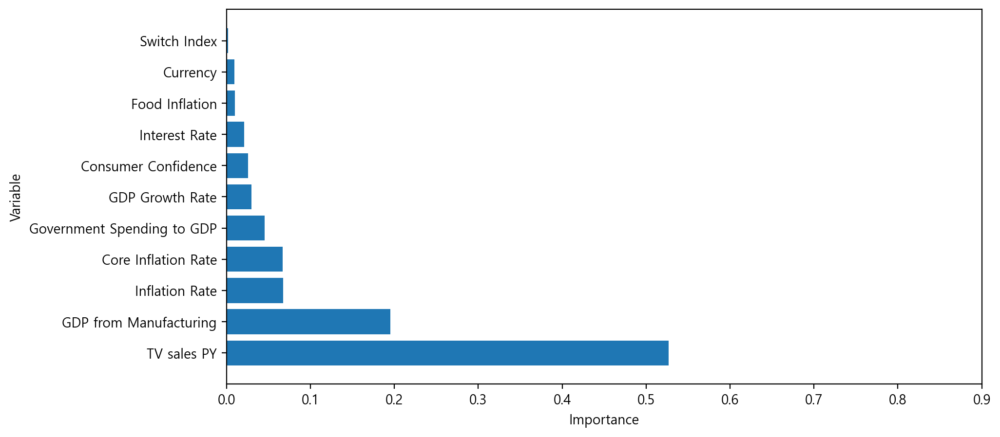

corr: [0.75] / importance: 53.0 %


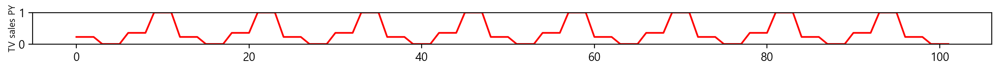

corr: [0.35] / importance: 3.0 %


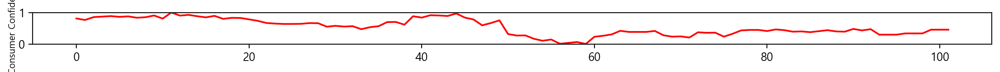

corr: [-0.53] / importance: 7.000000000000001 %


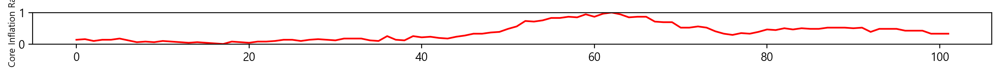

corr: [0.32] / importance: 1.0 %


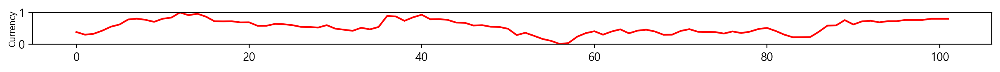

corr: [-0.32] / importance: 1.0 %


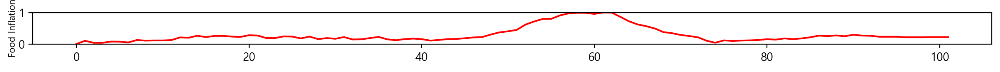

corr: [0.49] / importance: 20.0 %


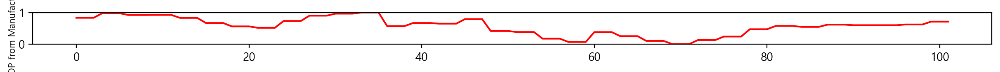

corr: [-0.02] / importance: 3.0 %


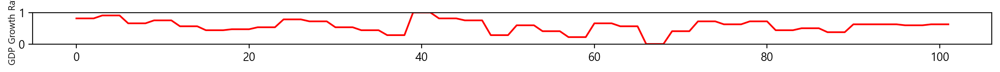

corr: [-0.49] / importance: 5.0 %


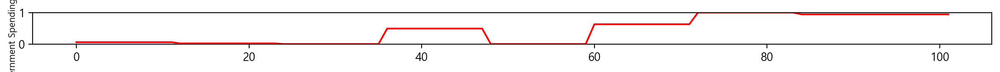

corr: [-0.43] / importance: 7.000000000000001 %


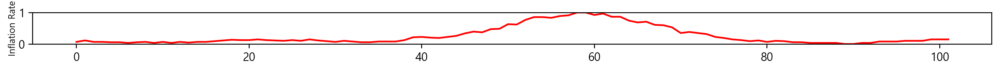

corr: [-0.54] / importance: 2.0 %


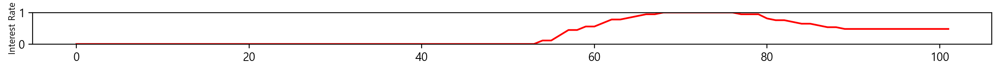

corr: [-0.21] / importance: 0.0 %


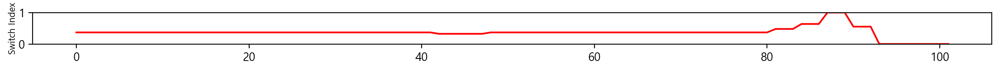

랜덤 포레스트 회귀: 예측 결과


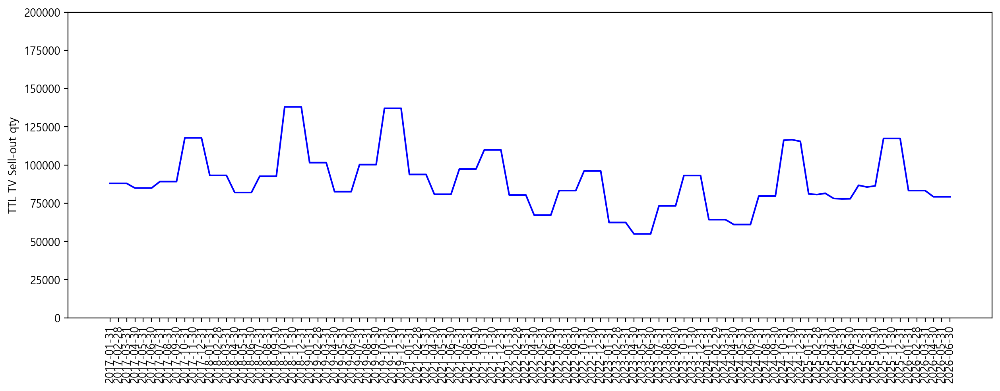

116046.0 81030.0 77938.0 86180.0 117325.0 83237.0
-------
(33, 15)
구글트렌드 적용: N
법인명: 22.FI
(120, 124)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월
(84, 123)
(84, 124)
랜덤 포레스트 회귀
Train 결정계수: 0.991
Test 결정계수: 0.941


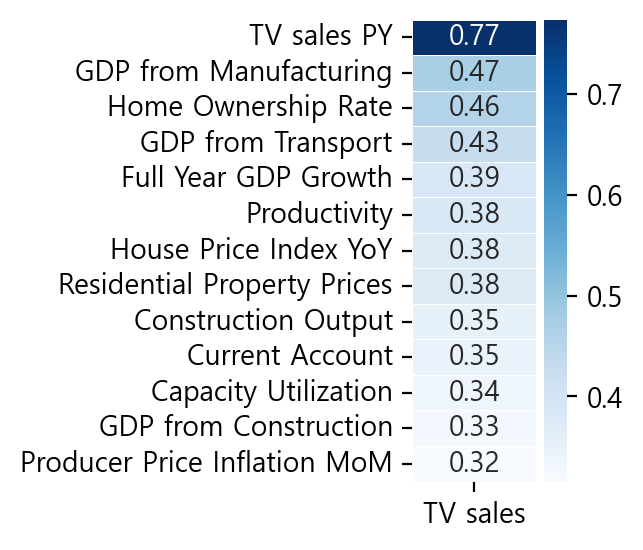

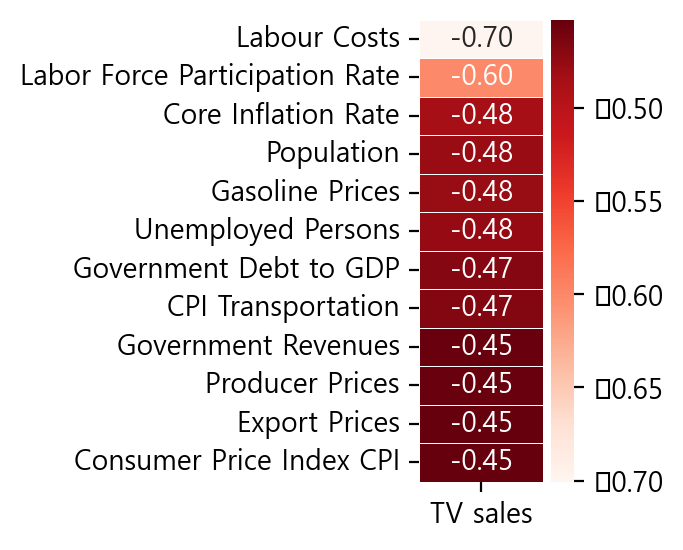

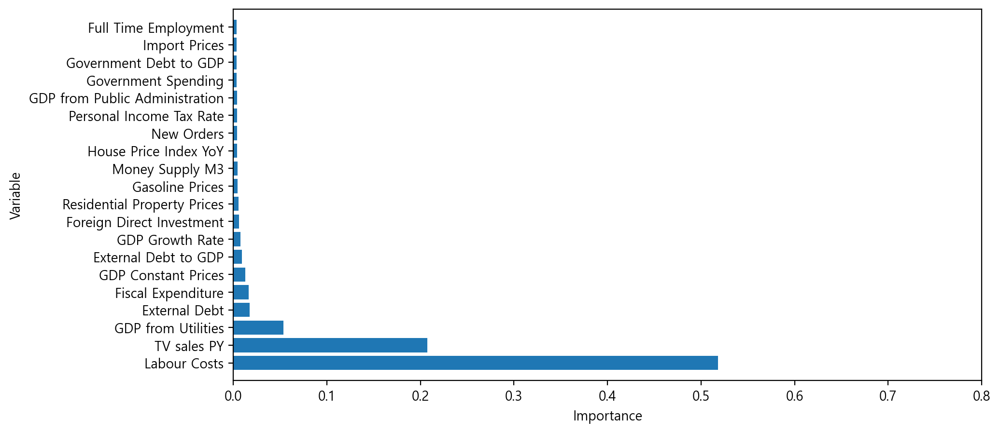

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


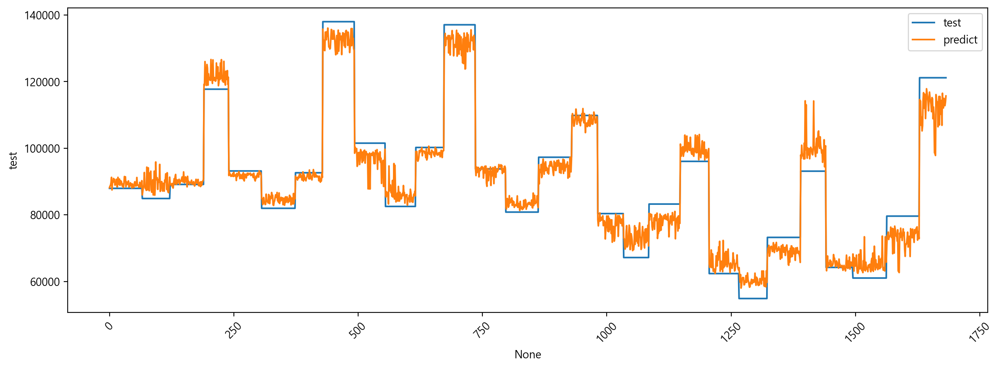

(84, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
max_feature 조정: 0
max_feature 갯수: 0
(84, 11)
랜덤 포레스트 회귀
Train 결정계수: 0.995
Test 결정계수: 0.966


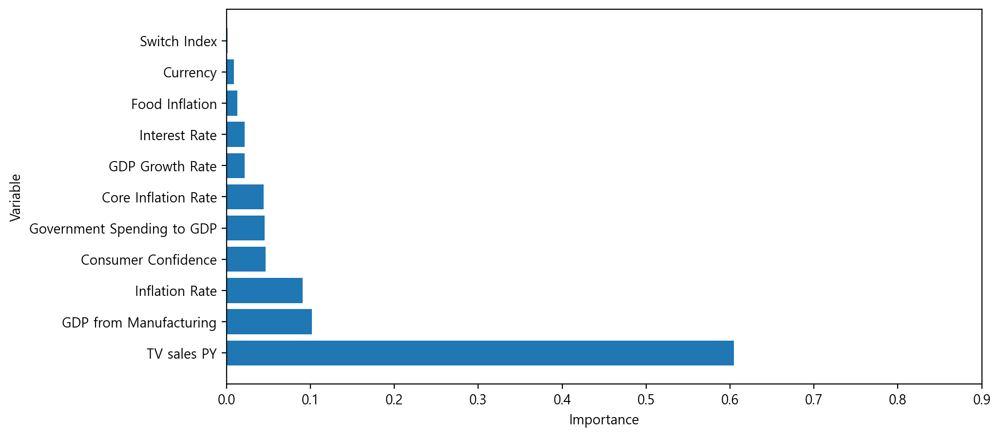

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


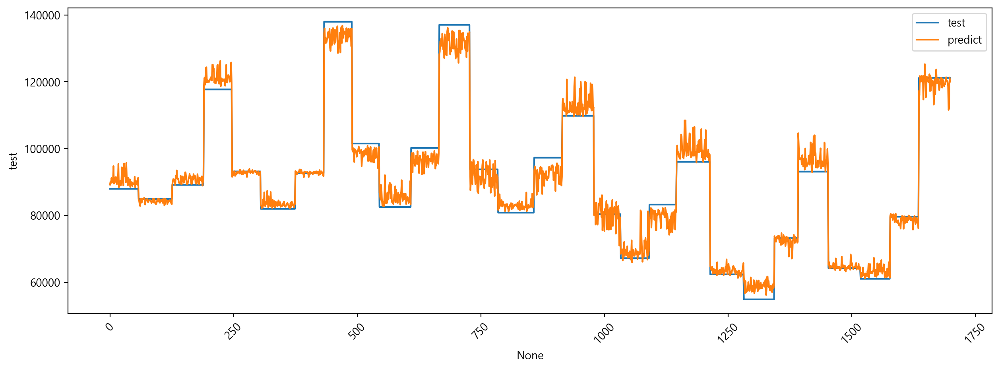

(105, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
(105, 11)
랜덤 포레스트 회귀


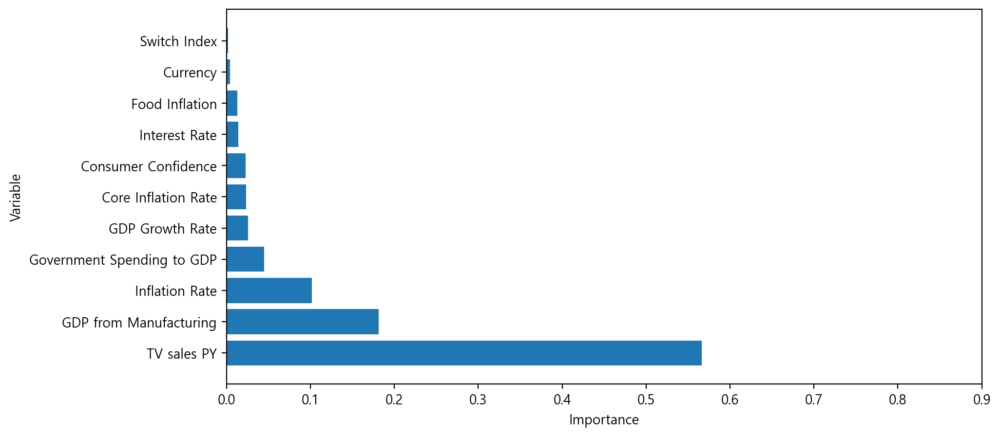

corr: [0.77] / importance: 56.99999999999999 %


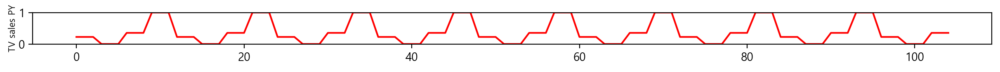

corr: [0.31] / importance: 2.0 %


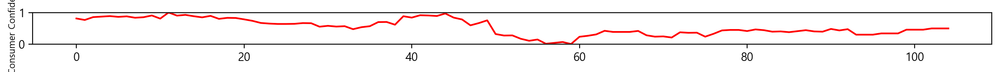

corr: [-0.48] / importance: 2.0 %


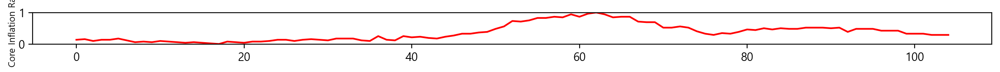

corr: [0.24] / importance: 0.0 %


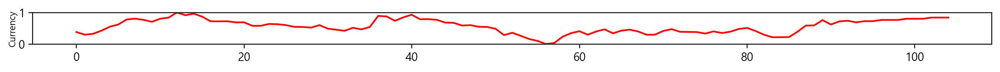

corr: [-0.34] / importance: 1.0 %


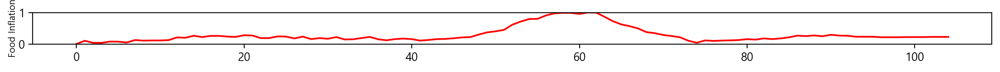

corr: [0.47] / importance: 18.0 %


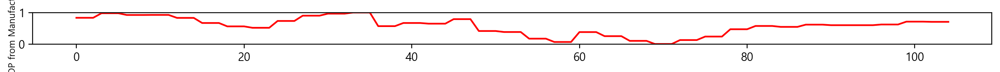

corr: [-0.05] / importance: 3.0 %


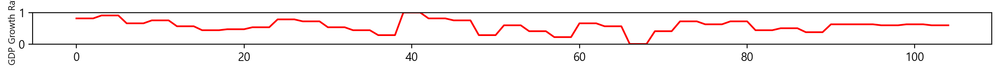

corr: [-0.33] / importance: 4.0 %


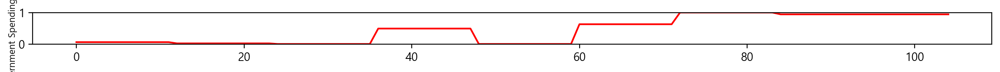

corr: [-0.45] / importance: 10.0 %


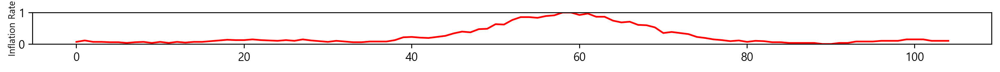

corr: [-0.44] / importance: 1.0 %


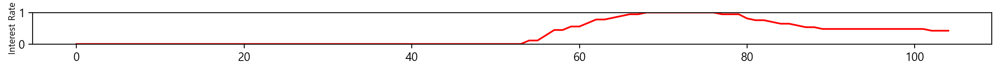

corr: [0.16] / importance: 0.0 %


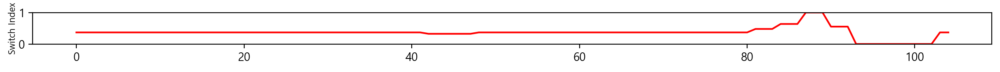

랜덤 포레스트 회귀: 예측 결과


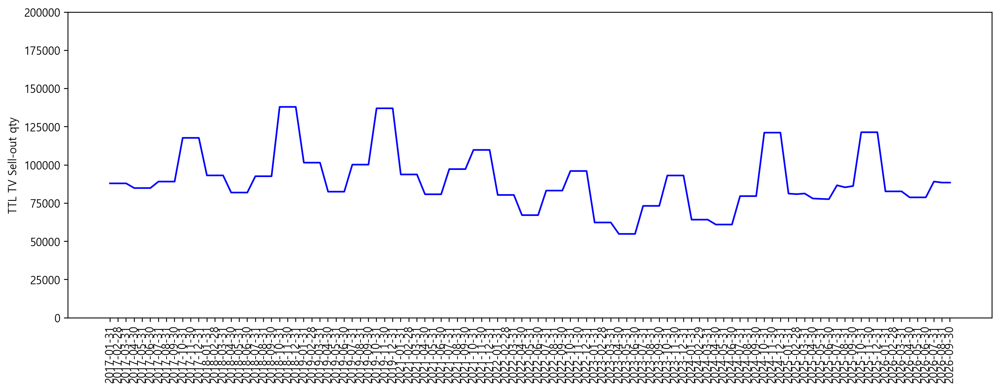

81162.0 77828.0 86101.0 121409.0 82712.0 78793.0


In [120]:
################ 임시 ################
for month_add in tqdm.tqdm_notebook(range(0,16,3)):  # 시작 0 23.9 / 3 23.12 / 6 24.3 / 9 24.6 / 12 24.9 / 15 24.12 / 18 25.3
    
    m_rows_init = 90 - 6 - 15 + 12 + month_add  ### Gfk 실적 기준   = 24.06 - 6 = 23.12 - 15 + 12 = 23.9
    m_rows_2_init = 102 - 6 - 9 + 15 + int(np.floor(month_add/3)*3) ### 예측기간 기준   = 25.06 - 6 = 24.12 -9 + 15 = 25.6
    pred_iloc = m_rows_init%3 # 당분기 가져올 실적갯수
    covid = 0
    m_rows_init_org = m_rows_init
    m_rows_2_init_org = m_rows_2_init

#     for sub_i in tqdm.tqdm_notebook(range(1,subs_no,1)):
    for sub_i in range(sub_i,sub_i+1,1):

        ##### DX Signal 법인만 추출 #####
        # dx_signal_sub = [1]
        # for sub_i in tqdm.tqdm_notebook(dx_signal_sub):
        #################################

        m_rows_init = m_rows_init_org
        m_rows_2_init = m_rows_2_init_org

        file_dir_sub = "{}/{}/0.ALL/subsidiary_name.csv".format(ML_dir, PG_dir)
        # 법인정보 가져오기 #
        df_subsidiary = pd.DataFrame()
        df_subsidiary = pd.read_csv(file_dir_sub)

        ##### flag 추가 24.09.12 #####
        if df_subsidiary["ml_fcst"][sub_i-1] == "Y":

            print("-------")
            print(df_subsidiary.shape)
            df_subsidiary_name = list(df_subsidiary["subsidiary_name"])
            subsidiary_name = df_subsidiary_name[sub_i-1]

            google_trends_yn = df_subsidiary.loc[sub_i-1,"google_trends"]
            if use_google_trends == "Y":
                print("구글트렌드 적용: "+google_trends_yn)

            print("법인명: "+subsidiary_name)

            file_dir = "{}/{}/{}/Raw/historical_indicator_Q.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir2 = "{}/{}/{}/corr_data.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir3 = "{}/{}/{}/regression_data.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir4 = "{}/{}/{}/regression_pred_data.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir5 = "{}/{}/{}/regression_data_m.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir6 = "{}/{}/{}/regression_pred_data_m.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir7 = "{}/{}/{}/regression_data_m_f.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir8 = "{}/{}/{}/regression_pred_data_m_c.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir9 = "{}/{}/{}/regression_pred_data_fn.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir10 = "{}/{}/{}/Raw/feature_names_selection.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir11 = "{}/{}/{}/regression_data_m_c.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir12 = "{}/{}/{}/regression_pred_data_m_c_lgbm.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir13 = "{}/{}/{}/regression_pred_data_m_c_svm.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir14 = "{}/{}/{}/regression_pred_data_m_lgbm.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir15 = "{}/{}/{}/regression_data_m_c_svm.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir16 = "{}/{}/{}/test_composite.xlsx".format(ML_dir, PG_dir, subsidiary_name)
            file_dir17 = "{}/{}/{}/regression_data_m_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir18 = "{}/{}/{}/regression_pred_data_m_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir19 = "{}/{}/{}/corr_data_wo_covid.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir20 = "{}/{}/{}/test.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir21 = "{}/{}/{}/test_composite_Q.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir22 = "{}/{}/{}/regression_data_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir23 = "{}/{}/{}/regression_pred_data_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir24 = "{}/{}/{}/regression_data_m_f_woc.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir25 = "{}/{}/{}/regression_data_m_lgbm.csv".format(ML_dir, PG_dir, subsidiary_name)
            file_dir26 = "{}/{}/{}/te_forecast.csv".format(ML_dir, PG_dir, subsidiary_name)

            df = pd.read_csv(file_dir)

            covid_start = 0
            covid_end = 0
            covid_range = 0


            if exclude_covid == "Y":
                covid_start = df[df["COVID_YN"]==1].index[0:].min()   # COVID 시작
                covid_end = df[df["COVID_YN"]==1].index[0:].max()+1   # COVID 끝

            # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질 2016년 부터
            #     covid_start = covid_start + 12 
            #     covid_end = covid_end + 12

            covid_range = covid_end - covid_start
            exclude_covid_org = exclude_covid

            if np.isnan(covid_range):
                exclude_covid = "N" # Pent-up 수요기간 없을 경우


            # 23.04.12 제외 
            # if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            #     df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            #     df = df.reset_index(drop=True)

            print(df.shape)
            print("COVID 구간 제외 여부: ",exclude_covid)
            print("COVID 구간 : ",covid_range)
            df_org = df.copy()


            # # 23.4.12 추가
            # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
            #     m_rows_init = m_rows_init + 12         # 2020.01
            #     m_rows_2_init = m_rows_2_init + 12     # 2020.12

            m_rows = m_rows_init    
            m_rows_2 = m_rows_2_init  


            ### m_rows 추가 조정 ###
            if exclude_covid == "Y" :
                m_rows = m_rows-covid_range
                m_rows_2 = m_rows_2-covid_range

            # 23.4.12 제외
            # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
            #     m_rows = m_rows + 12         # 2020.01
            #     m_rows_2 = m_rows_2 + 12     # 2020.12
            ### m_rows 추가 조정 ###


            t_size = m_rows_2-m_rows     # 예측기간
            q_loc = 0      # Q+1 시작점


            org_feature_no = df.shape[1]-2 # Features
            max_feature_adj = 0 # max_feature 조정시 1 / 아닐경우 0
            max_feature_no = 0 

            # if subsidiary_name == "07.PL" or subsidiary_name == "09.MS": # Seasonality 종속성 완화
            #     max_feature_adj = 1
            #     max_feature_no = 7

            # if subsidiary_name == "01.CI" or subsidiary_name == "14.IL" or subsidiary_name == "06.IS": # Seasonality 종속성 완화
            #     max_feature_adj = 1
            #     max_feature_no = 8

            # if subsidiary_name == "02.US": # Seasonality 종속성 완화
            #     max_feature_adj = 1
            #     max_feature_no = 8

            # if subsidiary_name == "08.UK": # Seasonality 종속성 완화
            #     max_feature_adj = 1
            #     max_feature_no = 12

            max_feature_adj = df_subsidiary["dependency"][sub_i-1]
            max_feature_no = df_subsidiary["max_no"][sub_i-1]
            mov_no = df_subsidiary["mov"][sub_i-1]

            print("max_feature 조정값:(No=0/Yes=1)", max_feature_adj)
            print("max_feature 갯수:", max_feature_no)
            print("feature 범위: 0 ~ -", mov_no,"개월")


            # M0 ~ M+6 TV sales와 인자별 상관계수 분석
            # 상관분석 M+1

            # for mov in range (1,7,1):    # 6개월 선행관계 확인
            for mov in range (0,7,1):    # 6개월 선행관계 확인

                df_TV_sales = pd.DataFrame()
                df_features = pd.DataFrame()
                df_features_mov = pd.DataFrame()

                df_TV_sales = df_org.iloc[covid:m_rows_init,:3]

                df_TV_sales = df_TV_sales.reset_index(drop=True)

                # 24.01.29 변경 mov=0 추가
                if mov == 0:
                    ######
                    df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+1]
                    df = pd.concat([df_TV_sales, df_features], axis=1)
                    ######
                else:

                    # 23.4.12 변경
                    df_features = df_org.iloc[covid:covid+1,3:org_feature_no+1]
                    for item in range (1, mov, 1):
                        # df_features = df_features.append(df_org.iloc[covid:covid+1,3:org_feature_no+1], ignore_index=True)
                        df_features = pd.concat([df_features,df_org.iloc[covid:covid+1,3:org_feature_no+1]], ignore_index=True)

                    # df_features = df_features.append(df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2], ignore_index=True)
                    df_features = pd.concat([df_features,df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2]], ignore_index=True)

                    df = pd.concat([df_TV_sales, df_features], axis=1)

                # 23.4.12 추가
                if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
                    df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
                    df = df.reset_index(drop=True)

            #     if mov == 1:
                if mov == 0:
                    print(df.shape)
                
                # JESSICA REVISION
                num_df = df.select_dtypes(include=[np.number])
                df_cor = num_df.corr()
                # df_cor = df.corr()
                num = df_cor._get_numeric_data()
                num[num < 0] = num*-1

                corr_data_pros = pd.DataFrame()
                corr_data_cons = pd.DataFrame()
                corr_data_pros = num_df.corr().iloc[:,[0]]
                corr_data_cons = num_df.corr().iloc[:,[0]]
                corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
                corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

                corr_data_pros["mov"] = mov

                if exclude_covid == "Y" :
                    if not os.path.exists(file_dir19):
                        corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
                    else:
            #             if mov==1:
                        if mov==0:
                            corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            corr_data_pros.to_csv(file_dir19, index=True, mode='a', encoding='utf-8-sig', header=False)
                else:            
                    # .to_csv 
                    # 최초 생성 이후 mode는 append
                    if not os.path.exists(file_dir2):
                        corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
                    else:
            #             if mov==1:
                        if mov==0:
                            corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            corr_data_pros.to_csv(file_dir2, index=True, mode='a', encoding='utf-8-sig', header=False)


            # TV sales vs 지표별 상관계수

            # 파일 열기
            df = pd.read_csv(file_dir)

            df_TV_sales = pd.DataFrame()
            df_features = pd.DataFrame()
            df_features_mov = pd.DataFrame()

            df_TV_sales = df.iloc[covid:m_rows_init,:3]

            df_TV_sales = df_TV_sales.reset_index(drop=True)


            # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
            df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
            df = pd.concat([df_TV_sales, df_features], axis=1)


            # 23.4.12 변경
            # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

            # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
            # df = pd.concat([df_TV_sales, df_features], axis=1)

            # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
            # for item in range (2, mov_no+1, 1):

            # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

            # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
            # df = pd.concat([df_TV_sales, df_features], axis=1)

            for item in range (1, mov_no+1, 1):
                if item == 1:
                    df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                    df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                    df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

                else:
                    df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                    df_features_mov = df_features_mov.fillna(method='bfill')

                new_cols = []
                for col in df_features_mov.columns:
                    new_col = str(col + "_" + str(item))
                    new_cols.append(new_col)

                df_features_mov.columns = new_cols

                df = pd.concat([df, df_features_mov], axis=1)
            #변경 완료


            # 23.4.12 추가
            if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
                df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
                df = df.reset_index(drop=True)

#             print(df.shape)  

            # JESSICA REVISION
            num_df = df.select_dtypes(include=[np.number])
            df_cor = num_df.corr()
            # df_cor = df.corr()
            num = df_cor._get_numeric_data()
            num[num < 0] = num*-1

            corr_data = pd.DataFrame()
            corr_data_pros = pd.DataFrame()
            corr_data_cons = pd.DataFrame()
            corr_data = num_df.corr().iloc[:,[0]]
            corr_data_pros = num_df.corr().iloc[:,[0]]
            corr_data_cons = num_df.corr().iloc[:,[0]]
            corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
            corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

            plt.figure(figsize=(1,3))
            sns.heatmap(data = corr_data_pros.iloc[1:14,[0]], annot=True, 
            fmt = '.2f', linewidths=.3, cmap='Blues')
            plt.figure(figsize=(1,3))
            sns.heatmap(data = corr_data_cons.iloc[:12,[0]], annot=True, 
            fmt = '.2f', linewidths=.3, cmap='Reds')

            corr_data_pros_index1 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[1:3].tolist() + corr_data_pros.index[4:5].tolist() + corr_data_pros.index[6:9].tolist()
            corr_data_pros_index2 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[8:14].tolist()
            corr_data_pros_index3 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[14:20].tolist()
            corr_data_cons_index1 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[0:6].tolist()
            corr_data_cons_index2 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[6:12].tolist()
#             print(corr_data_pros_index1)
#             print(corr_data_cons_index1)

            ### 그래프 최대값 ###
            max_sales = (max(df[prod_type]) // 10**(len(str(max(df[prod_type]))) - 1) + 1) * 10**(len(str(max(df[prod_type]))) - 1)

            #########################################################
            ######## ----- 여기까지 필수로 실행할 것 ----- ##########
            #########################################################

            # 랜덤포레스트를 통한 중요도 분석

            # 파일 열기
            df = pd.read_csv(file_dir)

            df_TV_sales = pd.DataFrame()
            df_features = pd.DataFrame()
            df_features_mov = pd.DataFrame()

            df_TV_sales = df.iloc[covid:m_rows_init,:3]

            df_TV_sales = df_TV_sales.reset_index(drop=True)


            # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
            df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
            df = pd.concat([df_TV_sales, df_features], axis=1)


            # 23.4.12 변경
            # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

            # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
            # df = pd.concat([df_TV_sales, df_features], axis=1)

            # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
            # for item in range (2, mov_no+1, 1):

            # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

            # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
            # df = pd.concat([df_TV_sales, df_features], axis=1)

            for item in range (1, mov_no+1, 1):
                if item == 1:
                    df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                    df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                    df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

                else:
                    df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                    df_features_mov = df_features_mov.fillna(method='bfill')

                new_cols = []
                for col in df_features_mov.columns:
                    new_col = str(col + "_" + str(item))
                    new_cols.append(new_col)

                df_features_mov.columns = new_cols

                df = pd.concat([df, df_features_mov], axis=1)
            #변경 완료


            # 23.4.12 추가
            if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
                df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
                df = df.reset_index(drop=True)

            print(df.shape)


            # 23.7.5 feature 수 다시 계산함
            feature_no = df.shape[1]-2 # Features
            df_feature_names = df.columns[2:feature_no+2] 
            df_feature_names = list(df_feature_names)

            df_data = np.array(df.iloc[:,2:feature_no+2]) 
            df_target = np.array(df[prod_type])



            rfc_train_score = 0
            rfc_test_score = 0

            ### 100회 실시 ###
            for num in range (1,100,1):

                X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

                # 랜덤 포레스트를 사용한 경우의 중요 특성
                rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
                rfc.fit(X_train, y_train)        

                y_pred = rfc.predict(X_test)
                df2 = pd.DataFrame()
                df2["test"]= pd.Series(y_test)
                df2["predict"] = pd.Series(y_pred)

                # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
                df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

                #df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_ })
                df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                              'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
                df_importance = df_importance.sort_values('importance', ascending=False)

                df_importance.index.name = "index_s"
                df_importance["train accuracy"] = round(rfc.score(X_train, y_train),3)
                df_importance["test accuracy"] = round(rfc.score(X_test, y_test),3)
                df_importance["num"] = num

                rfc_train_score = rfc_train_score + round(rfc.score(X_train, y_train),3)
                rfc_test_score = rfc_test_score + round(rfc.score(X_test, y_test),3)


                if exclude_covid == "N": # COVID 제외 로직 추가           
                    # .to_csv 
                    # 최초 생성 이후 mode는 append
                    if not os.path.exists(file_dir3):
                        df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1:
                            df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df_importance.to_csv(file_dir3, index=True, mode='a', encoding='utf-8-sig', header=False)

                    if not os.path.exists(file_dir4):
                        df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1:
                            df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df2.to_csv(file_dir4, index=True, mode='a', encoding='utf-8-sig', header=False)

                else:                    
                    # .to_csv 
                    # 최초 생성 이후 mode는 append
                    if not os.path.exists(file_dir22):
                        df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1:
                            df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df_importance.to_csv(file_dir22, index=True, mode='a', encoding='utf-8-sig', header=False)

                    if not os.path.exists(file_dir23):
                        df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1:
                            df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df2.to_csv(file_dir23, index=True, mode='a', encoding='utf-8-sig', header=False)


            x = df_importance.feature
            y = df_importance.importance
            ypos = np.arange(len(x)-1)

            print("랜덤 포레스트 회귀")
            print("Train 결정계수:", round(rfc_train_score/num,3))
            print("Test 결정계수:", round(rfc_test_score/num,3))
            plt.figure(figsize=(10,5))
            plt.barh(x.iloc[:20], y.iloc[:20])
            plt.yticks(ypos[:20], x.iloc[:20])
            plt.xlabel('Importance')
            plt.ylabel('Variable')
            plt.xlim(0, 0.8)
            plt.ylim(-1, 20)
            plt.show()



            print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")

            df_pred = pd.DataFrame()

            if exclude_covid == "N": # COVID 제외 로직 추가           
                df_pred = pd.read_csv(file_dir4, index_col=0)
                df_pred = df_pred.sort_values(by='ds')
                df_pred.reset_index(drop=True, inplace=True)
                fig = plt.figure(figsize=(15, 5))
                sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
                sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
                plt.xticks(rotation=45)
                plt.show()

            else:                    
                df_pred = pd.read_csv(file_dir23, index_col=0)
                df_pred = df_pred.sort_values(by='ds')
                df_pred.reset_index(drop=True, inplace=True)
                fig = plt.figure(figsize=(15, 5))
                sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
                sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
                plt.xticks(rotation=45)
                plt.show()


            # [학습] 선행지표 기준 머신러닝 학습
            # 파일 열기
            df = pd.read_csv(file_dir)

            df_TV_sales = pd.DataFrame()
            df_features = pd.DataFrame()
            df_features_mov = pd.DataFrame()

            df_TV_sales = df.iloc[covid:m_rows_init,:3]

            df_TV_sales = df_TV_sales.reset_index(drop=True)


            # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
            df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
            df = pd.concat([df_TV_sales, df_features], axis=1)


            # 23.4.12 변경
            # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

            # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
            # df = pd.concat([df_TV_sales, df_features], axis=1)

            # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
            # for item in range (2, mov_no+1, 1):

            # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

            # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
            # df = pd.concat([df_TV_sales, df_features], axis=1)

            for item in range (1, mov_no+1, 1):
                if item == 1:
                    df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                    df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                    df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

                else:
                    df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                    df_features_mov = df_features_mov.fillna(method='bfill')

                new_cols = []
                for col in df_features_mov.columns:
                    new_col = str(col + "_" + str(item))
                    new_cols.append(new_col)

                df_features_mov.columns = new_cols

                df = pd.concat([df, df_features_mov], axis=1)
            #변경 완료



            # 23.4.12 추가
            if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
                df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
                df = df.reset_index(drop=True)

            print(df.shape)


            ###################################################
            ### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
            ###################################################
            df_features = pd.read_csv(file_dir10)

            if use_google_trends == "N":
                df_features = df_features[~df_features["feature_names"].isin(gt_key)]

            print(df_features.shape)
            df_feature_index = list(df_features["index_s"])
            df_feature_names = list(df_features["feature_names"])

            df_feature_names

            m_feature = len(df_feature_names)
            print(m_feature)
            print(df_feature_index)

            # # feature 수 조정 테스트 #
            print("max_feature 조정:", max_feature_adj)
            print("max_feature 갯수:", max_feature_no)


            ############################################
            ### df_data 파일 입력으로 변경 21.11.30  ###
            ############################################
            df_data = np.array(df.iloc[:,2:3])

            for n in range(1,m_feature,1):

                df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

            print(df_data.shape)
            df_target = np.array(df[prod_type])

            rfc_train_score = 0
            rfc_test_score = 0
            rfc_test_adj_score = 0
            svm_train_score = 0
            svm_test_score = 0

            ### 100회 실시 ###
            for num in range (1,101,1):

                #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
                X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

                # 랜덤 포레스트를 사용한 경우의 중요 특성
                if max_feature_adj == 0 :
                    rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
                elif max_feature_adj == 1 :
                    ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
                    rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)

                rfc.fit(X_train, y_train)

                y_pred = rfc.predict(X_test)
                df2 = pd.DataFrame()
                df2["test"]= pd.Series(y_test)
                df2["predict"] = pd.Series(y_pred)
                df2["num"] = num
                df2["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)

                # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
                df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

                df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                              'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
                df_importance = df_importance.sort_values('importance', ascending=False)

                df_importance.index.name = "index_s"    

                df_importance["train accuracy"] = round(rfc.score(X_train, y_train),3)
                df_importance["test accuracy"] = round(rfc.score(X_test, y_test),3)

                ### 수정 결정계수 분석을 위해 추가 21.12.13
                X_train2 = sm.add_constant(X_train)
                model2 = sm.OLS(y_train, X_train2)
                result = model2.fit()
                df_importance["test ols accuracy"] = result.rsquared.round(3)
                df_importance["test adj accuracy"] = result.rsquared_adj.round(3)

                df_importance["num"] = num    


                rfc_train_score = rfc_train_score + round(rfc.score(X_train, y_train),3)
                rfc_test_score = rfc_test_score + round(rfc.score(X_test, y_test),3)
                rfc_test_adj_score = rfc_test_adj_score + result.rsquared_adj.round(3)


                ### 구글트렌드 사용시에만 저장 24.06.12 ###
                if use_google_trends == "Y":

                    if exclude_covid == "N": # COVID 제외 로직 추가
                        # .to_csv 
                        # 최초 생성 이후 mode는 append
                        if not os.path.exists(file_dir5):
                            df_importance.to_csv(file_dir5, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            if num==1: 
                                df_importance.to_csv(file_dir5, index=True, mode='w', encoding='utf-8-sig')
                            else:
                                df_importance.to_csv(file_dir5, index=True, mode='a', encoding='utf-8-sig', header=False)

                        if not os.path.exists(file_dir6):
                            df2.to_csv(file_dir6, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            if num==1: 
                                df2.to_csv(file_dir6, index=True, mode='w', encoding='utf-8-sig')
                            else:
                                df2.to_csv(file_dir6, index=True, mode='a', encoding='utf-8-sig', header=False)

                    else:
                        # .to_csv 
                        # 최초 생성 이후 mode는 append
                        if not os.path.exists(file_dir17):
                            df_importance.to_csv(file_dir17, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            if num==1: 
                                df_importance.to_csv(file_dir17, index=True, mode='w', encoding='utf-8-sig')
                            else:
                                df_importance.to_csv(file_dir17, index=True, mode='a', encoding='utf-8-sig', header=False)

                        if not os.path.exists(file_dir18):
                            df2.to_csv(file_dir18, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            if num==1: 
                                df2.to_csv(file_dir18, index=True, mode='w', encoding='utf-8-sig')
                            else:
                                df2.to_csv(file_dir18, index=True, mode='a', encoding='utf-8-sig', header=False)   



            x = df_importance.feature
            y = df_importance.importance
            ypos = np.arange(len(x))

            print("랜덤 포레스트 회귀")
            print("Train 결정계수:", round(rfc_train_score/num,3))
            print("Test 결정계수:", round(rfc_test_score/num,3))
            plt.figure(figsize=(10,5))
            plt.barh(x.iloc[0:], y.iloc[0:])
            plt.yticks(ypos, x.iloc[0:])
            plt.xlabel('Importance')
            plt.ylabel('Variable')
            plt.xlim(0, 0.9)
            plt.ylim(-1, len(x))
            plt.show()


            print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")


            if exclude_covid == "N": # COVID 제외 로직 추가           
                df_pred = pd.read_csv(file_dir6, index_col=0)
                df_pred = df_pred.sort_values(by='ds')
                df_pred.reset_index(drop=True, inplace=True)
                fig = plt.figure(figsize=(15, 5))
                sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
                sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
                plt.xticks(rotation=45)
                plt.show()

            else:                    
                df_pred = pd.read_csv(file_dir18, index_col=0)
                df_pred = df_pred.sort_values(by='ds')
                df_pred.reset_index(drop=True, inplace=True)
                fig = plt.figure(figsize=(15, 5))
                sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
                sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
                plt.xticks(rotation=45)
                plt.show()



            # [예측] 선행지표 기준 Q+1~Q+2 예측

            # 파일 열기
            df = pd.read_csv(file_dir)

            df_TV_sales = pd.DataFrame()
            df_features = pd.DataFrame()
            df_features_mov = pd.DataFrame()

            df_TV_sales = df.iloc[covid:m_rows_2_init,:3]

            df_TV_sales = df_TV_sales.reset_index(drop=True)


            # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
            df_features = df_org.iloc[covid:m_rows_2_init,3:org_feature_no+2]
            df = pd.concat([df_TV_sales, df_features], axis=1)


            # 23.4.12 변경
            # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

            # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
            # df = pd.concat([df_TV_sales, df_features], axis=1)

            # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
            # for item in range (2, mov_no+1, 1):

            # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

            # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
            # df = pd.concat([df_TV_sales, df_features], axis=1)

            for item in range (1, mov_no+1, 1):
                if item == 1:
                    df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                    df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_2_init-1,3:org_feature_no+2], ignore_index=True)
                    df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

                else:
                    df_features_mov = df.iloc[covid:m_rows_2_init,3:org_feature_no+2].shift(item-1)
                    df_features_mov = df_features_mov.fillna(method='bfill')

                new_cols = []
                for col in df_features_mov.columns:
                    new_col = str(col + "_" + str(item))
                    new_cols.append(new_col)

                df_features_mov.columns = new_cols

                df = pd.concat([df, df_features_mov], axis=1)
            #변경 완료


            # 23.4.12 추가
            if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
                df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
                df = df.reset_index(drop=True)

            print(df.shape)


            ###################################################
            ### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
            ###################################################
            df_features = pd.read_csv(file_dir10)

            if use_google_trends == "N":
                df_features = df_features[~df_features["feature_names"].isin(gt_key)]
            print(df_features.shape)
            df_feature_index = list(df_features["index_s"])
            df_feature_names = list(df_features["feature_names"])

            df_feature_names

            m_feature = len(df_feature_names)
            print(m_feature)
            print(df_feature_index)

            ############################################
            ### df_data 파일 입력으로 변경 21.11.30  ###
            ############################################
            df_data = np.array(df.iloc[:,2:3])

            for n in range(1,m_feature,1):

                df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

            print(df_data.shape)
            df_target = np.array(df[prod_type])

            #df_norm_feature_names = list(df.columns[1:2]) + list(df_feature_names)  
            df_norm_feature_names = list(df_feature_names)  
            df_norm_data = df_data

            df_norm = pd.DataFrame()
            scaler = MinMaxScaler()
            df_norm = pd.DataFrame(scaler.fit_transform(df_norm_data), columns=df_norm_feature_names)
            df_norm.insert(0, prod_type, df[prod_type])
            df_norm.insert(0, 'ds', df["ds"])
            #df_data_trans = np.array(df_norm.iloc[:,2:])

            ##############################
            ### 스케일링값 저장        ###
            ##############################
            ### 구글트렌드 사용시에만 저장 24.06.12 ###
            if use_google_trends == "Y":
                if exclude_covid == "N": # COVID 제외 로직 추가
                    df_norm.to_csv(file_dir20, index=True, mode='w', encoding='utf-8-sig')

            #X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, shuffle=False, test_size=t_size)
            X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
            #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=t_size)

            df_importance = pd.DataFrame()

            # 랜덤 포레스트를 사용한 경우의 중요 특성
            # 랜덤 포레스트를 사용한 경우의 중요 특성
            if max_feature_adj == 0 :
                rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
            elif max_feature_adj == 1 :
                ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
                rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)

            rfc.fit(X_train, y_train)

            df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                          'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})


            ### 구글트렌드 사용시에만 저장 24.06.12 ###
            if use_google_trends == "Y":

                if exclude_covid == "N":
                    df_importance.to_csv(file_dir7, index=True, mode='w', encoding='utf-8-sig')
                # 23.4.27 COVID 기간 제외기준 추가
                else:
                    df_importance.to_csv(file_dir24, index=True, mode='w', encoding='utf-8-sig')

            df_importance = df_importance.sort_values('importance', ascending=False)

            x = df_importance.feature
            y = df_importance.importance
            ypos = np.arange(len(x))



            print("랜덤 포레스트 회귀")
        #     print("Train 결정계수:", rfc.score(X_train, y_train).round(3))
            plt.figure(figsize=(10,5))
            plt.barh(x.iloc[0:], y.iloc[0:])
            plt.yticks(ypos, x.iloc[0:])
            plt.xlabel('Importance')
            plt.ylabel('Variable')
            plt.xlim(0, 0.9)
            plt.ylim(-1, len(x))
            plt.show()

            y_pred = rfc.predict(X_test)
            y_train_pred = np.concatenate((y_train, y_pred))

            for n in range(1,m_feature+1,1):

                tv_sales = np.array(df_norm.iloc[:,1:2])
                x_feature = np.array(df_norm.iloc[:,n+1:n+2])
                x_feature_name = df_norm.columns[n+1:n+2]
                # print("정확도:", rfc.score(tv_sales, x_feature))
                #print(x_feature_name)
                #print("R2 Score:",r2_score(tv_sales, x_feature).round(3))
                plt.figure(figsize=(15, 0.5))
            #     plt.plot(y_train_pred/(2*10**7), c='b')
                plt.plot(x_feature, c='r')
                plt.ylim((0,1))
                plt.ylabel(x_feature_name[0], labelpad=1, fontdict={'size': 8})
                values = range(len(df["ds"]))
                #plt.xticks(values,df["ds"], rotation='vertical')
                print("corr:", corr_data_pros.xs(x_feature_name[0]).values.round(2), "/ importance:", df_importance["importance"].loc[n-1].round(2)*100,"%")
                plt.show()   

            print("랜덤 포레스트 회귀: 예측 결과")

            plt.figure(figsize=(15, 5))
            plt.plot(y_train_pred, c='b')
            plt.ylabel("TTL TV Sell-out qty")
            plt.ylim((0,max_sales))
            values = range(len(df["ds"]))
            plt.xticks(values,df["ds"], rotation='vertical')
            plt.show()

        #     # 미국 coverage 변경 반영
        #     if subsidiary_name == "02.US":
        #         y_pred = y_pred * 0.918

            y_pred

            if pred_iloc == 0:
                ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
                # Gfk데이터가 분기마감되었을 때
                y_pred_2 = y_pred 
            else:    
                # Gfk데이터가 분기마감+1개월일 때
                y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred)
                # Gfk데이터가 분기마감+2개월일 때
        #     elif pred_iloc == 2:   
        #         y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred)

            y_pred_2

            ### 21.11.30 추가 - 시점에 따라 iloc 변경 ###
            ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
            ### 24.10.07 추가 - Q+5 로 예측구간 확대
            y_pred_q1 = y_pred_2[q_loc:q_loc+3].mean().round(0)
            y_pred_q2 = y_pred_2[q_loc+3:q_loc+6].mean().round(0)
            y_pred_q3 = y_pred_2[q_loc+6:q_loc+9].mean().round(0)
            y_pred_q4 = y_pred_2[q_loc+9:q_loc+12].mean().round(0)
            y_pred_q5 = y_pred_2[q_loc+12:q_loc+15].mean().round(0)
            y_pred_q6 = y_pred_2[q_loc+15:q_loc+18].mean().round(0)
            print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)

            ### 21.11.30 추가 ###
            ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
            ### 24.10.07 추가 - Q+6 로 예측구간 확대
            df4 = pd.DataFrame()
            df4["predict_Q1"] = pd.Series(y_pred_q1)
            df4["predict_Q2"] = pd.Series(y_pred_q2)
            df4["predict_Q3"] = pd.Series(y_pred_q3)
            df4["predict_Q4"] = pd.Series(y_pred_q4)
            df4["predict_Q5"] = pd.Series(y_pred_q5)
            df4["predict_Q6"] = pd.Series(y_pred_q6)


            ### 구글트렌드 사용/미사용 추가 24.06.12 ###            
            if exclude_covid == "Y":
                if google_trends_yn == "Y":
                    if use_google_trends == "Y":
                        df4["predict_method"] = "RandomForest_wo_COVID"
                    else:
                        df4["predict_method"] = "RandomForest_wo_COVID_wo_GT"
                else:
                    df4["predict_method"] = "RandomForest_wo_COVID"

            else:
                if google_trends_yn == "Y":
                    if use_google_trends == "Y":
                        df4["predict_method"] = "RandomForest"  
                    else:
                        df4["predict_method"] = "RandomForest_wo_GT"
                else:
                    df4["predict_method"] = "RandomForest"


            df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
            # .to_csv
            if not os.path.exists(file_dir9):
                df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
            else:
                if first_fcst == "Y":
                    df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
                else:
                    df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)


            # ML Input 중요도 TV시장지수파일로 변환     
            if exclude_covid == "N" and use_google_trends == "Y":

                df_test = pd.DataFrame()
                df_test_f = pd.DataFrame()

                ###################
                ### 필요시 변경 ###
                ###################
                df_test_f = pd.read_csv(file_dir7)  
                m_rows = 0
                m_cols = 2     
                m_rows_2 = len(df_test_f)+2
                m_cols_2 = len(df_test_f.columns)

                df_test_f = df_test_f.iloc[m_rows:m_rows_2,m_cols:m_cols_2]
                df_test_f = df_test_f.transpose()


                df_test = pd.read_csv(file_dir20)   
                m_rows = 0
                m_cols = 1     
                m_rows_2 = len(df_test)+3
                m_cols_2 = len(df_test.columns)
                print("rows:",m_rows, m_rows_2)
                print("columns:",m_cols, m_cols_2)

                df_test = df_test.iloc[m_rows:m_rows_2,m_cols:m_cols_2]

                wb = load_workbook(file_dir16)
                ws = wb['test_composite']

                try:
                    ws1 = wb['test']
                    ws1.delete_rows(1,m_rows_2-1)
                except:
                    ws1 = wb.create_sheet('test')

                for r in dataframe_to_rows(df_test, index=False, header=True):
                    ws1.append(r)


                try:
                    ws2 = wb['f']
                    ws2.delete_rows(1,3)
                except:
                    ws2 = wb.create_sheet('f')

                for r in dataframe_to_rows(df_test_f, index=False, header=True):
                    ws2.append(r)


                # 함수 적용
                for j in range(m_cols, m_cols_2, 1):
                    for i in range(m_rows+1, m_rows_2-1, 1):
                        #ws.cell(row=i+4, column=j).value = "=test!"+chr(64+j)+str(i+1)+""  
                        # feature name 부터 가져옴 23.12.21
                        ws.cell(row=i+3, column=j).value = ws1.cell(row=i, column=j).value

                # 함수 적용
                for j in range(m_cols, m_cols_2-2, 1):
                    for i in range(2, 4, 1):
                        ws.cell(row=i-1, column=j+2).value = "=f!"+chr(64+j)+str(i)+""


                # 함수 적용 추가 23.12.21
                for j in range(m_cols, m_cols_2-2, 1):
                    for i in range(4, 5, 1):
                        ws.cell(row=i-1, column=j+2).value = "=IF("+chr(64+j+2)+str(2)+">0,"+chr(64+j+2)+str(1)+",-"+chr(64+j+2)+str(1)+")"


                for j in range(m_cols, m_cols_2-2, 1):
                    for i in range(5, 6, 1):
                        ws.cell(row=i-1, column=j+m_cols_2-1).value = "="+chr(64+j+2)+str(4)+""


                #print(chr(65)+chr(65))

                if (m_cols_2-3)*2+3 <= 26:
                    ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+","+chr(64+((m_cols_2-3)*2+3))+"5:"+chr(64+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
                    ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
                elif (m_cols_2-3)*2+3 <= 26*2:
                    ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+",A"+chr(64-(26)+((m_cols_2-3)*2+3))+"5:A"+chr(64-(26)+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
                    ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
            #     for j in range(m_cols, m_cols_2, 1):
            #         ws.cell(row=4, column=j).value = ws1.cell(row=1, column=j).value     

                ##########################################
                ###    시장지수 수식 추가 23.05.17     ###
                ##########################################
                # 이후로 붙혀넣기 
                # Feature 함수 적용
                for j in range(m_cols_2, m_cols_2+m_cols_2-3, 1):
                    for i in range(m_rows+1, m_rows_2-2, 1):
                        ws.cell(row=i+4, column=j).value = "="+chr(64+j-m_cols_2+3)+str(i+4)+"*"+chr(64+j-m_cols_2+3)+"$3"


                # Composite 함수 적용
                for j in range(m_cols_2+m_cols_2-3, m_cols_2+m_cols_2-2, 1):
                    for i in range(m_rows+1, m_rows_2-2, 1):
                        if j-1 <= 26:
                            ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":"+chr(64+j-1)+str(i+4)+")"
                        elif j-1 <= 26*2:
                            ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":A"+chr(64+j-26-1)+str(i+4)+")"


                # 파일 저장
                wb.save(file_dir16)
                wb.close()

                # 데이터프레임으로 변환 후 csv로 저장
                df_region_new = pd.DataFrame()

                app = xw.App(visible=False)
                wbxl= xw.Book(file_dir16)
                sheet = wbxl.sheets['test_composite']
                df_region_new = sheet.range('A4').options(pd.DataFrame, index=False, expand='table').value
                wbxl.close()
                app.kill()

                df_region_new.to_csv(file_dir21, index=False, mode='w', encoding='utf-8-sig')

        #COVID_YN 리셋
        exclude_covid = exclude_covid_org
        if first_fcst == "Y":
            first_fcst = "N"

# [예측] 선행지표 기준 수요예측

In [137]:
####################################
# feature_names 파일 최종 업데이트 #
####################################
shutil.copyfile("{}/{}/{}/Raw/feature_names_selection.csv".format(ML_dir, PG_dir, subsidiary_name),
                "{}/{}/{}/Raw/feature_names.csv".format(ML_dir, PG_dir, subsidiary_name))

'D:/05. SCM DX개선/10. TV시장수요예측/22.FI/Raw/feature_names.csv'

(108, 124)
(11, 2)
11
[2, 14, 19, 23, 39, 50, 55, 64, 78, 80, 121]
(108, 11)
랜덤 포레스트 회귀


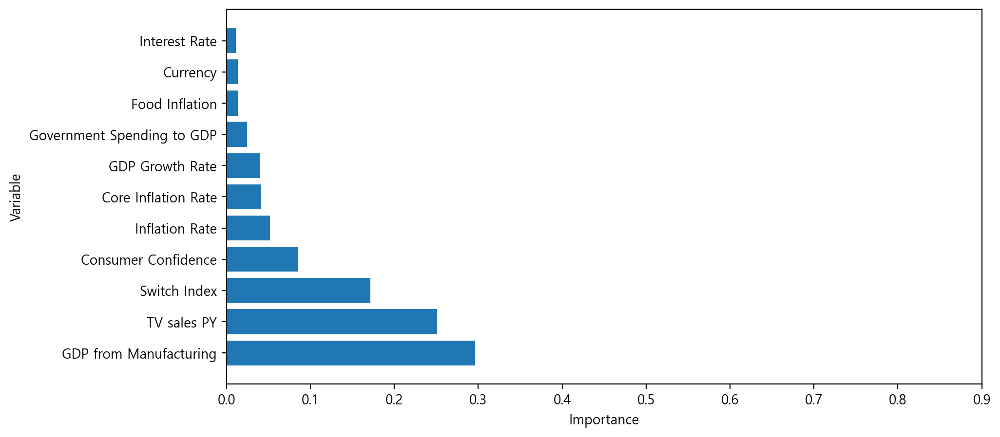

corr: [0.49] / importance: 25.0 %


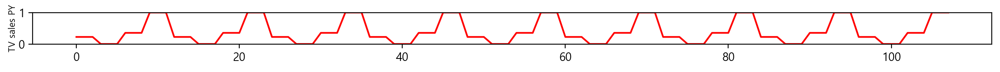

corr: [0.15] / importance: 9.0 %


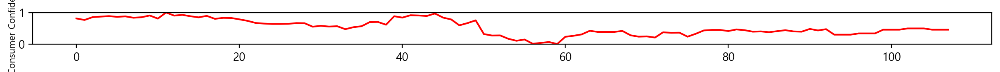

corr: [-0.29] / importance: 4.0 %


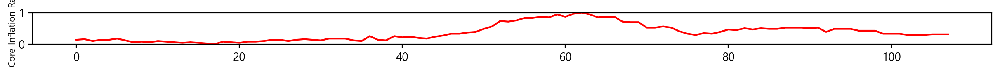

corr: [0.23] / importance: 1.0 %


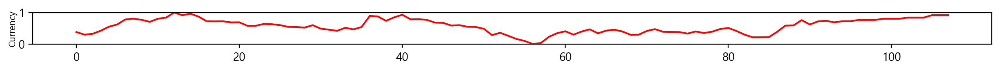

corr: [-0.29] / importance: 1.0 %


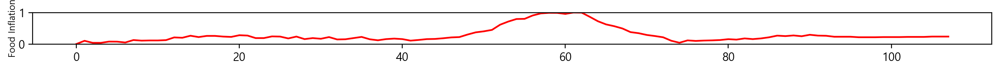

corr: [0.4] / importance: 30.0 %


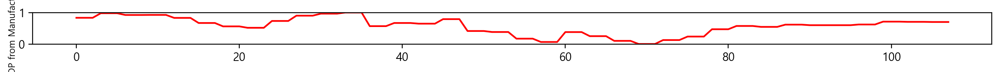

corr: [-0.13] / importance: 4.0 %


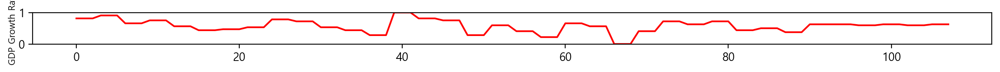

corr: [0.] / importance: 2.0 %


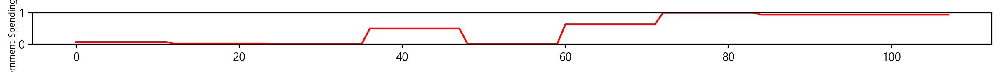

corr: [-0.48] / importance: 5.0 %


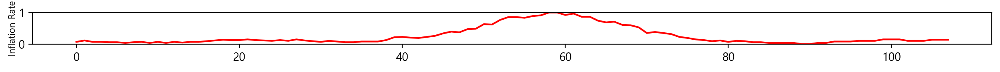

corr: [-0.25] / importance: 1.0 %


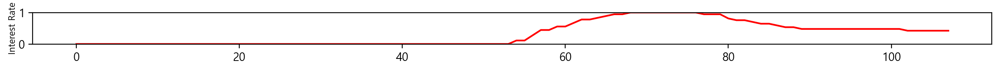

corr: [0.6] / importance: 17.0 %


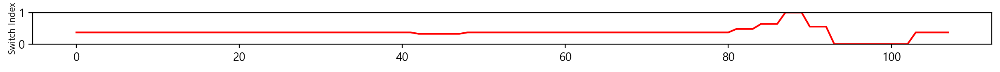

랜덤 포레스트 회귀: 예측 결과


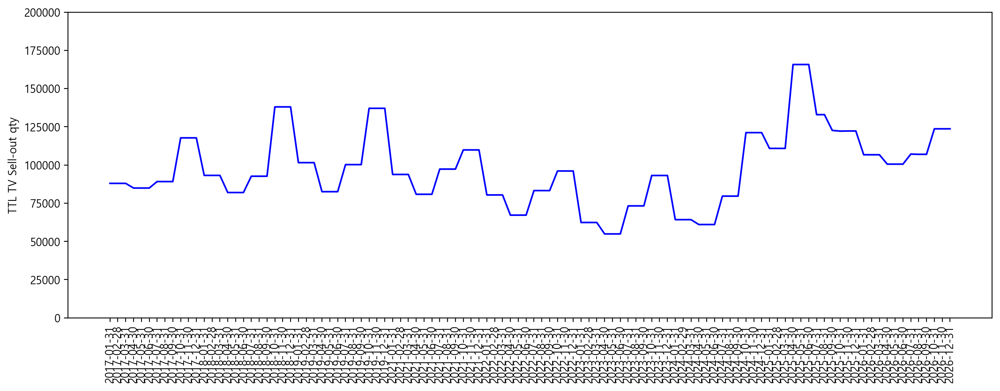

[122600.47 122147.31 122226.17 122226.17 106673.27 106673.27 106673.27
 100542.64 100542.64 100542.64 107114.02 106961.56 106961.56 123642.7
 123642.7  123642.7 ]
[132923.   132923.   122600.47 122147.31 122226.17 122226.17 106673.27
 106673.27 106673.27 100542.64 100542.64 100542.64 107114.02 106961.56
 106961.56 123642.7  123642.7  123642.7 ]
129482.0 122200.0 106673.0 100543.0 107012.0 123643.0


In [148]:
### 인자 selection 파일로 활용 ###
# file_dir10 = "{}/{}/{}/Raw/feature_names_selection.csv".format(ML_dir, PG_dir, subsidiary_name)
file_dir10 = "{}/{}/{}/Raw/feature_names.csv".format(ML_dir, PG_dir, subsidiary_name)

###############################################
###        실행 전 조정 변수 및 Flag        ###
###############################################
m_rows_init = m_rows_init_org       
m_rows_2_init = m_rows_2_init_org     
###############################################

for sub_i in range(sub_i,sub_i+1,1):
    
    ##### flag 추가 24.09.12 #####
    if df_subsidiary["ml_fcst"][sub_i-1] == "Y":

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_2_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_2_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_2_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_2_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)


        ###################################################
        ### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
        ###################################################
        df_features = pd.read_csv(file_dir10)

        if use_google_trends == "N":
            df_features = df_features[~df_features["feature_names"].isin(gt_key)]
        print(df_features.shape)
        df_feature_index = list(df_features["index_s"])
        df_feature_names = list(df_features["feature_names"])

        df_feature_names

        m_feature = len(df_feature_names)
        print(m_feature)
        print(df_feature_index)

        ############################################
        ### df_data 파일 입력으로 변경 21.11.30  ###
        ############################################
        df_data = np.array(df.iloc[:,2:3])

        for n in range(1,m_feature,1):

            df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

        print(df_data.shape)
        df_target = np.array(df[prod_type])

        #df_norm_feature_names = list(df.columns[1:2]) + list(df_feature_names)  
        df_norm_feature_names = list(df_feature_names)  
        df_norm_data = df_data

        df_norm = pd.DataFrame()
        scaler = MinMaxScaler()
        df_norm = pd.DataFrame(scaler.fit_transform(df_norm_data), columns=df_norm_feature_names)
        df_norm.insert(0, prod_type, df[prod_type])
        df_norm.insert(0, 'ds', df["ds"])
        #df_data_trans = np.array(df_norm.iloc[:,2:])

        ##############################
        ### 스케일링값 저장        ###
        ##############################
        ### 구글트렌드 사용시에만 저장 24.06.12 ###
        if use_google_trends == "Y":
            if exclude_covid == "N": # COVID 제외 로직 추가
                df_norm.to_csv(file_dir20, index=True, mode='w', encoding='utf-8-sig')

        #X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, shuffle=False, test_size=t_size)
        X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
        #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=t_size)

        df_importance = pd.DataFrame()

        # 랜덤 포레스트를 사용한 경우의 중요 특성
        # 랜덤 포레스트를 사용한 경우의 중요 특성
        if max_feature_adj == 0 :
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
        elif max_feature_adj == 1 :
            ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)

        rfc.fit(X_train, y_train)

        df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                      'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})


        ### 구글트렌드 사용시에만 저장 24.06.12 ###
        if use_google_trends == "Y":

            if exclude_covid == "N":
                df_importance.to_csv(file_dir7, index=True, mode='w', encoding='utf-8-sig')
            # 23.4.27 COVID 기간 제외기준 추가
            else:
                df_importance.to_csv(file_dir24, index=True, mode='w', encoding='utf-8-sig')

        df_importance = df_importance.sort_values('importance', ascending=False)

        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x))



        print("랜덤 포레스트 회귀")
    #     print("Train 결정계수:", rfc.score(X_train, y_train).round(3))
        plt.figure(figsize=(10,5))
        plt.barh(x.iloc[0:], y.iloc[0:])
        plt.yticks(ypos, x.iloc[0:])
        plt.xlabel('Importance')
        plt.ylabel('Variable')
        plt.xlim(0, 0.9)
        plt.ylim(-1, len(x))
        plt.show()

        y_pred = rfc.predict(X_test)
        y_train_pred = np.concatenate((y_train, y_pred))

        for n in range(1,m_feature+1,1):

            tv_sales = np.array(df_norm.iloc[:,1:2])
            x_feature = np.array(df_norm.iloc[:,n+1:n+2])
            x_feature_name = df_norm.columns[n+1:n+2]
            # print("정확도:", rfc.score(tv_sales, x_feature))
            #print(x_feature_name)
            #print("R2 Score:",r2_score(tv_sales, x_feature).round(3))
            plt.figure(figsize=(15, 0.5))
        #     plt.plot(y_train_pred/(2*10**7), c='b')
            plt.plot(x_feature, c='r')
            plt.ylim((0,1))
            plt.ylabel(x_feature_name[0], labelpad=1, fontdict={'size': 8})
            values = range(len(df["ds"]))
            #plt.xticks(values,df["ds"], rotation='vertical')
            print("corr:", corr_data_pros.xs(x_feature_name[0]).values.round(2), "/ importance:", df_importance["importance"].loc[n-1].round(2)*100,"%")
            plt.show()   

        print("랜덤 포레스트 회귀: 예측 결과")

        plt.figure(figsize=(15, 5))
        plt.plot(y_train_pred, c='b')
        plt.ylabel("TTL TV Sell-out qty")
        plt.ylim((0,max_sales))
        values = range(len(df["ds"]))
        plt.xticks(values,df["ds"], rotation='vertical')
        plt.show()

    #     # 미국 coverage 변경 반영
    #     if subsidiary_name == "02.US":
    #         y_pred = y_pred * 0.918

        print(y_pred)

        if pred_iloc == 0:
            ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
            # Gfk데이터가 분기마감되었을 때
            y_pred_2 = y_pred 
        else:    
            # Gfk데이터가 분기마감+1개월일 때
            y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred)
            # Gfk데이터가 분기마감+2개월일 때
    #     elif pred_iloc == 2:   
    #         y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred)

        print(y_pred_2)

        ### 21.11.30 추가 - 시점에 따라 iloc 변경 ###
        ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
        ### 24.10.07 추가 - Q+5 로 예측구간 확대
        y_pred_q1 = y_pred_2[q_loc:q_loc+3].mean().round(0)
        y_pred_q2 = y_pred_2[q_loc+3:q_loc+6].mean().round(0)
        y_pred_q3 = y_pred_2[q_loc+6:q_loc+9].mean().round(0)
        y_pred_q4 = y_pred_2[q_loc+9:q_loc+12].mean().round(0)
        y_pred_q5 = y_pred_2[q_loc+12:q_loc+15].mean().round(0)
        y_pred_q6 = y_pred_2[q_loc+15:q_loc+18].mean().round(0)
        print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)

        ### 21.11.30 추가 ###
        ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
        ### 24.10.07 추가 - Q+6 로 예측구간 확대
        df4 = pd.DataFrame()
        df4["predict_Q1"] = pd.Series(y_pred_q1)
        df4["predict_Q2"] = pd.Series(y_pred_q2)
        df4["predict_Q3"] = pd.Series(y_pred_q3)
        df4["predict_Q4"] = pd.Series(y_pred_q4)
        df4["predict_Q5"] = pd.Series(y_pred_q5)
        df4["predict_Q6"] = pd.Series(y_pred_q6)


        ### 구글트렌드 사용/미사용 추가 24.06.12 ###            
        if exclude_covid == "Y":
            if google_trends_yn == "Y":
                if use_google_trends == "Y":
                    df4["predict_method"] = "RandomForest_wo_COVID"
                else:
                    df4["predict_method"] = "RandomForest_wo_COVID_wo_GT"
            else:
                df4["predict_method"] = "RandomForest_wo_COVID"

        else:
            if google_trends_yn == "Y":
                if use_google_trends == "Y":
                    df4["predict_method"] = "RandomForest"  
                else:
                    df4["predict_method"] = "RandomForest_wo_GT"
            else:
                df4["predict_method"] = "RandomForest"


        df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
        # .to_csv
        if not os.path.exists(file_dir9):
            df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
        else:
            if first_fcst == "Y":
                df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
            else:
                df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)

# --------------- 여기까지 --------------- #

# ML input과 중요도를 TV시장지수파일로 변환

In [ ]:
if exclude_covid == "N" and use_google_trends == "Y":
    
    df_test = pd.DataFrame()
    df_test_f = pd.DataFrame()

    ###################
    ### 필요시 변경 ###
    ###################
    df_test_f = pd.read_csv(file_dir7)  
    m_rows = 0
    m_cols = 2     
    m_rows_2 = len(df_test_f)+2
    m_cols_2 = len(df_test_f.columns)

    df_test_f = df_test_f.iloc[m_rows:m_rows_2,m_cols:m_cols_2]
    df_test_f = df_test_f.transpose()


    df_test = pd.read_csv(file_dir20)   
    m_rows = 0
    m_cols = 1     
    m_rows_2 = len(df_test)+3
    m_cols_2 = len(df_test.columns)
    print("rows:",m_rows, m_rows_2)
    print("columns:",m_cols, m_cols_2)

    df_test = df_test.iloc[m_rows:m_rows_2,m_cols:m_cols_2]

    wb = load_workbook(file_dir16)
    ws = wb['test_composite']

    try:
        ws1 = wb['test']
        ws1.delete_rows(1,m_rows_2-1)
    except:
        ws1 = wb.create_sheet('test')

    for r in dataframe_to_rows(df_test, index=False, header=True):
        ws1.append(r)


    try:
        ws2 = wb['f']
        ws2.delete_rows(1,3)
    except:
        ws2 = wb.create_sheet('f')

    for r in dataframe_to_rows(df_test_f, index=False, header=True):
        ws2.append(r)


    # 함수 적용
    for j in range(m_cols, m_cols_2, 1):
        for i in range(m_rows+1, m_rows_2-1, 1):
            #ws.cell(row=i+4, column=j).value = "=test!"+chr(64+j)+str(i+1)+""  
            # feature name 부터 가져옴 23.12.21
            ws.cell(row=i+3, column=j).value = ws1.cell(row=i, column=j).value

    # 함수 적용
    for j in range(m_cols, m_cols_2-2, 1):
        for i in range(2, 4, 1):
            ws.cell(row=i-1, column=j+2).value = "=f!"+chr(64+j)+str(i)+""

            
    # 함수 적용 추가 23.12.21
    for j in range(m_cols, m_cols_2-2, 1):
        for i in range(4, 5, 1):
            ws.cell(row=i-1, column=j+2).value = "=IF("+chr(64+j+2)+str(2)+">0,"+chr(64+j+2)+str(1)+",-"+chr(64+j+2)+str(1)+")"
            

    for j in range(m_cols, m_cols_2-2, 1):
        for i in range(5, 6, 1):
            ws.cell(row=i-1, column=j+m_cols_2-1).value = "="+chr(64+j+2)+str(4)+""
    

    #print(chr(65)+chr(65))
        
    if (m_cols_2-3)*2+3 <= 26:
        ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+","+chr(64+((m_cols_2-3)*2+3))+"5:"+chr(64+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
        ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
    elif (m_cols_2-3)*2+3 <= 26*2:
        ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+",A"+chr(64-(26)+((m_cols_2-3)*2+3))+"5:A"+chr(64-(26)+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
        ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
#     for j in range(m_cols, m_cols_2, 1):
#         ws.cell(row=4, column=j).value = ws1.cell(row=1, column=j).value     

    ##########################################
    ###    시장지수 수식 추가 23.05.17     ###
    ##########################################
    # 이후로 붙혀넣기 
    # Feature 함수 적용
    for j in range(m_cols_2, m_cols_2+m_cols_2-3, 1):
        for i in range(m_rows+1, m_rows_2-2, 1):
            ws.cell(row=i+4, column=j).value = "="+chr(64+j-m_cols_2+3)+str(i+4)+"*"+chr(64+j-m_cols_2+3)+"$3"
            

    # Composite 함수 적용
    for j in range(m_cols_2+m_cols_2-3, m_cols_2+m_cols_2-2, 1):
        for i in range(m_rows+1, m_rows_2-2, 1):
            if j-1 <= 26:
                ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":"+chr(64+j-1)+str(i+4)+")"
            elif j-1 <= 26*2:
                ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":A"+chr(64+j-26-1)+str(i+4)+")"
    
        
    # 파일 저장
    wb.save(file_dir16)
    wb.close()
    
    # 데이터프레임으로 변환 후 csv로 저장
    df_region_new = pd.DataFrame()

    app = xw.App(visible=False)
    wbxl= xw.Book(file_dir16)
    sheet = wbxl.sheets['test_composite']
    df_region_new = sheet.range('A4').options(pd.DataFrame, index=False, expand='table').value
    wbxl.close()
    app.kill()

    df_region_new.to_csv(file_dir21, index=False, mode='w', encoding='utf-8-sig')

    
#COVID_YN 리셋
# exclude_covid = exclude_covid_org

# [학습] TV시장지수 기준 머신러닝 학습

In [ ]:
##############################
### item parcelling 테스트 ###
##############################

df = pd.read_csv(file_dir21)

m_rows = m_rows_init_org    
m_rows_2 = m_rows_2_init_org

# if subsidiary_name == "12.AP":
#     m_rows = m_rows - 12    
#     m_rows_2 = m_rows_2 - 12 

# if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질
#     covid_start = covid_start + 12 
#     covid_end = covid_end + 12
    
if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
    m_rows = m_rows + 12         # 2020.01
    m_rows_2 = m_rows_2 + 12     # 2020.12
    

df = df.iloc[:m_rows,:] # 월에 따라 변경
print(df.shape)
############################################
### df_data 파일 입력으로 변경 21.11.30  ###
############################################
df_data = np.array(pd.DataFrame(df["Composite"]))
df_target = np.array(df[prod_type])

scaler = MinMaxScaler()
df_norm = pd.DataFrame(scaler.fit_transform(df_data))
df_norm.insert(0, 'ds', df["ds"])
df_data_trans = np.array(df_norm.iloc[:,1:])

In [ ]:
rfc_train_score = 0
rfc_test_score = 0
rfc_test_adj_score = 0
svm_train_score = 0
svm_test_score = 0

### 100회 실시 ###
for num in range (1,101,1):

    #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
    X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target,test_size=0.2)

    # 랜덤 포레스트를 사용한 경우의 중요 특성
    rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
    rfc.fit(X_train, y_train)

    y_pred = rfc.predict(X_test)
    df2 = pd.DataFrame()
    df2["test"]= pd.Series(y_test)
    df2["predict"] = pd.Series(y_pred)
    df2["num"] = num
    df2["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)
    
    # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
    df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

    df_importance = pd.DataFrame({'feature':'composite','importance':rfc.feature_importances_})
    df_importance = df_importance.sort_values('importance', ascending=False)
    
    df_importance.index.name = "index_s"
    
        
    df_importance["train accuracy"] = rfc.score(X_train, y_train).round(3)
    df_importance["test accuracy"] = rfc.score(X_test, y_test).round(3)
    
    ### 수정 결정계수 분석을 위해 추가 21.12.13
    X_train2 = sm.add_constant(X_train)
    model2 = sm.OLS(y_train, X_train2)
    result = model2.fit()
    df_importance["test ols accuracy"] = result.rsquared.round(3)
    df_importance["test adj accuracy"] = result.rsquared_adj.round(3)
          
    df_importance["num"] = num
    
    
    rfc_train_score = rfc_train_score + rfc.score(X_train, y_train).round(3)
    rfc_test_score = rfc_test_score + rfc.score(X_test, y_test).round(3)
    rfc_test_adj_score = rfc_test_adj_score + result.rsquared_adj.round(3)

    # .to_csv 
    # 최초 생성 이후 mode는 append      
    if not os.path.exists(file_dir11):
        df_importance.to_csv(file_dir11, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df_importance.to_csv(file_dir11, index=True, mode='w', encoding='utf-8-sig')
        else:
            df_importance.to_csv(file_dir11, index=True, mode='a', encoding='utf-8-sig', header=False)
    
    # .to_csv 
    # 최초 생성 이후 mode는 append      
    if not os.path.exists(file_dir8):
        df2.to_csv(file_dir8, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df2.to_csv(file_dir8, index=True, mode='w', encoding='utf-8-sig')
        else:
            df2.to_csv(file_dir8, index=True, mode='a', encoding='utf-8-sig', header=False)
            

                    
    ###################################################
    ##################   light GBM   ##################
    ###################################################    
    
    lgbm = LGBMRegressor()

    lgbm.fit(X_train, y_train)
    y_pred = lgbm.predict(X_test)
    
    
    df3 = pd.DataFrame()
    df3["test"]= pd.Series(y_test)
    df3["predict"] = pd.Series(y_pred)
    df3["num"] = num
    df3["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)
    
    lgbm_test_score = r2_score(y_test, y_pred)
    
    
    if not os.path.exists(file_dir12):
        df3.to_csv(file_dir12, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df3.to_csv(file_dir12, index=True, mode='w', encoding='utf-8-sig')        
        else:
            df3.to_csv(file_dir12, index=True, mode='a', encoding='utf-8-sig', header=False)

    
    
    ###################################################
    ##########     SVM (서포트 벡터 머신)    ##########
    ###################################################

#     sc = StandardScaler()
#     X_train_2 = sc.fit_transform(X_train)
#     X_test_2 = sc.transform(X_test)    
 
    

    svm_parameters = [{'kernel': ['linear'], 'gamma': [0.001, 0.01, 0.1, 1], 
                      'C': [100000, 1000000, 10000000]}]
    svm = GridSearchCV(SVR(), svm_parameters)
    svm.fit(X_train, y_train)
#     print(svm.best_score_.round(3))     # 최고 점수
#     print(svm.best_params_)    # 최고 점수를 낸 파라미터


    svm_reg = SVR(kernel=svm.best_params_['kernel'], C=svm.best_params_['C'], gamma=svm.best_params_['gamma']) #linear추가
    svm_reg.fit(X_train,y_train)
    y_pred_svr = svm_reg.predict(X_test)
    
    df5 = pd.DataFrame()
    df5["test"]= pd.Series(y_test)
    df5["predict"] = pd.Series(y_pred_svr)
    df5["num"] = num
    df5["accuracy"] = 1 - (abs(y_test-y_pred_svr)/y_test)
    
    # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
    df5.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))
      
    coef = abs(svm_reg.coef_.ravel())

  
    df_importance_2 = pd.DataFrame({'feature':'composite','importance':coef })
    df_importance_2 = df_importance_2.sort_values('importance', ascending=False)
  
        
    df_importance_2["train accuracy"] = svm_reg.score(X_train, y_train).round(3)
    df_importance_2["test accuracy"] = svm_reg.score(X_test, y_test).round(3)
    df_importance_2["num"] = num
    
    svm_train_score = svm_train_score + svm_reg.score(X_train, y_train).round(3)
    svm_test_score = svm_test_score + svm_reg.score(X_test, y_test).round(3)
    
    # .to_csv 
    # 최초 생성 이후 mode는 append
    if not os.path.exists(file_dir15):
        df_importance_2.to_csv(file_dir15, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df_importance_2.to_csv(file_dir15, index=True, mode='w', encoding='utf-8-sig')
        else:
            df_importance_2.to_csv(file_dir15, index=True, mode='a', encoding='utf-8-sig', header=False)
        
    if not os.path.exists(file_dir13):
        df5.to_csv(file_dir13, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df5.to_csv(file_dir13, index=True, mode='w', encoding='utf-8-sig')        
        else:
            df5.to_csv(file_dir13, index=True, mode='a', encoding='utf-8-sig', header=False)
    
                 
            
print("랜덤 포레스트 회귀")
print("Train 결정계수:", (rfc_train_score/num).round(3))
print("Test 결정계수:", (rfc_test_score/num).round(3))

print("light GBM")
#print("Train 정확도:", (lgbm_train_score/num).round(3))
print("Test 정확도:", (lgbm_test_score/num).round(3))

print("SVM 서포트 벡터 머신")
print("Train 정확도:", (svm_train_score/num).round(3))
print("Test 정확도:", (svm_test_score/num).round(3))

In [ ]:
print("TV시장 판매수량 시장지수 회귀: 예측 결과")

df_pred = pd.DataFrame()

if exclude_covid == "N": # COVID 제외 로직 추가           
    df_pred = pd.read_csv(file_dir8, index_col=0)
    df_pred = df_pred.sort_values(by='ds')
    df_pred.reset_index(drop=True, inplace=True)
    fig = plt.figure(figsize=(15, 5))
    sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
    sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
    plt.xticks(rotation=45)
    plt.show()

# [예측] TV시장지수 기준 Q+1~Q+2 예측

In [ ]:
##############################
### item parcelling 테스트 ###
##############################

df = pd.read_csv(file_dir21)
    
m_rows = m_rows_init_org    
m_rows_2 = m_rows_2_init_org 

# if subsidiary_name == "12.AP":
#     m_rows = m_rows - 12    
#     m_rows_2 = m_rows_2 - 12 

if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
    m_rows = m_rows + 12         
    m_rows_2 = m_rows_2 + 12     

df = df.iloc[:m_rows_2,:]
print(df.shape)

############################################
### df_data 파일 입력으로 변경 21.11.30  ###
############################################
df_data = np.array(pd.DataFrame(df["Composite"]))
df_target = np.array(df[prod_type])

scaler = MinMaxScaler()
df_norm = pd.DataFrame(scaler.fit_transform(df_data))
df_norm.insert(0, 'ds', 1)
df_data_trans = np.array(df_norm.iloc[:,1:])

#X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, test_size=t_size)
X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, shuffle=False, test_size=t_size)
#X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
#X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=t_size)

In [ ]:
# 랜덤 포레스트를 사용한 경우의 중요 특성
rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
rfc.fit(X_train, y_train)

df_importance = pd.DataFrame({'feature':"composite",'importance':rfc.feature_importances_ })
df_importance = df_importance.sort_values('importance', ascending=False)
x = df_importance.feature
y = df_importance.importance
ypos = np.arange(len(x))

print("랜덤 포레스트 회귀")
#print("Test 결정계수:", (rfc_test_score/num).round(3))
#print("Train 정확도:", rfc.score(X_train, y_train).round(3))
#print("Test 정확도:", rfc.score(X_test, y_test).round(3))
# plt.figure(figsize=(10,1))
# plt.barh(x.iloc[0:], y.iloc[0:])
# plt.yticks(ypos, x.iloc[0:])
# plt.xlabel('Importance')
# plt.ylabel('Variable')
# plt.xlim(0, 1)
# plt.ylim(-1, len(x))
# plt.show()

y_pred = rfc.predict(X_test)
y_train_pred = np.concatenate((y_train, y_pred))


###################################################
##########     SVM (서포트 벡터 머신)    ##########
###################################################


svm_parameters = [{'kernel': ['linear'], 'gamma': [0.001, 0.01, 0.1, 1], 
                  'C': [100000, 1000000, 10000000]}]
svm = GridSearchCV(SVR(), svm_parameters)
svm.fit(X_train, y_train)
#print(svm.best_score_.round(3))     # 최고 점수
#print(svm.best_params_)    # 최고 점수를 낸 파라미터


svm_reg = SVR(kernel=svm.best_params_['kernel'], C=svm.best_params_['C'], gamma=svm.best_params_['gamma']) #linear추가
svm_reg.fit(X_train,y_train)
y_pred_svr = svm_reg.predict(X_test)
y_train_pred_svr = np.concatenate((y_train, y_pred_svr))


print("랜덤 포레스트 회귀: 예측 결과")

plt.figure(figsize=(15, 3))
plt.plot(y_train_pred, c='b')
plt.ylabel("TTL TV Sell-out qty")
plt.ylim((0,max_sales))
values = range(len(df["ds"]))
plt.xticks(values,df["ds"], rotation='vertical')
plt.show()

plt.figure(figsize=(15, 3))
plt.plot(y_train_pred_svr, c='b')
plt.ylabel("TTL TV Sell-out qty")
plt.ylim((0,max_sales))
values = range(len(df["ds"]))
plt.xticks(values,df["ds"], rotation='vertical')
plt.show()

plt.figure(figsize=(15, 3))
plt.plot(df_data_trans, c='r')
plt.ylim((-0.5,1))
plt.ylabel("composite", labelpad=23)
values = range(len(df["ds"]))
plt.xticks(values,df["ds"], rotation='vertical')
plt.show() 

In [ ]:
#미국 coverage 변경 반영
# if subsidiary_name == "02.US":
#    y_pred = y_pred * 0.918
#    y_pred_svr = y_pred_svr * 0.918

print(y_pred.round(0))
print(y_pred_svr.round(0))

In [ ]:
if pred_iloc == 0:
    ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
    # Gfk데이터가 분기마감되었을 때
    y_pred_2 = y_pred 
else:
    # Gfk데이터가 분기마감+1개월일 때
    y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred)
# elif pred_iloc == 2:
#     # Gfk데이터가 분기마감+2개월일 때
#     y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred)



### 21.11.30 추가 - 시점에 따라 iloc 변경 ###
### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대 
### 24.10.07 추가 - Q+5 로 예측구간 확대
y_pred_q1 = y_pred_2[q_loc:q_loc+3].mean().round(0)
y_pred_q2 = y_pred_2[q_loc+3:q_loc+6].mean().round(0)
y_pred_q3 = y_pred_2[q_loc+6:q_loc+9].mean().round(0)
y_pred_q4 = y_pred_2[q_loc+9:q_loc+12].mean().round(0)
y_pred_q5 = y_pred_2[q_loc+12:q_loc+15].mean().round(0)
y_pred_q6 = y_pred_2[q_loc+15:q_loc+18].mean().round(0)


if pred_iloc == 0:   
    ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
    # Gfk데이터가 분기마감되었을 때
    y_pred_svr_2 = y_pred_svr
else:
    # Gfk데이터가 분기마감+1개월일 때
    y_pred_svr_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred_svr)
#     elif pred_iloc == 2:
#         # Gfk데이터가 분기마감+2개월일 때
#         y_pred_svr_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred_svr)
y_pred_svr_2

y_pred_svr_q1 = y_pred_svr_2[q_loc:q_loc+3].mean().round(0)
y_pred_svr_q2 = y_pred_svr_2[q_loc+3:q_loc+6].mean().round(0)
y_pred_svr_q3 = y_pred_svr_2[q_loc+6:q_loc+9].mean().round(0)
y_pred_svr_q4 = y_pred_svr_2[q_loc+9:q_loc+12].mean().round(0)
y_pred_svr_q5 = y_pred_svr_2[q_loc+12:q_loc+15].mean().round(0)
y_pred_svr_q6 = y_pred_svr_2[q_loc+15:q_loc+18].mean().round(0)

print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)
print(y_pred_svr_q1, y_pred_svr_q2, y_pred_svr_q3, y_pred_svr_q4, y_pred_svr_q5, y_pred_svr_q6)


In [ ]:
### 21.11.30 추가 ###
### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
### 24.10.07 추가 - Q+5 로 예측구간 확대
df4 = pd.DataFrame()
df4["predict_Q1"] = pd.Series(y_pred_q1)
df4["predict_Q2"] = pd.Series(y_pred_q2)
df4["predict_Q3"] = pd.Series(y_pred_q3)
df4["predict_Q4"] = pd.Series(y_pred_q4)
df4["predict_Q5"] = pd.Series(y_pred_q5)
df4["predict_Q6"] = pd.Series(y_pred_q6)

df4["predict_method"] = "RandomForest_composite"
df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
# .to_csv
if not os.path.exists(file_dir9):
    df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
else:
    if first_fcst == "Y":
        df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
    else:
        df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)

df4["predict_Q1"] = pd.Series(y_pred_svr_q1)
df4["predict_Q2"] = pd.Series(y_pred_svr_q2)
df4["predict_Q3"] = pd.Series(y_pred_svr_q3)
df4["predict_Q4"] = pd.Series(y_pred_svr_q4)
df4["predict_Q5"] = pd.Series(y_pred_svr_q5)

df4["predict_method"] = "RandomForest_composite_SVM"
df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
# .to_csv
if not os.path.exists(file_dir9):
    df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
else:
    df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)

# 시장지수파일만 생성 한번에 실행하기

In [ ]:
for sub_i in tqdm.tqdm_notebook(range(1,subs_no,1)):
# for sub_i in tqdm.tqdm_notebook(range(10,11,1)):
    
##############################################################################################################
### sub_i = CI 1, US 2, DG 3, ES 4, FS 5, IS 6, PL 7, UK 8, MS 9, SP 10, TK 11, AP 12, VH 13, IL 14, RA 15, CL 16  ###
##############################################################################################################


##### DX Signal 법인만 추출 #####
# dx_signal_sub = [1]
# for sub_i in tqdm.tqdm_notebook(dx_signal_sub):
#################################


    m_rows_init = m_rows_init_org
    m_rows_2_init = m_rows_2_init_org

    file_dir_sub = r"D:\05. SCM DX개선\{}\0.ALL\subsidiary_name.csv".format(PG_dir)
    # 법인정보 가져오기 #
    df_subsidiary = pd.DataFrame()
    df_subsidiary = pd.read_csv(file_dir_sub)
    print("-------")
    print(df_subsidiary.shape)
    df_subsidiary_name = list(df_subsidiary["subsidiary_name"])
    subsidiary_name = df_subsidiary_name[sub_i-1]
    print("법인명: "+subsidiary_name)
    
    file_dir = "D:/05. SCM DX개선/{}/{}/Raw/historical_indicator_Q.csv"
    file_dir2 = "D:/05. SCM DX개선/{}/{}/corr_data.csv"
    file_dir3 = "D:/05. SCM DX개선/{}/{}/regression_data.csv"
    file_dir4 = "D:/05. SCM DX개선/{}/{}/regression_pred_data.csv"
    file_dir5 = "D:/05. SCM DX개선/{}/{}/regression_data_m.csv"
    file_dir6 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m.csv"
    file_dir7 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f.csv"
    file_dir8 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c.csv"
    file_dir9 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_fn.csv"
    file_dir10 = "D:/05. SCM DX개선/{}/{}/Raw/feature_names.csv"
    file_dir11 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c.csv"
    file_dir12 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_lgbm.csv"
    file_dir13 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_svm.csv"
    file_dir14 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_lgbm.csv"
    file_dir15 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c_svm.csv"
    file_dir16 = "D:/05. SCM DX개선/{}/{}/test_composite.xlsx"
    file_dir17 = "D:/05. SCM DX개선/{}/{}/regression_data_m_woc.csv"
    file_dir18 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_woc.csv"
    file_dir19 = "D:/05. SCM DX개선/{}/{}/corr_data_wo_covid.csv"
    file_dir20 = "D:/05. SCM DX개선/{}/{}/test.csv"
    file_dir21 = "D:/05. SCM DX개선/{}/{}/test_composite_Q.csv"
    file_dir22 = "D:/05. SCM DX개선/{}/{}/regression_data_woc.csv"
    file_dir23 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_woc.csv"
    file_dir24 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f_woc.csv"
    file_dir25 = "D:/05. SCM DX개선/{}/{}/regression_data_m_lgbm.csv"
  

    df = pd.read_csv(file_dir)

    covid_start = 0
    covid_end = 0
    covid_range = 0


    if exclude_covid == "Y":
        covid_start = df[df["COVID_YN"]==1].index[0:].min()   # COVID 시작
        covid_end = df[df["COVID_YN"]==1].index[0:].max()+1   # COVID 끝

    # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질 2016년 부터
    #     covid_start = covid_start + 12 
    #     covid_end = covid_end + 12

    covid_range = covid_end - covid_start
    exclude_covid_org = exclude_covid

    if np.isnan(covid_range):
        exclude_covid = "N" # Pent-up 수요기간 없을 경우


    # 23.04.12 제외 
    # if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
    #     df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
    #     df = df.reset_index(drop=True)

    print(df.shape)
    print("COVID 구간 제외 여부: ",exclude_covid)
    print("COVID 구간 : ",covid_range)
    df_org = df.copy()


    # 23.4.12 추가
    if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
        m_rows_init = m_rows_init + 12         # 2020.01
        m_rows_2_init = m_rows_2_init + 12     # 2020.12

    m_rows = m_rows_init    
    m_rows_2 = m_rows_2_init  


    ### m_rows 추가 조정 ###
    if exclude_covid == "Y" :
        m_rows = m_rows-covid_range
        m_rows_2 = m_rows_2-covid_range

    # 23.4.12 제외
    # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
    #     m_rows = m_rows + 12         # 2020.01
    #     m_rows_2 = m_rows_2 + 12     # 2020.12
    ### m_rows 추가 조정 ###


    t_size = m_rows_2-m_rows     # 예측기간
    q_loc = 0      # Q+1 시작점


    org_feature_no = df.shape[1]-2 # Features
    max_feature_adj = 0 # max_feature 조정시 1 / 아닐경우 0
    max_feature_no = 0 

    # if subsidiary_name == "07.PL" or subsidiary_name == "09.MS": # Seasonality 종속성 완화
    #     max_feature_adj = 1
    #     max_feature_no = 7

    # if subsidiary_name == "01.CI" or subsidiary_name == "14.IL" or subsidiary_name == "06.IS": # Seasonality 종속성 완화
    #     max_feature_adj = 1
    #     max_feature_no = 8

    # if subsidiary_name == "02.US": # Seasonality 종속성 완화
    #     max_feature_adj = 1
    #     max_feature_no = 8

    # if subsidiary_name == "08.UK": # Seasonality 종속성 완화
    #     max_feature_adj = 1
    #     max_feature_no = 12

    max_feature_adj = df_subsidiary["dependency"][sub_i-1]
    max_feature_no = df_subsidiary["max_no"][sub_i-1]
    mov_no = df_subsidiary["mov"][sub_i-1]

    print("max_feature 조정값:(No=0/Yes=1)", max_feature_adj)
    print("max_feature 갯수:", max_feature_no)
    print("feature 범위: 0 ~ -", mov_no,"개월")
    

    # M0 ~ M+6 TV sales와 인자별 상관계수 분석
    # 상관분석 M+1

    # for mov in range (1,7,1):    # 6개월 선행관계 확인
    for mov in range (0,7,1):    # 6개월 선행관계 확인

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df_org.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)

        # 24.01.29 변경 mov=0 추가
        if mov == 0:
            ######
            df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+1]
            df = pd.concat([df_TV_sales, df_features], axis=1)
            ######
        else:

            # 23.4.12 변경
            df_features = df_org.iloc[covid:covid+1,3:org_feature_no+1]
            for item in range (1, mov, 1):
                df_features = df_features.append(df_org.iloc[covid:covid+1,3:org_feature_no+1], ignore_index=True)
            # 변경 완료

            df_features = df_features.append(df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2], ignore_index=True)

            df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

    #     if mov == 1:
        if mov == 0:
            print(df.shape)

        df_cor = df.corr()
        num = df_cor._get_numeric_data()
        num[num < 0] = num*-1

        corr_data_pros = pd.DataFrame()
        corr_data_cons = pd.DataFrame()
        corr_data_pros = df.corr().iloc[:,[0]]
        corr_data_cons = df.corr().iloc[:,[0]]
        corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
        corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

        corr_data_pros["mov"] = mov

                
    # TV sales vs 지표별 상관계수

    # 파일 열기
    df = pd.read_csv(file_dir)

    df_TV_sales = pd.DataFrame()
    df_features = pd.DataFrame()
    df_features_mov = pd.DataFrame()

    df_TV_sales = df.iloc[covid:m_rows_init,:3]

    df_TV_sales = df_TV_sales.reset_index(drop=True)


    # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
    df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
    df = pd.concat([df_TV_sales, df_features], axis=1)


    # 23.4.12 변경
    # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

    # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
    # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
    # df = pd.concat([df_TV_sales, df_features], axis=1)

    # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
    # for item in range (2, mov_no+1, 1):

    # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

    # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
    # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
    # df = pd.concat([df_TV_sales, df_features], axis=1)

    for item in range (1, mov_no+1, 1):
        if item == 1:
            df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
            df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

        else:
            df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
            df_features_mov = df_features_mov.fillna(method='bfill')

        new_cols = []
        for col in df_features_mov.columns:
            new_col = str(col + "_" + str(item))
            new_cols.append(new_col)

        df_features_mov.columns = new_cols

        df = pd.concat([df, df_features_mov], axis=1)
    #변경 완료


    # 23.4.12 추가
    if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
        df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
        df = df.reset_index(drop=True)

    print(df.shape)  


    df_cor = df.corr()
    num = df_cor._get_numeric_data()
    num[num < 0] = num*-1

    corr_data = pd.DataFrame()
    corr_data_pros = pd.DataFrame()
    corr_data_cons = pd.DataFrame()
    corr_data = df.corr().iloc[:,[0]]
    corr_data_pros = df.corr().iloc[:,[0]]
    corr_data_cons = df.corr().iloc[:,[0]]
    corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
    corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

    plt.figure(figsize=(1,3))
    sns.heatmap(data = corr_data_pros.iloc[1:14,[0]], annot=True, 
    fmt = '.2f', linewidths=.3, cmap='Blues')
    plt.figure(figsize=(1,3))
    sns.heatmap(data = corr_data_cons.iloc[:12,[0]], annot=True, 
    fmt = '.2f', linewidths=.3, cmap='Reds')

    corr_data_pros_index1 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[1:3].tolist() + corr_data_pros.index[4:5].tolist() + corr_data_pros.index[6:9].tolist()
    corr_data_pros_index2 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[8:14].tolist()
    corr_data_pros_index3 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[14:20].tolist()
    corr_data_cons_index1 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[0:6].tolist()
    corr_data_cons_index2 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[6:12].tolist()
    print(corr_data_pros_index1)
    print(corr_data_cons_index1)

    ### 그래프 최대값 ###
    max_sales = (max(df[prod_type]) // 10**(len(str(int(max(df[prod_type])))) - 1) + 1) * 10**(len(str(int(max(df[prod_type])))) - 1)


    #########################################################
    ######## ----- 여기까지 필수로 실행할 것 ----- ##########
    #########################################################

    

    
            
    # ML Input 중요도 TV시장지수파일로 변환     
    if exclude_covid == "N":

        df_test = pd.DataFrame()
        df_test_f = pd.DataFrame()

        ###################
        ### 필요시 변경 ###
        ###################
        df_test_f = pd.read_csv(file_dir7)  
        m_rows = 0
        m_cols = 2     
        m_rows_2 = len(df_test_f)+2
        m_cols_2 = len(df_test_f.columns)

        df_test_f = df_test_f.iloc[m_rows:m_rows_2,m_cols:m_cols_2]
        df_test_f = df_test_f.transpose()


        df_test = pd.read_csv(file_dir20)   
        m_rows = 0
        m_cols = 1     
        m_rows_2 = len(df_test)+3
        m_cols_2 = len(df_test.columns)
        print("rows:",m_rows, m_rows_2)
        print("columns:",m_cols, m_cols_2)

        df_test = df_test.iloc[m_rows:m_rows_2,m_cols:m_cols_2]

        wb = load_workbook(file_dir16)
        ws = wb['test_composite']

        try:
            ws1 = wb['test']
            ws1.delete_rows(1,m_rows_2-1)
        except:
            ws1 = wb.create_sheet('test')

        for r in dataframe_to_rows(df_test, index=False, header=True):
            ws1.append(r)


        try:
            ws2 = wb['f']
            ws2.delete_rows(1,3)
        except:
            ws2 = wb.create_sheet('f')

        for r in dataframe_to_rows(df_test_f, index=False, header=True):
            ws2.append(r)


        # 함수 적용
        for j in range(m_cols, m_cols_2, 1):
            for i in range(m_rows+1, m_rows_2-1, 1):
                #ws.cell(row=i+4, column=j).value = "=test!"+chr(64+j)+str(i+1)+""  
                # feature name 부터 가져옴 23.12.21
                ws.cell(row=i+3, column=j).value = ws1.cell(row=i, column=j).value

        # 함수 적용
        for j in range(m_cols, m_cols_2-2, 1):
            for i in range(2, 4, 1):
                ws.cell(row=i-1, column=j+2).value = "=f!"+chr(64+j)+str(i)+""


        # 함수 적용 추가 23.12.21
        for j in range(m_cols, m_cols_2-2, 1):
            for i in range(4, 5, 1):
                ws.cell(row=i-1, column=j+2).value = "=IF("+chr(64+j+2)+str(2)+">0,"+chr(64+j+2)+str(1)+",-"+chr(64+j+2)+str(1)+")"


        for j in range(m_cols, m_cols_2-2, 1):
            for i in range(5, 6, 1):
                ws.cell(row=i-1, column=j+m_cols_2-1).value = "="+chr(64+j+2)+str(4)+""


        #print(chr(65)+chr(65))

        if (m_cols_2-3)*2+3 <= 26:
            ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+","+chr(64+((m_cols_2-3)*2+3))+"5:"+chr(64+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
            ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
        elif (m_cols_2-3)*2+3 <= 26*2:
            ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+",A"+chr(64-(26)+((m_cols_2-3)*2+3))+"5:A"+chr(64-(26)+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
            ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
    #     for j in range(m_cols, m_cols_2, 1):
    #         ws.cell(row=4, column=j).value = ws1.cell(row=1, column=j).value     

        ##########################################
        ###    시장지수 수식 추가 23.05.17     ###
        ##########################################
        # 이후로 붙혀넣기 
        # Feature 함수 적용
        for j in range(m_cols_2, m_cols_2+m_cols_2-3, 1):
            for i in range(m_rows+1, m_rows_2-2, 1):
                ws.cell(row=i+4, column=j).value = "="+chr(64+j-m_cols_2+3)+str(i+4)+"*"+chr(64+j-m_cols_2+3)+"$3"


        # Composite 함수 적용
        for j in range(m_cols_2+m_cols_2-3, m_cols_2+m_cols_2-2, 1):
            for i in range(m_rows+1, m_rows_2-2, 1):
                if j-1 <= 26:
                    ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":"+chr(64+j-1)+str(i+4)+")"
                elif j-1 <= 26*2:
                    ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":A"+chr(64+j-26-1)+str(i+4)+")"


        # 파일 저장
        wb.save(file_dir16)
        wb.close()

        # 데이터프레임으로 변환 후 csv로 저장
        df_region_new = pd.DataFrame()

        app = xw.App(visible=False)
        wbxl= xw.Book(file_dir16)
        sheet = wbxl.sheets['test_composite']
        df_region_new = sheet.range('A4').options(pd.DataFrame, index=False, expand='table').value
        wbxl.close()
        app.kill()

        df_region_new.to_csv(file_dir21, index=False, mode='w', encoding='utf-8-sig')
    
        #COVID_YN 리셋
        exclude_covid = exclude_covid_org